**Author:** Rutendo F. Sigauke

# Load libraries

In [1]:
library(data.table)
library(ggplot2)
library(cowplot)
library(RColorBrewer) ## color palettes
library(WGCNA)
library(dplyr)

Loading required package: dynamicTreeCut

Loading required package: fastcluster


Attaching package: ‘fastcluster’


The following object is masked from ‘package:stats’:

    hclust





Attaching package: ‘WGCNA’


The following object is masked from ‘package:stats’:

    cor



Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




# Import data

## Significant pairs

In [2]:
sig_pairs_path <- "/Users/rusi2317/projects/meta_analysis_qc_reviews/processed_data/correlations_significant"

##get paths for the tables
corr_sig_files <- list.files(path=sig_pairs_path,
                         pattern="tsv.gz",
                         full.names=TRUE)

##load all correlation files 
corr_sig_DT_list <- lapply(corr_sig_files,
                       data.table::fread,
                       nThread = 10) 

In [3]:
corr_sig_DT <- do.call(rbind, corr_sig_DT_list)
nrow(corr_sig_DT)
head(corr_sig_DT, 3)

[1] 12697055

transcript1_chrom,transcript1_start,transcript1_stop,transcript_1,transcript1_score,transcript1_strand,transcript2_chrom,transcript2_start,transcript2_stop,transcript_2,⋯,pval,adj_p_BH,nObs,t,distance_tss,distance_tes,position,tissue,percent_transcribed_both,bidirectional_location
<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,⋯,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<chr>
chr10,46887,48546,TUBB8:NM_177987.3,.,-,chr10,749695,750013,chr10:749695-750013,⋯,2.806579e-05,0.0003002834,4,188.756638,-701308,-702967,upstream,blood,1.801802,intergenic
chr10,46887,48546,TUBB8:NM_177987.3,.,-,chr10,969848,970172,chr10:969848-970172,⋯,3.415461e-04,0.0026924465,40,3.935736,-921464,-923123,upstream,blood,18.018018,intergenic
chr10,46887,48546,TUBB8:NM_177987.3,.,-,chr10,972700,973240,chr10:972700-973240,⋯,2.162608e-04,0.0018123629,47,4.024305,-924424,-926083,upstream,blood,21.171171,intergenic


In [4]:
##adding pair ids and gene ids
corr_sig_DT$pair_id <- paste0(corr_sig_DT$transcript_1, 
                             "~",
                             corr_sig_DT$transcript_2)
corr_sig_DT$gene_id <- as.character(lapply(strsplit(corr_sig_DT$transcript_1, ':'),
                                                    `[`, 1))
length(unique(corr_sig_DT$pair_id))

[1] 6700460

In [5]:
#adding a more stringent filter
corr_sig_strict_DT <- subset(corr_sig_DT, adj_p_BH < 0.001) #& nObs >= 10) #minimal diffirence when nObs was added
length(unique(corr_sig_strict_DT$pair_id))

[1] 4853276

## Bidirectional gene overlaps

In [6]:
##load bidirectionals overlapping genes
bidir_overlaps <- data.table::fread("/Users/rusi2317/projects/meta_analysis_qc_reviews/annotations/hg38_tfit_dreg_bidirectionals_in_genes_true_annotations.bed",
                                   sep="\t")
colnames(bidir_overlaps) <- c('chrom','start','end','bidirs',
                             'score','strand', 'gene_chrom',
                             'gene_start','gene_end','gene_id',
                             'gene_score','gene_strand','overlap_len')
bidir_overlaps$bidirs <- paste0(bidir_overlaps$chrom,':',
                              bidir_overlaps$start,'-',
                              bidir_overlaps$end)

##bidirectional regions widths that overlap with genes
bidir_overlaps$bidir_width <- as.numeric(bidir_overlaps$end) - as.numeric(bidir_overlaps$start)
bidir_overlaps$bidir_overlap_perc <- bidir_overlaps$overlap_len/bidir_overlaps$bidir_width
bidir_overlaps$pair_id <- paste0(bidir_overlaps$gene_id,
                                "~",
                                bidir_overlaps$bidirs)

nrow(bidir_overlaps)
head(bidir_overlaps, 3)

[1] 900203

chrom,start,end,bidirs,score,strand,gene_chrom,gene_start,gene_end,gene_id,gene_score,gene_strand,overlap_len,bidir_width,bidir_overlap_perc,pair_id
<chr>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<chr>
chr1,12182,12456,chr1:12182-12456,1,.,chr1,11873,14409,DDX11L1:NR_046018.2,.,+,274,274,1,DDX11L1:NR_046018.2~chr1:12182-12456
chr1,13264,13506,chr1:13264-13506,14,.,chr1,11873,14409,DDX11L1:NR_046018.2,.,+,242,242,1,DDX11L1:NR_046018.2~chr1:13264-13506
chr1,14655,14811,chr1:14655-14811,14,.,chr1,14361,29370,WASH7P:NR_024540.1,.,-,156,156,1,WASH7P:NR_024540.1~chr1:14655-14811


In [7]:
intragenic_bidirs_true <- unique(bidir_overlaps$bidirs)
length(intragenic_bidirs_true)

[1] 511237

In [8]:
#label the bidirectionals that fall in gene coordinates as intragenic and the rest intergenic
corr_sig_strict_DT$bidir_type <- ifelse(corr_sig_strict_DT$transcript_2 %in% intragenic_bidirs_true,
                                         "intragenic",
                                         "intergenic")

## GTEx supported pairs

In [9]:
# these are eQTLs where the SNP overlaps bidirectional call and the genes are the same, also the tissues match
# these overlaps were done with the loose cut-off pairs (adj_p_BH < 0.01)
gtex_overlaps_path <- "/Users/rusi2317/projects/meta_analysis_qc_reviews/processed_data/gtex_eqtl_nascent_pairs_matched/sig_pair_gtex_overlaps_matched_tissue.tsv.gz"
sig_pair_gtex_overlaps_matched_tissue <- data.table::fread(gtex_overlaps_path)

# add a more stringent filter for the pairs
stringent_sig_pair_gtex_overlaps_matched_tissue <- subset(sig_pair_gtex_overlaps_matched_tissue,
                                                         adj_p_BH < 0.001)

length(unique(stringent_sig_pair_gtex_overlaps_matched_tissue$pair_id))

[1] 78616

## ChIA-PET loops

In [10]:
overlap_looped_DT <- data.table::fread("/Users/rusi2317/projects/meta_analysis_qc_reviews/processed_data/3d_overlap/nascent_pairs_with_loop/hg38_dbnascent_pairs_with_all_chiapet_by_tissue.tsv.gz")
overlap_looped_DT$gene_transcript <- as.character(lapply(strsplit(overlap_looped_DT$pair_id, '~'),
                                                    `[`, 1))
overlap_looped_DT$bidir_id <- as.character(lapply(strsplit(overlap_looped_DT$pair_id, '~'),
                                                    `[`, 2))
head(overlap_looped_DT, 3)

pair_id,tissue,gene_transcript,bidir_id
<chr>,<chr>,<chr>,<chr>
LARP4B-DT:NR_120629.1~chr10:969848-970172,blood,LARP4B-DT:NR_120629.1,chr10:969848-970172
GTPBP4:NM_012341.3~chr10:791474-791828,blood,GTPBP4:NM_012341.3,chr10:791474-791828
GTPBP4:NM_012341.3~chr10:974047-974607,blood,GTPBP4:NM_012341.3,chr10:974047-974607


## Metadata

In [11]:
##metadata
metadata_celltype <- data.table::fread('/scratch/Shares/dowell/rutendo/projects/DBNascent_Analysis/data/metadata/human_samples_QC_GC_protocol_filtered.tsv.gz')
dim(metadata_celltype)
head(metadata_celltype, 3)

[1] 751  14

organism,tissue,tissue_description,disease,srp,paper_id,protocol,sample_name,sample_type,cell_type,samp_qc_score,samp_data_score,replicate,control_experimental
<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>
H. sapiens,blood,blood; biphenotypic B myelomonocytic leukemia,1,SRP149838,Aho2019displacement,PRO-seq,SRR7266931,cell line,MV4-11,1,2,1,control
H. sapiens,blood,blood; biphenotypic B myelomonocytic leukemia,1,SRP149838,Aho2019displacement,PRO-seq,SRR7266932,cell line,MV4-11,2,1,2,control
H. sapiens,blood,blood; biphenotypic B myelomonocytic leukemia,1,SRP149838,Aho2019displacement,PRO-seq,SRR7266933,cell line,MV4-11,1,2,1,experimental


In [12]:
# tissue colors
# Define the number of colors you want
nb.cols <- 20
mycolors <- colorRampPalette(brewer.pal(8, "Set1"))(nb.cols)
mycolors

[1] "#E41A1C" "#A43E55" "#64638E" "#3983AC" "#419583" "#49A75B" "#5C9A5C"
 [8] "#78767D" "#94539E" "#B85D6F" "#DE6F33" "#FF8502" "#FFB415" "#FFE428"
[15] "#F0E431" "#D0A62D" "#AF6729" "#BB614F" "#D97187" "#F781BF"

In [13]:
# sort
metadata_celltype_df <- data.frame(tissue =  sort(unique(metadata_celltype$tissue)), 
                                  colors = mycolors[c(1:19)])
metadata_celltype_df

tissue,colors
<chr>,<chr>
blood,#E41A1C
bone,#A43E55
brain,#64638E
breast,#3983AC
embryo,#419583
eye,#49A75B
heart,#5C9A5C
intestine,#78767D
kidney,#94539E


## RefSeq annotations

In [14]:
hg38_genes <- data.table::fread("/scratch/Shares/dowell/genomes/hg38/ncbi/hg38_refseq_diff53prime.bed")
hg38_genes$gene_transcripts <- as.character(lapply(strsplit(hg38_genes$V4, ','),
                                                    `[`, 1)) 
dim(hg38_genes)
head(hg38_genes, 3)

[1] 42249     7

V1,V2,V3,V4,V5,V6,gene_transcripts
<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>
chr1,100038094,100083377,MFSD14A:NM_033055.3,.,+,MFSD14A:NM_033055.3
chr1,100083569,100132930,"SASS6:NM_194292.3,NM_001304829.2",.,-,SASS6:NM_194292.3
chr1,100133162,100150496,"TRMT13:NM_019083.3,NM_001393409.1,NM_001393410.1,NM_001393411.1,NM_001393412.1,NM_001393413.1,NM_001393414.1,NR_135078.2",.,+,TRMT13:NM_019083.3


## Normalized counts

In [15]:
##all counts from human samples
genes_bidir_counts <- data.table::fread("/Users/rusi2317/projects/meta_analysis_qc_reviews/processed_data/normalized_counts/gene_bidir_tpm.tsv.gz")
dim(genes_bidir_counts)
head(genes_bidir_counts, 3)

[1] 876410   1651

chrom,start,stop,gene_transcript,score,strand,SRR7266931,SRR7266932,SRR7266933,SRR7266934,⋯,SRR3713716,SRR3713717,SRR3713718,SRR3713719,SRR8483105,SRR8483106,SRR8483107,SRR8483108,SRR8483109,SRR8483110
<chr>,<int>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr1,12623,14409,DDX11L1:NR_046018.2,.,+,0.0000000,0.00000000,0.000000,0.000000,⋯,0.00000000,0.00000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000
chr1,14361,28620,WASH7P:NR_024540.1,.,-,0.2372728,0.04812349,0.247163,0.180835,⋯,0.05880973,0.06709094,0.2776161,0.1448111,0.3800877,0.4256579,0.3585765,0.3028641,0.3857214,0.4399284
chr1,17368,17436,MIR6859-1:NR_106918.1,.,-,0.0000000,0.00000000,0.000000,0.000000,⋯,0.00000000,0.00000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000


In [16]:
##filter only samples with high QC
genes_bidir_counts_filtered <- genes_bidir_counts[,names(genes_bidir_counts) %in%
                                                  c('chrom','start','stop',
                                                    'gene_transcript',
                                                    'score','strand',
                                                    metadata_celltype$sample_name), 
                                                 with=FALSE]
dim(genes_bidir_counts_filtered)
head(genes_bidir_counts_filtered, 3)

[1] 876410    757

chrom,start,stop,gene_transcript,score,strand,SRR7266931,SRR7266932,SRR7266933,SRR7266934,⋯,SRR3713715,SRR3713716,SRR3713717,SRR3713718,SRR8483105,SRR8483106,SRR8483107,SRR8483108,SRR8483109,SRR8483110
<chr>,<int>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr1,12623,14409,DDX11L1:NR_046018.2,.,+,0.0000000,0.00000000,0.000000,0.000000,⋯,0.00000000,0.00000000,0.00000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000
chr1,14361,28620,WASH7P:NR_024540.1,.,-,0.2372728,0.04812349,0.247163,0.180835,⋯,0.09228832,0.05880973,0.06709094,0.2776161,0.3800877,0.4256579,0.3585765,0.3028641,0.3857214,0.4399284
chr1,17368,17436,MIR6859-1:NR_106918.1,.,-,0.0000000,0.00000000,0.000000,0.000000,⋯,0.00000000,0.00000000,0.00000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000


## Save pairs

In [17]:
#note pairs that overlap eQTLs
corr_sig_DT$gtex <- ifelse(corr_sig_DT$pair_id %in% 
                                  sig_pair_gtex_overlaps_matched_tissue$pair_id, 
                                  1, 0)

#note pairs with loop
corr_sig_DT$chiapet <- ifelse(corr_sig_DT$pair_id %in% 
                                  overlap_looped_DT$pair_id, 
                                  1, 0)
dim(corr_sig_DT)
head(corr_sig_DT, 3)

[1] 12697055       27

transcript1_chrom,transcript1_start,transcript1_stop,transcript_1,transcript1_score,transcript1_strand,transcript2_chrom,transcript2_start,transcript2_stop,transcript_2,⋯,distance_tss,distance_tes,position,tissue,percent_transcribed_both,bidirectional_location,pair_id,gene_id,gtex,chiapet
<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,⋯,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>
chr10,46887,48546,TUBB8:NM_177987.3,.,-,chr10,749695,750013,chr10:749695-750013,⋯,-701308,-702967,upstream,blood,1.801802,intergenic,TUBB8:NM_177987.3~chr10:749695-750013,TUBB8,0,0
chr10,46887,48546,TUBB8:NM_177987.3,.,-,chr10,969848,970172,chr10:969848-970172,⋯,-921464,-923123,upstream,blood,18.018018,intergenic,TUBB8:NM_177987.3~chr10:969848-970172,TUBB8,0,0
chr10,46887,48546,TUBB8:NM_177987.3,.,-,chr10,972700,973240,chr10:972700-973240,⋯,-924424,-926083,upstream,blood,21.171171,intergenic,TUBB8:NM_177987.3~chr10:972700-973240,TUBB8,0,0


In [18]:
data.table::fwrite(corr_sig_DT,
                  "/Users/rusi2317/projects/meta_analysis_qc_reviews/data/dbnascent_pairs.txt.gz")

# Getting example pairs 

## GTEx and ChIA-PET supported pairs

In [19]:
##get pairs supported by GTEx and ChIA-PET loops
sig_pair_gtex_overlaps_matched_tissue_loop <- merge(sig_pair_gtex_overlaps_matched_tissue,
                                                   overlap_looped_DT,
                                                   by="pair_id")
head(sig_pair_gtex_overlaps_matched_tissue_loop, 3)
nrow(sig_pair_gtex_overlaps_matched_tissue_loop)
length(unique(sig_pair_gtex_overlaps_matched_tissue_loop$pair_id))

pair_id,transcript_2,transcript1_chrom,transcript1_start,transcript1_stop,transcript_1,transcript1_score,transcript1_strand,transcript2_chrom,transcript2_start,⋯,start_bidir,end_bidir,gtex_snp_id,variant_id,tissue_id_gtx_bidir,gene_name,promoter_enhancer,tissue.y,gene_transcript,bidir_id
<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,⋯,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
A1BG-AS1:NR_015380.2~chr19:58310054-58310318,chr19:58310054-58310318,chr19,58352719,58355183,A1BG-AS1:NR_015380.2,.,+,chr19,58310054,⋯,58310054,58310318,chr19:58310316-58310317,chr19_58310317_T_C_b38,breast,A1BG-AS1,enhancer,breast,A1BG-AS1:NR_015380.2,chr19:58310054-58310318
A1BG-AS1:NR_015380.2~chr19:58310660-58310870,chr19:58310660-58310870,chr19,58352719,58355183,A1BG-AS1:NR_015380.2,.,+,chr19,58310660,⋯,58310660,58310870,chr19:58310691-58310692,chr19_58310692_C_T_b38,breast,A1BG-AS1,enhancer,breast,A1BG-AS1:NR_015380.2,chr19:58310660-58310870
A1BG-AS1:NR_015380.2~chr19:58310660-58310870,chr19:58310660-58310870,chr19,58352719,58355183,A1BG-AS1:NR_015380.2,.,+,chr19,58310660,⋯,58310660,58310870,chr19:58310691-58310692,chr19_58310692_C_T_b38,breast,A1BG-AS1,enhancer,kidney,A1BG-AS1:NR_015380.2,chr19:58310660-58310870


[1] 494857

[1] 65838

In [20]:
print("---------GTEx supported pairs---------")
length(unique(sig_pair_gtex_overlaps_matched_tissue$pair_id))


print("----GTEx supported pairs with loop----")
length(unique(sig_pair_gtex_overlaps_matched_tissue_loop$pair_id))

print("---% GTEx supported pairs with loop---")
100*(length(unique(sig_pair_gtex_overlaps_matched_tissue_loop$pair_id))/length(unique(sig_pair_gtex_overlaps_matched_tissue$pair_id)))


[1] "---------GTEx supported pairs---------"


[1] 104388

[1] "----GTEx supported pairs with loop----"


[1] 65838

[1] "---% GTEx supported pairs with loop---"


[1] 63.07047

In [21]:
#get highly transcribed pairs between intergenic bidirectionals and genes, 
#where the GTEx tissues and DBNascent tissues match
subset(sig_pair_gtex_overlaps_matched_tissue_loop, 
       pcc > 0.9 & 
       percent_transcribed_both >= 100 &
      tissue.y==tissue_id_gtx_bidir &
      bidirectional_location !="intragenic")

pair_id,transcript_2,transcript1_chrom,transcript1_start,transcript1_stop,transcript_1,transcript1_score,transcript1_strand,transcript2_chrom,transcript2_start,⋯,start_bidir,end_bidir,gtex_snp_id,variant_id,tissue_id_gtx_bidir,gene_name,promoter_enhancer,tissue.y,gene_transcript,bidir_id
<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,⋯,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
CPNE1:NM_003915.6~chr20:35742953-35743471,chr20:35742953-35743471,chr20,35626043,35653159,CPNE1:NM_003915.6,.,-,chr20,35742953,⋯,35742953,35743471,chr20:35743031-35743032,chr20_35743032_G_A_b38,prostate,CPNE1,enhancer,prostate,CPNE1:NM_003915.6,chr20:35742953-35743471
DNAH5:NM_001369.3~chr5:14009533-14009983,chr5:14009533-14009983,chr5,13690327,13943938,DNAH5:NM_001369.3,.,-,chr5,14009533,⋯,14009533,14009983,chr5:14009813-14009814,chr5_14009814_T_C_b38,prostate,DNAH5,enhancer,prostate,DNAH5:NM_001369.3,chr5:14009533-14009983
ENTPD3-AS1:NR_040100.1~chr3:40455170-40455968,chr3:40455170-40455968,chr3,40390950,40452558,ENTPD3-AS1:NR_040100.1,.,-,chr3,40455170,⋯,40455170,40455968,chr3:40455452-40455453,chr3_40455453_A_G_b38,prostate,ENTPD3-AS1,enhancer,prostate,ENTPD3-AS1:NR_040100.1,chr3:40455170-40455968
ENTPD3-AS1:NR_040100.1~chr3:40455170-40455968,chr3:40455170-40455968,chr3,40390950,40452558,ENTPD3-AS1:NR_040100.1,.,-,chr3,40455170,⋯,40455170,40455968,chr3:40455584-40455585,chr3_40455585_A_G_b38,prostate,ENTPD3-AS1,enhancer,prostate,ENTPD3-AS1:NR_040100.1,chr3:40455170-40455968
ENTPD3-AS1:NR_040100.1~chr3:40455170-40455968,chr3:40455170-40455968,chr3,40390950,40452558,ENTPD3-AS1:NR_040100.1,.,-,chr3,40455170,⋯,40455170,40455968,chr3:40455635-40455636,chr3_40455636_A_G_b38,prostate,ENTPD3-AS1,enhancer,prostate,ENTPD3-AS1:NR_040100.1,chr3:40455170-40455968
HOXB3:NM_002146.4~chr17:48653458-48655434,chr17:48653458-48655434,chr17,48548869,48573698,HOXB3:NM_002146.4,.,-,chr17,48653458,⋯,48653458,48655434,chr17:48654094-48654095,chr17_48654095_G_A_b38,intestine,HOXB3,enhancer,intestine,HOXB3:NM_002146.4,chr17:48653458-48655434
LINC00638:NR_024396.1~chr14:104856310-104856730,chr14:104856310-104856730,chr14,104821950,104823718,LINC00638:NR_024396.1,.,+,chr14,104856310,⋯,104856310,104856730,chr14:104856586-104856587,chr14_104856587_TC_T_b38,intestine,LINC00638,enhancer,intestine,LINC00638:NR_024396.1,chr14:104856310-104856730
LINC00638:NR_024396.1~chr14:104856310-104856730,chr14:104856310-104856730,chr14,104821950,104823718,LINC00638:NR_024396.1,.,+,chr14,104856310,⋯,104856310,104856730,chr14:104856678-104856679,chr14_104856679_C_T_b38,intestine,LINC00638,enhancer,intestine,LINC00638:NR_024396.1,chr14:104856310-104856730
LINC00638:NR_024396.1~chr14:104856310-104856730,chr14:104856310-104856730,chr14,104821950,104823718,LINC00638:NR_024396.1,.,+,chr14,104856310,⋯,104856310,104856730,chr14:104856586-104856587,chr14_104856587_TC_T_b38,intestine,LINC00638,enhancer,intestine,LINC00638:NR_024396.1,chr14:104856310-104856730


## Get number of tissues a pair is found

In [22]:
head(overlap_looped_DT)
dim(overlap_looped_DT)

pair_id,tissue,gene_transcript,bidir_id
<chr>,<chr>,<chr>,<chr>
LARP4B-DT:NR_120629.1~chr10:969848-970172,blood,LARP4B-DT:NR_120629.1,chr10:969848-970172
GTPBP4:NM_012341.3~chr10:791474-791828,blood,GTPBP4:NM_012341.3,chr10:791474-791828
GTPBP4:NM_012341.3~chr10:974047-974607,blood,GTPBP4:NM_012341.3,chr10:974047-974607
WDR37:NM_014023.4~chr10:106635-107175,blood,WDR37:NM_014023.4,chr10:106635-107175
WDR37:NM_014023.4~chr10:974047-974607,blood,WDR37:NM_014023.4,chr10:974047-974607
TASOR2:NR_135800.2~chr10:4944618-4945310,blood,TASOR2:NR_135800.2,chr10:4944618-4945310


[1] 4345395       4

In [23]:
unique(overlap_looped_DT$tissue)
length(unique(overlap_looped_DT$pair_id))

[1] "blood"          "breast"         "embryo"         "heart"         
 [5] "intestine"      "kidney"         "lung"           "prostate"      
 [9] "skin"           "umbilical cord" "uterus"

[1] 2705601

In [24]:
number_pairs <- as.data.frame(table(overlap_looped_DT$pair_id))
nrow(number_pairs)
head(number_pairs)

[1] 2705601

,Var1,Freq
,<fct>,<int>
1,A1BG-AS1:NR_015380.2~chr19:57363902-57364246,1
2,A1BG-AS1:NR_015380.2~chr19:57429748-57430210,2
3,A1BG-AS1:NR_015380.2~chr19:57442340-57442746,1
4,A1BG-AS1:NR_015380.2~chr19:57444840-57445120,1
5,A1BG-AS1:NR_015380.2~chr19:57447946-57448224,1
6,A1BG-AS1:NR_015380.2~chr19:57450214-57451156,1


In [25]:
pairs_in_onetissue <- subset(number_pairs, Freq==1)
dim(pairs_in_onetissue)

[1] 1777415       2

In [26]:
corr_sig_strict_DT_onetissue <- corr_sig_strict_DT[pair_id %in% as.character(pairs_in_onetissue$Var1),]
dim(corr_sig_strict_DT_onetissue)

[1] 2457895      26

In [27]:
corr_sig_strict_DT_onetissue_lowtxpt <- subset(corr_sig_strict_DT_onetissue,
                                              percent_transcribed_both >= 50 &
                                               percent_transcribed_both <= 70 &
                                              bidirectional_location !="intragenic" &
                                              pcc>0.8)
dim(corr_sig_strict_DT_onetissue_lowtxpt)

[1] 8585   26

In [28]:
corr_sig_strict_DT_onetissue_lowtxpt_gtex <- corr_sig_strict_DT_onetissue_lowtxpt[pair_id %in% 
                                                                                  stringent_sig_pair_gtex_overlaps_matched_tissue$pair_id,]
dim(corr_sig_strict_DT_onetissue_lowtxpt_gtex)


[1] 178  26

In [29]:
subset(corr_sig_strict_DT_onetissue_lowtxpt_gtex, tissue=="intestine")

transcript1_chrom,transcript1_start,transcript1_stop,transcript_1,transcript1_score,transcript1_strand,transcript2_chrom,transcript2_start,transcript2_stop,transcript_2,⋯,t,distance_tss,distance_tes,position,tissue,percent_transcribed_both,bidirectional_location,pair_id,gene_id,bidir_type
<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>
chr10,129467990,129770983,MGMT:NM_002412.5,.,+,chr10,129465084,129465490,chr10:129465084-129465490,⋯,8.886275,-2703,-305696,upstream,intestine,51.06383,intergenic,MGMT:NM_002412.5~chr10:129465084-129465490,MGMT,intergenic
chr11,5253187,5254250,HBG2:NM_000184.3,.,-,chr11,5274335,5274911,chr11:5274335-5274911,⋯,6.900099,-20373,-21436,upstream,intestine,59.57447,intergenic,HBG2:NM_000184.3~chr11:5274335-5274911,HBG2,intergenic
chr11,6713138,6721129,GVINP1:NR_003945.1,.,-,chr11,6746357,6746609,chr11:6746357-6746609,⋯,9.762410,-25354,-33345,upstream,intestine,55.31915,intergenic,GVINP1:NR_003945.1~chr11:6746357-6746609,GVINP1,intergenic
chr11,32091823,32105722,RCN1:NM_002901.4,.,+,chr11,32052124,32054208,chr11:32052124-32054208,⋯,6.971199,-38657,-52556,upstream,intestine,57.44681,intergenic,RCN1:NM_002901.4~chr11:32052124-32054208,RCN1,intergenic
chr11,86302989,86345943,HIKESHI:NM_016401.4,.,+,chr11,86362024,86362234,chr11:86362024-86362234,⋯,8.083036,59140,16186,downstream,intestine,65.95745,intergenic,HIKESHI:NM_016401.4~chr11:86362024-86362234,HIKESHI,intergenic
chr11,86801291,86811233,PRSS23:NM_007173.6,.,+,chr11,86784025,86784839,chr11:86784025-86784839,⋯,9.250997,-16859,-26801,upstream,intestine,53.19149,intergenic,PRSS23:NM_007173.6~chr11:86784025-86784839,PRSS23,intergenic
chr12,8356962,8390002,LINC00937:NR_024420.1,.,-,chr12,8311051,8311519,chr12:8311051-8311519,⋯,8.453484,78717,45677,downstream,intestine,55.31915,intergenic,LINC00937:NR_024420.1~chr12:8311051-8311519,LINC00937,intergenic
chr12,11548779,11564403,LINC01252:NR_033890.1,.,+,chr12,11291319,11291571,chr12:11291319-11291571,⋯,9.462526,-257334,-272958,upstream,intestine,57.44681,intergenic,LINC01252:NR_033890.1~chr12:11291319-11291571,LINC01252,intergenic
chr12,21468909,21500885,RECQL:NM_002907.4,.,-,chr12,21433999,21435587,chr12:21433999-21435587,⋯,7.061109,66092,34116,downstream,intestine,57.44681,intergenic,RECQL:NM_002907.4~chr12:21433999-21435587,RECQL,intergenic


In [30]:
subset(corr_sig_strict_DT_onetissue_lowtxpt_gtex, tissue=="breast")

transcript1_chrom,transcript1_start,transcript1_stop,transcript_1,transcript1_score,transcript1_strand,transcript2_chrom,transcript2_start,transcript2_stop,transcript_2,⋯,t,distance_tss,distance_tes,position,tissue,percent_transcribed_both,bidirectional_location,pair_id,gene_id,bidir_type
<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>
chr12,69349130,69354234,LYZ:NM_000239.3,.,+,chr12,69321165,69321993,chr12:69321165-69321993,⋯,18.79677,-27551,-32655,upstream,breast,62.89308,intergenic,LYZ:NM_000239.3~chr12:69321165-69321993,LYZ,intergenic
chr13,46125922,46181427,LCP1:NM_002298.5,.,-,chr13,46183162,46183572,chr13:46183162-46183572,⋯,12.32181,-1940,-57445,upstream,breast,51.57233,intergenic,LCP1:NM_002298.5~chr13:46183162-46183572,LCP1,intergenic
chr1,246725158,246768137,SCCPDH:NM_016002.3,.,+,chr1,246785732,246786062,chr1:246785732-246786062,⋯,14.35297,60739,17760,downstream,breast,58.49057,intergenic,SCCPDH:NM_016002.3~chr1:246785732-246786062,SCCPDH,intergenic
chr22,29480967,29491390,NEFH:NM_021076.4,.,+,chr22,29471444,29471808,chr22:29471444-29471808,⋯,12.05651,-9341,-19764,upstream,breast,50.94340,intergenic,NEFH:NM_021076.4~chr22:29471444-29471808,NEFH,intergenic
chr22,29480967,29491390,NEFH:NM_021076.4,.,+,chr22,29474971,29476221,chr22:29474971-29476221,⋯,12.32035,-5371,-15794,upstream,breast,51.57233,intergenic,NEFH:NM_021076.4~chr22:29474971-29476221,NEFH,intergenic
chr8,70670088,70735942,XKR9:NM_001011720.2,.,+,chr8,71031234,71032520,chr8:71031234-71032520,⋯,13.65273,361789,295935,downstream,breast,62.89308,intergenic,XKR9:NM_001011720.2~chr8:71031234-71032520,XKR9,intergenic
chr9,5451291,5463238,CD274:NM_001314029.2,.,+,chr9,5509522,5510240,chr9:5509522-5510240,⋯,13.56368,58590,46643,downstream,breast,52.83019,intergenic,CD274:NM_001314029.2~chr9:5509522-5510240,CD274,intergenic
chrX,81113698,81201163,HMGN5:NM_030763.3,.,-,chrX,81318586,81319162,chrX:81318586-81319162,⋯,15.93000,-117711,-205176,upstream,breast,56.60377,intergenic,HMGN5:NM_030763.3~chrX:81318586-81319162,HMGN5,intergenic
chrX,81202851,81298547,SH3BGRL:NM_003022.3,.,+,chrX,81318586,81319162,chrX:81318586-81319162,⋯,16.22844,116023,20327,downstream,breast,56.60377,intergenic,SH3BGRL:NM_003022.3~chrX:81318586-81319162,SH3BGRL,intergenic


In [31]:
head(corr_sig_strict_DT_onetissue_lowtxpt)

transcript1_chrom,transcript1_start,transcript1_stop,transcript_1,transcript1_score,transcript1_strand,transcript2_chrom,transcript2_start,transcript2_stop,transcript_2,⋯,t,distance_tss,distance_tes,position,tissue,percent_transcribed_both,bidirectional_location,pair_id,gene_id,bidir_type
<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>
chr10,8055437,8075198,GATA3:NM_002051.3,.,+,chr10,8054056,8054314,chr10:8054056-8054314,⋯,17.41244,-1252,-21013,upstream,blood,56.30631,intergenic,GATA3:NM_002051.3~chr10:8054056-8054314,GATA3,intergenic
chr10,30844631,30998770,ZNF438:NM_001143769.2,.,-,chr10,31959834,31960036,chr10:31959834-31960036,⋯,14.66971,-961165,-1115304,upstream,blood,53.60360,intergenic,ZNF438:NM_001143769.2~chr10:31959834-31960036,ZNF438,intergenic
chr10,46219024,46268858,ANTXRLP1:NR_103827.1,.,-,chr10,46175141,46176189,chr10:46175141-46176189,⋯,26.57138,93193,43359,downstream,blood,53.15315,intergenic,ANTXRLP1:NR_103827.1~chr10:46175141-46176189,ANTXRLP1,intergenic
chr10,133454694,133469760,SCART1:NM_001396050.1,.,+,chr10,133489664,133490090,chr10:133489664-133490090,⋯,16.98363,35183,20117,downstream,blood,65.76577,intergenic,SCART1:NM_001396050.1~chr10:133489664-133490090,SCART1,intergenic
chr10,133454694,133469760,SCART1:NM_001396050.1,.,+,chr10,133507440,133507940,chr10:133507440-133507940,⋯,18.08792,52996,37930,downstream,blood,67.56757,intergenic,SCART1:NM_001396050.1~chr10:133507440-133507940,SCART1,intergenic
chr10,133454694,133469760,SCART1:NM_001396050.1,.,+,chr10,133513450,133513960,chr10:133513450-133513960,⋯,20.84928,59011,43945,downstream,blood,69.36937,intergenic,SCART1:NM_001396050.1~chr10:133513450-133513960,SCART1,intergenic


In [32]:
colnames(stringent_sig_pair_gtex_overlaps_matched_tissue)

[1] "transcript_2"             "transcript1_chrom"       
 [3] "transcript1_start"        "transcript1_stop"        
 [5] "transcript_1"             "transcript1_score"       
 [7] "transcript1_strand"       "transcript2_chrom"       
 [9] "transcript2_start"        "transcript2_stop"        
[11] "transcript2_score"        "transcript2_strand"      
[13] "pcc"                      "pval"                    
[15] "adj_p_BH"                 "nObs"                    
[17] "t"                        "distance_tss"            
[19] "distance_tes"             "position"                
[21] "tissue"                   "percent_transcribed_both"
[23] "bidirectional_location"   "pair_id"                 
[25] "gene_id.x"                "gene_id.y"               
[27] "chr_variant"              "start_variant"           
[29] "end_variant"              "ref_variant"             
[31] "alt_variant"              "ref"                     
[33] "chr_bidir"                "start_bidir"             
[35] "end_bidir"                "gtex_snp_id"             
[37] "variant_id"               "tissue_id_gtx_bidir"     
[39] "gene_name"                "promoter_enhancer"

# Plotting pairs

## Functions

### Upper case first letter

In [33]:
##fxn to convert the first letter to uppercase
first_letter_upper <- function(x) {
  substr(x, 1, 1) <- toupper(substr(x, 1, 1))
  return(x)
}


### Color palettes

In [34]:
# tissue colors
# Define the number of colors you want


nb.cols <- 20
mycolors <- colorRampPalette(brewer.pal(8, "Set1"))(nb.cols)
mycolors

[1] "#E41A1C" "#A43E55" "#64638E" "#3983AC" "#419583" "#49A75B" "#5C9A5C"
 [8] "#78767D" "#94539E" "#B85D6F" "#DE6F33" "#FF8502" "#FFB415" "#FFE428"
[15] "#F0E431" "#D0A62D" "#AF6729" "#BB614F" "#D97187" "#F781BF"

In [35]:
# Define the cell type colors
nb.cols2 <- 100
mycolors2 <- colorRampPalette(brewer.pal(8, "Set3"))(nb.cols2)
mycolors2

[1] "#8DD3C7" "#95D6C5" "#9DD9C4" "#A5DCC2" "#ADDFC1" "#B5E2BF" "#BDE5BE"
  [8] "#C5E8BD" "#CDEBBB" "#D5EFBA" "#DDF2B8" "#E5F5B7" "#EDF8B6" "#F5FBB4"
 [15] "#FDFEB3" "#FBFAB5" "#F6F5B8" "#F1F1BA" "#EDECBD" "#E8E7C0" "#E4E2C3"
 [22] "#DFDDC5" "#DAD8C8" "#D6D3CB" "#D1CECE" "#CDCAD0" "#C8C5D3" "#C3C0D6"
 [29] "#BFBBD9" "#C1B7D4" "#C5B2CD" "#C9AEC6" "#CEAABE" "#D2A6B7" "#D6A2AF"
 [36] "#DA9EA8" "#DF9AA1" "#E39699" "#E79292" "#EC8E8B" "#F08983" "#F4857C"
 [43] "#F98175" "#F68175" "#ED857C" "#E48883" "#DB8C8A" "#D38F91" "#CA9398"
 [50] "#C1969F" "#B99AA5" "#B09DAC" "#A7A1B3" "#9FA4BA" "#96A8C1" "#8DABC8"
 [57] "#84AFCF" "#83B1CF" "#8CB1C7" "#95B1BF" "#9EB1B7" "#A7B1AF" "#AFB2A7"
 [64] "#B8B29F" "#C1B297" "#CAB28F" "#D3B387" "#DCB37F" "#E5B377" "#EDB36F"
 [71] "#F6B367" "#FBB462" "#F6B762" "#F1BA63" "#EBBD63" "#E6C064" "#E1C364"
 [78] "#DCC665" "#D6C965" "#D1CC66" "#CCCF66" "#C7D267" "#C1D567" "#BCD868"
 [85] "#B7DB68" "#B3DD6A" "#B8DC73" "#BEDB7B" "#C3DA84" "#C8D98D" "#CDD796"
 [92] "#D2D69E" "#D7D5A7" "#DDD4B0" "#E2D3B9" "#E7D1C1" "#ECD0CA" "#F1CFD3"
 [99] "#F6CEDC" "#FCCDE5"

### Tissue color plot

In [36]:
plot_transcript_pairs_txptID_colB <- function(normalized_counts, datatable_pairs, 
                                              nsample, gene_id, bidir_id,
                                              metadata_df, cols, tissue_id) {
    
    #the number of samples in data.frame
    nsamples <- nsample
    
    #convert the tissue ID to upper case
    Tissue_ID <- first_letter_upper(tissue_id)
    
    #convert data.table counts to data.frames
    normalized_counts_df <- as.data.frame(normalized_counts)
    
    print("-------------------------------------------------------------") 
    #subset the counts for the gene and bidirectional
    gene_filtered <- subset(normalized_counts_df, gene_transcript == as.character(gene_id))
    bidir_filtered <- subset(normalized_counts_df, gene_transcript == as.character(bidir_id)) 
    
    #print the transcript IDs  
    print(paste("Gene ID                               : ", gene_filtered$gene_transcript))
    print(paste("Bidirectional ID                      : ", bidir_filtered$gene_transcript))

    #merge the counts
    filtered_pair <- rbind(gene_filtered, 
                           bidir_filtered)
    rownames(filtered_pair) <- filtered_pair$gene_transcript
    
    print("-------------------------------------------------------------") 
    #convert to data.frame (for some reason DT are being finicky with this filtering step)
    #not sure how to fix this issue :( (CHECK IN THE MORNINING NOT at 10PM)
    datatable_pairs_df <- as.data.frame(datatable_pairs)
                           
    corr_summary <- datatable_pairs_df[datatable_pairs_df$transcript_1 %in% gene_id &
                                       datatable_pairs_df$transcript_2 %in% bidir_id &
                                       datatable_pairs_df$tissue %in% tissue_id,]

    print(nrow(corr_summary))
    
    coeff <- corr_summary$pcc
    adj <- corr_summary$adj_p_BH
    distance <- abs(corr_summary$distance_tss)
    
    print(paste0("PCC                                  : ", coeff))
    print(paste0("Adj p-val                            : ", adj))
    print(paste0("Distance between gene & bidirectional: ", distance))
    
    print("-------------------------------------------------------------") 
    
    #get the gene ID clean
    gene_id_name <- as.character(lapply(strsplit(gene_id, ':'), `[`, 1))
    bidir_id_name <- corr_summary$transcript_2
    
    #transpose the counts so that they are in long form
    filtered_pair_df <- as.data.frame(t(filtered_pair[c(7:ncol(normalized_counts_df))]))
    print(nrow(filtered_pair_df))
    print(head(filtered_pair_df))
    
    colnames(filtered_pair_df) <- c('transcript_1','transcript_2')
    filtered_pair_df$srz <- rownames(filtered_pair_df)
    
    #merge the counts with metadata for plotting
    filtered_pair_metadata <- merge(filtered_pair_df, 
                                    metadata_df, 
                                    by.x = 'srz',
                                    by.y = 'sample_name')
    
    #force the tissues to be factors so that the color order is maintained
    filtered_pair_metadata$tissue <- factor(filtered_pair_metadata$tissue, 
                                            levels = sort(unique(filtered_pair_metadata$tissue)))
    
    #get a subset of the tissue of interest
    filtered_pair_metadata_tissue <- subset(filtered_pair_metadata,
                                           tissue == tissue_id)
    
    print("-------------------------------------------------------------") 
    print(head(filtered_pair_metadata_tissue))

    print("-------------------------------------------------------------") 

    # Change the confidence interval fill color
    p1 <- ggplot(filtered_pair_metadata, 
                 aes(x=log(transcript_2, 10),
                     y=log(transcript_1, 10))) + 
    geom_point(size=8,shape=21, color="gray90",fill="gray80")+
    geom_point(data=filtered_pair_metadata_tissue,
               size=9,
               shape=21, 
               color="gray80",
               aes(x=log(transcript_2, 10),
                   y=log(transcript_1, 10),
                   fill=tissue)) +
    theme_cowplot() + 
    geom_smooth(data=filtered_pair_metadata_tissue, 
                method='lm',
                formula=y~x, 
                color = 'gray40',
                fill='gray60') +
    labs(title = paste0(Tissue_ID,"\n","PCC = ",
                       signif(coeff, 3),
                       ",", 
                       " Adj P-value = ",
                       signif(adj, 3),
                       ",",
                       " Distance = ",
                       distance," bp"),
         x = bquote(atop(log[10] ~ (TPM), .(bidir_id_name))), 
         y = bquote(atop(log[10] ~ (TPM), .(gene_id_name)))) + 
    scale_fill_manual(name = "Tissues", 
                      values = cols,
                      drop = FALSE) +
    theme(plot.title = element_text(hjust = 0.5,
                                    face = "plain",
                                    size = 24),
          axis.title = element_text(size = 24), 
          axis.text = element_text(size = 22),
          axis.text.x = element_text(size = 22),
          legend.title = element_text(size = 22),
          legend.text = element_text(size = 20),
          legend.position = "none",
          axis.title.x = element_text(colour = "#5e3c99"),
          axis.title.y = element_text(colour = "#e66101"),
          panel.background = element_rect(fill = "transparent"), 
          plot.background = element_rect(fill = "transparent", color = NA),
          legend.key = element_rect(colour = "transparent", 
                                    fill = "transparent"),
          legend.background = element_rect(fill = "transparent"), 
          legend.box.background = element_rect(fill = "transparent",
                                               colour = "transparent")) +
    theme(plot.margin = margin(0.5,1,0.5,0.5, "cm")) 
    

    print(p1)
}

### Cell type color plot

In [37]:
plot_transcript_pairs_txptID_col_cell <- function(normalized_counts, datatable_pairs, 
                                  nsample, gene_id, bidir_id,
                                 metadata_df, cols, tissue_id) {
    
    #the number of samples in data.frame
    nsamples <- nsample
    
    #convert the tissue ID to upper case
    Tissue_ID <- first_letter_upper(tissue_id)
    
    #convert data.table counts to data.frames
    normalized_counts_df <- as.data.frame(normalized_counts)
    
    print("-------------------------------------------------------------") 
    #subset the counts for the gene and bidirectional
    gene_filtered <- subset(normalized_counts_df, gene_transcript == as.character(gene_id))
    bidir_filtered <- subset(normalized_counts_df, gene_transcript == as.character(bidir_id)) 
    
    #print the transcript IDs  
    print(paste("Gene ID                               : ", gene_filtered$gene_transcript))
    print(paste("Bidirectional ID                      : ", bidir_filtered$gene_transcript))

    #merge the counts
    filtered_pair <- rbind(gene_filtered, 
                           bidir_filtered)
    rownames(filtered_pair) <- filtered_pair$gene_transcript
    
    print("-------------------------------------------------------------") 
    #convert to data.frame (for some reason DT are being finicky with this filtering step)
    #not sure how to fix this issue :( (CHECK IN THE MORNINING NOT at 10PM)
    datatable_pairs_df <- as.data.frame(datatable_pairs)
    
    corr_summary <- datatable_pairs_df[datatable_pairs_df$transcript_1 %in% gene_id &
                                       datatable_pairs_df$transcript_2 %in% bidir_id &
                                       datatable_pairs_df$tissue %in% tissue_id,]

    print(nrow(corr_summary))
    
    coeff <- corr_summary$pcc
    adj <- corr_summary$adj_p_BH
    distance <- abs(corr_summary$distance_tss)
    
    print(paste0("PCC                                  : ", coeff))
    print(paste0("Adj p-val                            : ", adj))
    print(paste0("Distance between gene & bidirectional: ", distance))

    print("-------------------------------------------------------------") 
    
    #get the gene ID clean
    gene_id_name <- as.character(lapply(strsplit(gene_id, ':'), `[`, 1))
    bidir_id_name <- bidir_id #corr_summary$transcript_2
    
    #transpose the counts so that they are in long form
    filtered_pair_df <- as.data.frame(t(filtered_pair[c(7:ncol(normalized_counts_df))]))
    print(nrow(filtered_pair_df))
    print(head(filtered_pair_df, 3))
    
    colnames(filtered_pair_df) <- c('transcript_1','transcript_2')
    filtered_pair_df$srz <- rownames(filtered_pair_df)
    
    #merge the counts with metadata for plotting
    filtered_pair_metadata <- merge(filtered_pair_df, 
                                    metadata_df, 
                                    by.x = 'srz',
                                    by.y = 'sample_name')
    
    #force the tissues to be factors so that the color order is maintained
    filtered_pair_metadata$tissue <- factor(filtered_pair_metadata$tissue, 
                                            levels = sort(unique(filtered_pair_metadata$tissue)))
    #filtered_pair_metadata$cell_type <- factor(filtered_pair_metadata$cell_type, 
    #                                        levels = sort(unique(filtered_pair_metadata$cell_type)))
    
    #get a subset of the tissue of interest
    filtered_pair_metadata_tissue <- subset(filtered_pair_metadata,
                                           tissue == tissue_id)
    filtered_pair_metadata_tissue$cell_type <- factor(filtered_pair_metadata_tissue$cell_type, 
                                            levels = sort(unique(filtered_pair_metadata_tissue$cell_type)))

    
    print("-------------------------------------------------------------") 
    print(head(filtered_pair_metadata_tissue, 3))

    print("-------------------------------------------------------------") 
     

    # Change the confidence interval fill color
    p1 <- ggplot(filtered_pair_metadata, 
           aes(x=log(transcript_2, 10),
                     y=log(transcript_1, 10))) + 
      geom_point(size=8,shape=21, color="gray90",fill="gray80")+
    geom_point(data=filtered_pair_metadata_tissue,
                  size=9,
                  shape=21, 
                  color="gray80",
                 aes(x=log(transcript_2, 10),
                     y=log(transcript_1, 10),
                    fill=cell_type)) +
    theme_cowplot() + 
    geom_smooth(data=filtered_pair_metadata_tissue, 
                method='lm',formula=y~x, color = 'gray40', fill='gray60') +
    labs(title = paste0(Tissue_ID,"\n","PCC = ",
                       signif(coeff, 3),
                       ",", 
                       " Adj P-value = ",
                       signif(adj, 3),
                       ",",
                       " Distance = ",
                       distance," bp"),
         x = bquote(atop(log[10] ~ (TPM), .(bidir_id_name))), 
         y = bquote(atop(log[10] ~ (TPM), .(gene_id_name)))) + 
    scale_fill_manual(name = "Cell type", 
                      values = cols,
                      drop = FALSE) +
    theme(plot.title = element_text(hjust = 0.5, 
                                    face = "plain",
                                   size = 26),
          axis.title = element_text(size = 26), 
          axis.text = element_text(size = 24),
          axis.text.x = element_text(size = 22),
         legend.title = element_text(size = 22),
         legend.text = element_text(size = 20),
      axis.title.x = element_text(colour = "#5e3c99"),
      axis.title.y = element_text(colour = "#e66101"),
      panel.background = element_rect(fill = "transparent"), 
      plot.background = element_rect(fill = "transparent", color = NA),
      legend.key = element_rect(colour = "transparent", 
                                fill = "transparent"),
      legend.background = element_rect(fill = "transparent"), 
      legend.box.background = element_rect(fill = "transparent",
                                           colour = "transparent")) 
    

    print(p1)
}

### Non-significant

In [38]:
#subset the counts for the gene and bidirectional
gene_ns <- subset(genes_bidir_counts_filtered, gene_transcript == as.character("ARFGAP3:NM_014570.5"))
bidir_ns <- subset(genes_bidir_counts_filtered, gene_transcript == as.character("chr22:42867917-42868245")) 

In [39]:
gene_ns

chrom,start,stop,gene_transcript,score,strand,SRR7266931,SRR7266932,SRR7266933,SRR7266934,⋯,SRR3713715,SRR3713716,SRR3713717,SRR3713718,SRR8483105,SRR8483106,SRR8483107,SRR8483108,SRR8483109,SRR8483110
<chr>,<int>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr22,42796501,42856523,ARFGAP3:NM_014570.5,.,-,1.605896,1.846424,1.971683,2.036904,⋯,1.276736,1.621888,1.785187,1.589858,1.216894,1.040618,1.192646,1.34585,1.353998,1.345004


In [40]:
bidir_ns

chrom,start,stop,gene_transcript,score,strand,SRR7266931,SRR7266932,SRR7266933,SRR7266934,⋯,SRR3713715,SRR3713716,SRR3713717,SRR3713718,SRR8483105,SRR8483106,SRR8483107,SRR8483108,SRR8483109,SRR8483110
<chr>,<int>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr22,42867917,42868245,chr22:42867917-42868245,2,.,0.239168,0.5214598,1.428387,0.9221197,⋯,0.1538498,0.8496725,1.163181,0.3166538,0.7844914,0.5951448,0,0,0.3411939,0.625181


In [41]:
filtered_ns <- rbind(gene_ns, 
                       bidir_ns)
rownames(filtered_ns) <- filtered_ns$gene_transcript
filtered_ns

,chrom,start,stop,gene_transcript,score,strand,SRR7266931,SRR7266932,SRR7266933,SRR7266934,⋯,SRR3713715,SRR3713716,SRR3713717,SRR3713718,SRR8483105,SRR8483106,SRR8483107,SRR8483108,SRR8483109,SRR8483110
,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ARFGAP3:NM_014570.5,chr22,42796501,42856523,ARFGAP3:NM_014570.5,.,-,1.605896,1.8464243,1.971683,2.0369040,⋯,1.2767360,1.6218880,1.785187,1.5898581,1.2168942,1.0406184,1.192646,1.34585,1.3539980,1.345004
chr22:42867917-42868245,chr22,42867917,42868245,chr22:42867917-42868245,2,.,0.239168,0.5214598,1.428387,0.9221197,⋯,0.1538498,0.8496725,1.163181,0.3166538,0.7844914,0.5951448,0.000000,0.00000,0.3411939,0.625181


In [42]:
# Now calculating the distance between genes and bidirectionals
# relative center position of the bidirectional transcript
bidir_center_pos <- (bidir_ns$stop - bidir_ns$start)/2

# get genomic center position
bidir_center <- round(bidir_center_pos, digits = 0) + bidir_ns$start

bidir_center 

[1] 42868081

In [43]:
# the distance calculation is from the center position of bidirectional to the start of the gene
# here fixing the distance so that it is strand specific and relative to the genes start    
distance_tss <- ifelse(gene_ns$strand=='+',
                       bidir_center - gene_ns$start,
                       bidir_center - gene_ns$stop)
distance_tss

[1] 11558

In [44]:
filtered_ns_df <- as.data.frame(filtered_ns)

In [45]:
filtered_pair_ns <- as.data.frame(t(filtered_ns_df[c(7:ncol(filtered_ns_df))]))
head(filtered_pair_ns)

,V1,V2
,<dbl>,<dbl>
SRR7266931,1.605896,0.2391680
SRR7266932,1.846424,0.5214598
SRR7266933,1.971683,1.4283866
SRR7266934,2.036904,0.9221197
SRR7266935,1.872017,1.1460808
SRR7266936,1.818473,0.7638453


In [46]:
filtered_pair_ns_log10 <- log(filtered_pair_ns+1, base=10)
colnames(filtered_pair_ns_log10) <- c('transcript_1','transcript_2')
head(filtered_pair_ns_log10)

,transcript_1,transcript_2
,<dbl>,<dbl>
SRR7266931,0.4159570,0.09313018
SRR7266932,0.4542996,0.18226047
SRR7266933,0.4730025,0.38531782
SRR7266934,0.4824311,0.28378043
SRR7266935,0.4581870,0.33164607
SRR7266936,0.4500138,0.24646049


In [47]:
# make sure that samples with 0 counts are excluded from the log() transformation
#log transform the normalized tpm counts(base 10)
##NOTE: running with adding 1s and converting 0s to NA
filtered_pair_ns_log10$transcript_1_na <- dplyr::na_if(filtered_pair_ns_log10$transcript_1, 0)
filtered_pair_ns_log10$transcript_2_na <- dplyr::na_if(filtered_pair_ns_log10$transcript_2, 0)
head(filtered_pair_ns_log10)

,transcript_1,transcript_2,transcript_1_na,transcript_2_na
,<dbl>,<dbl>,<dbl>,<dbl>
SRR7266931,0.4159570,0.09313018,0.4159570,0.09313018
SRR7266932,0.4542996,0.18226047,0.4542996,0.18226047
SRR7266933,0.4730025,0.38531782,0.4730025,0.38531782
SRR7266934,0.4824311,0.28378043,0.4824311,0.28378043
SRR7266935,0.4581870,0.33164607,0.4581870,0.33164607
SRR7266936,0.4500138,0.24646049,0.4500138,0.24646049


In [48]:
calc_corr <- function(counts_long){
    
    # log transform the matrix of tpms
    counts_long_log10 <- log(counts_long+1, base=10)
    #colnames(counts_long_log10) <- c('transcript_1','transcript_2')
    
    # make sure that samples with 0 counts are excluded from the log() transformation
    #log transform the normalized tpm counts(base 10)
    ##NOTE: running with adding 1s and converting 0s to NA
    counts_long_log10$transcript_1_na <- dplyr::na_if(counts_long_log10$transcript_1, 0)
    counts_long_log10$transcript_2_na <- dplyr::na_if(counts_long_log10$transcript_2, 0)
    
    # run correlations between pairs
    corAndPvalueOut <- WGCNA::corAndPvalue(x=counts_long_log10$transcript_1_na,
                                           y=counts_long_log10$transcript_2_na,
                                           use="pairwise.complete.obs")
    return(corAndPvalueOut)
}

In [49]:
corAndPvalueOut <- WGCNA::corAndPvalue(x=filtered_pair_ns_log10$transcript_1_na,
                                       y=filtered_pair_ns_log10$transcript_2_na,
                                           use="pairwise.complete.obs")

In [50]:
corAndPvalueOut

0.4554147
2.003711e-24
10.40332
10.82729
450


In [51]:
corAndPvalueOut$cor[1]

[1] 0.4554147

In [52]:
calc_corr <- function(counts_long){
    
    # log transform the matrix of tpms
    counts_long_log10 <- log(counts_long[,c('transcript_1','transcript_2')]+1,
                             base=10)
    
    # make sure that samples with 0 counts are excluded from the log() transformation
    #log transform the normalized tpm counts(base 10)
    ##NOTE: running with adding 1s and converting 0s to NA
    counts_long_log10$transcript_1_na <- dplyr::na_if(counts_long_log10$transcript_1, 0)
    counts_long_log10$transcript_2_na <- dplyr::na_if(counts_long_log10$transcript_2, 0)
    
    # run correlations between pairs
    corAndPvalueOut <- WGCNA::corAndPvalue(x=counts_long_log10$transcript_1_na,
                                           y=counts_long_log10$transcript_2_na,
                                           use="pairwise.complete.obs")
    return(corAndPvalueOut)
}

In [53]:
plot_transcript_pairs_txptID_colB_non <- function(normalized_counts, datatable_pairs, 
                                              nsample, gene_id, bidir_id,
                                              metadata_df, cols, tissue_id) {
    
    #the number of samples in data.frame
    nsamples <- nsample
    
    #convert the tissue ID to upper case
    Tissue_ID <- first_letter_upper(tissue_id)
    
    #convert data.table counts to data.frames
    normalized_counts_df <- as.data.frame(normalized_counts)
    
    print("-------------------------------------------------------------") 
    #subset the counts for the gene and bidirectional
    gene_filtered <- subset(normalized_counts_df, gene_transcript == as.character(gene_id))
    bidir_filtered <- subset(normalized_counts_df, gene_transcript == as.character(bidir_id)) 
    
    #print the transcript IDs  
    print(paste("Gene ID                               : ", gene_filtered$gene_transcript))
    print(paste("Bidirectional ID                      : ", bidir_filtered$gene_transcript))

    #merge the counts
    filtered_pair <- rbind(gene_filtered, 
                           bidir_filtered)
    rownames(filtered_pair) <- filtered_pair$gene_transcript
    
    print("-------------------------------------------------------------") 
    print("Calculate distance")
    
    # Now calculating the distance between genes and bidirectionals
    # relative center position of the bidirectional transcript
    bidir_center_pos <- (bidir_filtered$stop - bidir_filtered$start)/2

    # get genomic center position
    bidir_center <- round(bidir_center_pos, digits = 0) + bidir_filtered$start

    # the distance calculation is from the center position of bidirectional to the start of the gene
    # here fixing the distance so that it is strand specific and relative to the genes start    
    distance_tss <- ifelse(gene_filtered$strand == '+',
                           bidir_center - gene_filtered$start,
                           bidir_center - gene_filtered$stop)
    
    print(paste0("Distance = ",distance_tss, " bp"))
    
    print("-------------------------------------------------------------") 
    
    #get the gene ID clean
    gene_id_name <- as.character(lapply(strsplit(gene_id, ':'), `[`, 1))
    bidir_id_name <- bidir_id #corr_summary$transcript_2
    
    #transpose the counts so that they are in long form
    filtered_pair_df <- as.data.frame(t(filtered_pair[c(7:ncol(normalized_counts_df))]))
    
    colnames(filtered_pair_df) <- c('transcript_1','transcript_2')
    filtered_pair_df$srz <- rownames(filtered_pair_df)
    
    #merge the counts with metadata for plotting
    filtered_pair_metadata <- merge(filtered_pair_df, 
                                    metadata_df, 
                                    by.x = 'srz',
                                    by.y = 'sample_name')
    
    #force the tissues to be factors so that the color order is maintained
    filtered_pair_metadata$tissue <- factor(filtered_pair_metadata$tissue, 
                                            levels = sort(unique(filtered_pair_metadata$tissue)))
    
    #get a subset of the tissue of interest
    filtered_pair_metadata_tissue <- subset(filtered_pair_metadata,
                                           tissue == tissue_id)
  
    print("-------------------------------------------------------------") 
    print("Calculating correlations")
    corr_summary <- calc_corr(filtered_pair_metadata_tissue)
    
    coeff <- corr_summary$cor[1]
    pval <- corr_summary$p[1]
    
    print("-------------------------------------------------------------") 

    # Change the confidence interval fill color
    p1 <- ggplot(filtered_pair_metadata, 
                 aes(x=log(transcript_2, 10),
                     y=log(transcript_1, 10))) + 
    geom_point(size=8,shape=21, color="gray90",fill="gray80")+
    geom_point(data=filtered_pair_metadata_tissue,
               size=9,
               shape=21, 
               color="gray80",
               aes(x=log(transcript_2, 10),
                   y=log(transcript_1, 10),
                   fill=tissue)) +
    theme_cowplot() + 
    geom_smooth(data=filtered_pair_metadata_tissue, 
                method='lm',
                formula=y~x, 
                color = 'gray40',
                fill='gray60') +
    labs(title = paste0(Tissue_ID,"\n","PCC = ",
                       signif(coeff, 3),
                       ",", 
                       " P-value = ",
                       signif(pval, 3),
                       ",",
                       " Distance = ",
                       distance_tss,
                        " bp"),
         x = bquote(atop(log[10] ~ (TPM), .(bidir_id_name))), 
         y = bquote(atop(log[10] ~ (TPM), .(gene_id_name)))) + 
    scale_fill_manual(name = "Tissues", 
                      values = cols,
                      drop = FALSE) +
    theme(plot.title = element_text(hjust = 0.5,
                                    face = "plain",
                                    size = 24),
          axis.title = element_text(size = 24), 
          axis.text = element_text(size = 22),
          axis.text.x = element_text(size = 22),
          legend.title = element_text(size = 22),
          legend.text = element_text(size = 20),
          legend.position = "none",
          axis.title.x = element_text(colour = "#5e3c99"),
          axis.title.y = element_text(colour = "#e66101"),
          panel.background = element_rect(fill = "transparent"), 
          plot.background = element_rect(fill = "transparent", color = NA),
          legend.key = element_rect(colour = "transparent", 
                                    fill = "transparent"),
          legend.background = element_rect(fill = "transparent"), 
          legend.box.background = element_rect(fill = "transparent",
                                               colour = "transparent")) +
    theme(plot.margin = margin(0.5,1,0.5,0.5, "cm")) 
    

    print(p1)
}

## Main figure plots

### No correlations

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  ARFGAP3:NM_014570.5"
[1] "Bidirectional ID                      :  chr22:42867917-42868245"
[1] "-------------------------------------------------------------"
[1] "Calculate distance"
[1] "Distance = 11558 bp"
[1] "-------------------------------------------------------------"
[1] "-------------------------------------------------------------"
[1] "Calculating correlations"
[1] "-------------------------------------------------------------"


Warning message:
“Removed 10 rows containing non-finite outside the scale range
(`stat_smooth()`).”


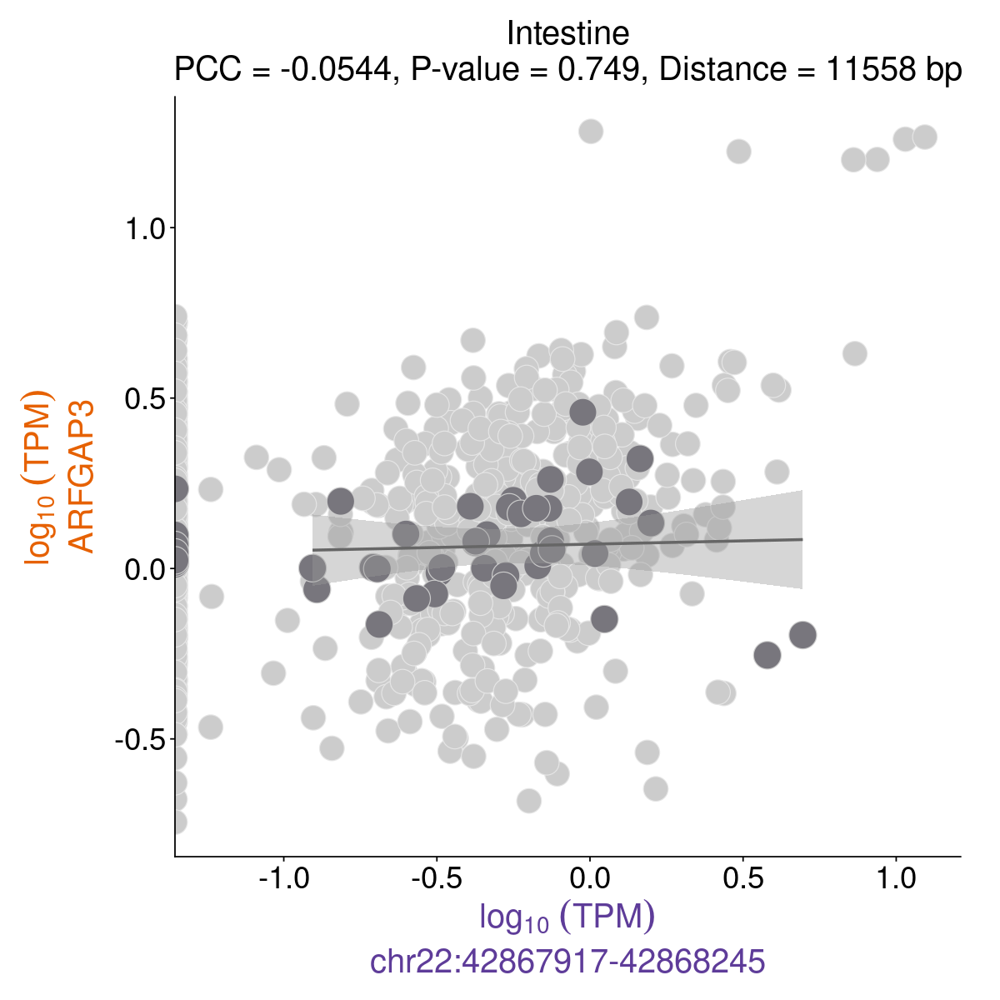

In [54]:
options(repr.plot.width=10, repr.plot.height=10) 
#Intergenic bidirectional close to the promoter of PACSIN2
ARFGAP3_intestine <- plot_transcript_pairs_txptID_colB_non(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "ARFGAP3:NM_014570.5",
                                                 bidir_id = "chr22:42867917-42868245",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "intestine") 

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  ARFGAP3:NM_014570.5"
[1] "Bidirectional ID                      :  chr22:42867917-42868245"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.363506473594808"
[1] "Adj p-val                            : 0.000168454346140781"
[1] "Distance between gene & bidirectional: 11558"
[1] "-------------------------------------------------------------"
[1] 751
           ARFGAP3:NM_014570.5 chr22:42867917-42868245
SRR7266931            1.605896               0.2391680
SRR7266932            1.846424               0.5214598
SRR7266933            1.971683               1.4283866
SRR7266934            2.036904               0.9221197
SRR7266935            1.872017               1.1460808
SRR7266936            1.818473               0.7638453
[1] "-------------------------------------------------------------"
           

Warning message:
“Removed 87 rows containing non-finite outside the scale range
(`stat_smooth()`).”


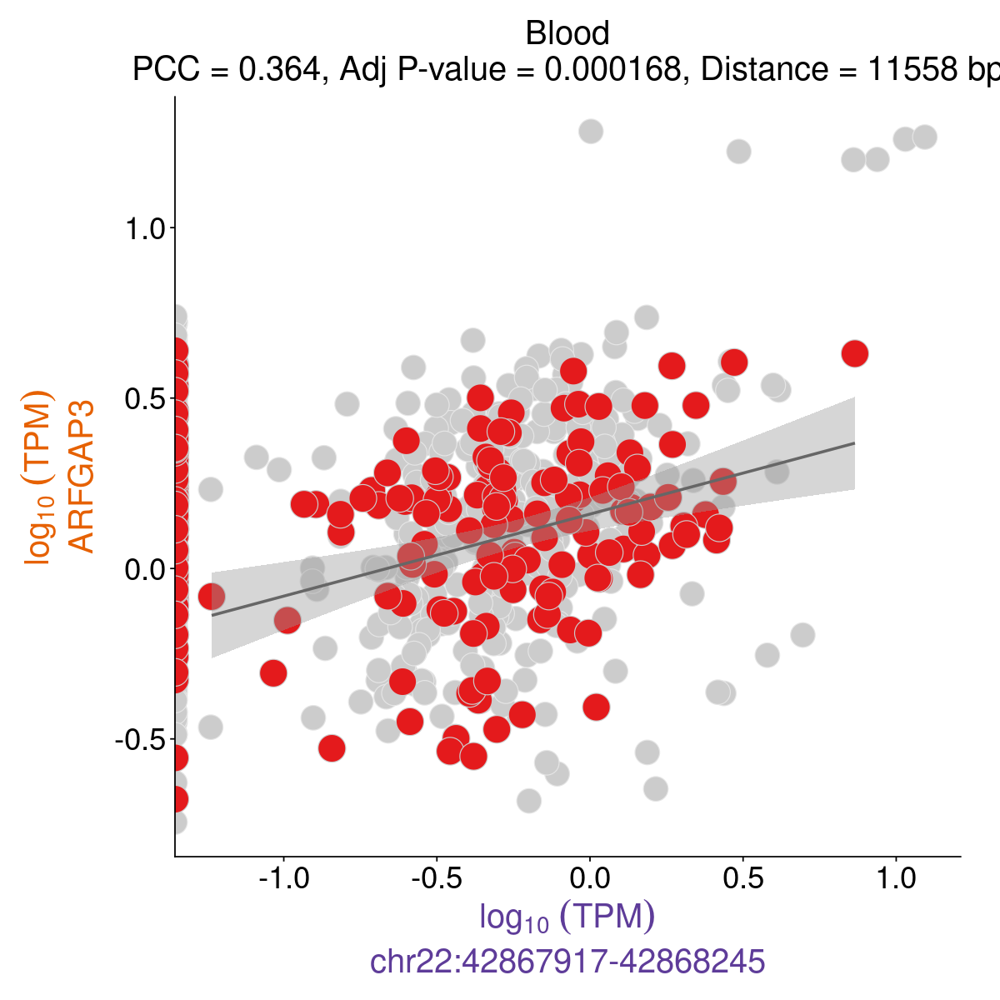

In [55]:
options(repr.plot.width=10, repr.plot.height=10) 

ARFGAP3_blood <- plot_transcript_pairs_txptID_colB(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "ARFGAP3:NM_014570.5",
                                                 bidir_id = "chr22:42867917-42868245",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "blood") 

In [56]:
ggsave(ARFGAP3_intestine, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/ARFGAP3_intestine_NONsig_scatterplot_reviews.pdf',
      bg = "transparent")

ggsave(ARFGAP3_intestine, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/ARFGAP3_intestine_NONsig_scatterplot_reviews.png',
      bg = "transparent")

ggsave(ARFGAP3_intestine, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/ARFGAP3_intestine_NONsig_scatterplot_reviews.svg',
      bg = "transparent")

Warning message:
“Removed 10 rows containing non-finite outside the scale range
(`stat_smooth()`).”
Warning message:
“Removed 10 rows containing non-finite outside the scale range
(`stat_smooth()`).”
Warning message:
“Removed 10 rows containing non-finite outside the scale range
(`stat_smooth()`).”


### Universally correlated with loop and GTEx eQTL

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  ABCB8:NM_007188.5"
[1] "Bidirectional ID                      :  chr7:151039089-151039715"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.957772370951285"
[1] "Adj p-val                            : 8.07043133705358e-22"
[1] "Distance between gene & bidirectional: 10203"
[1] "-------------------------------------------------------------"
[1] 751
           ABCB8:NM_007188.5 chr7:151039089-151039715
SRR7266931          2.959627                 9.412233
SRR7266932          2.446377                 7.661383
SRR7266933          3.068192                 9.493721
SRR7266934          2.632351                 8.951326
SRR7266935          2.978503                 8.419216
SRR7266936          2.817221                 6.412889
[1] "-------------------------------------------------------------"
            srz tra

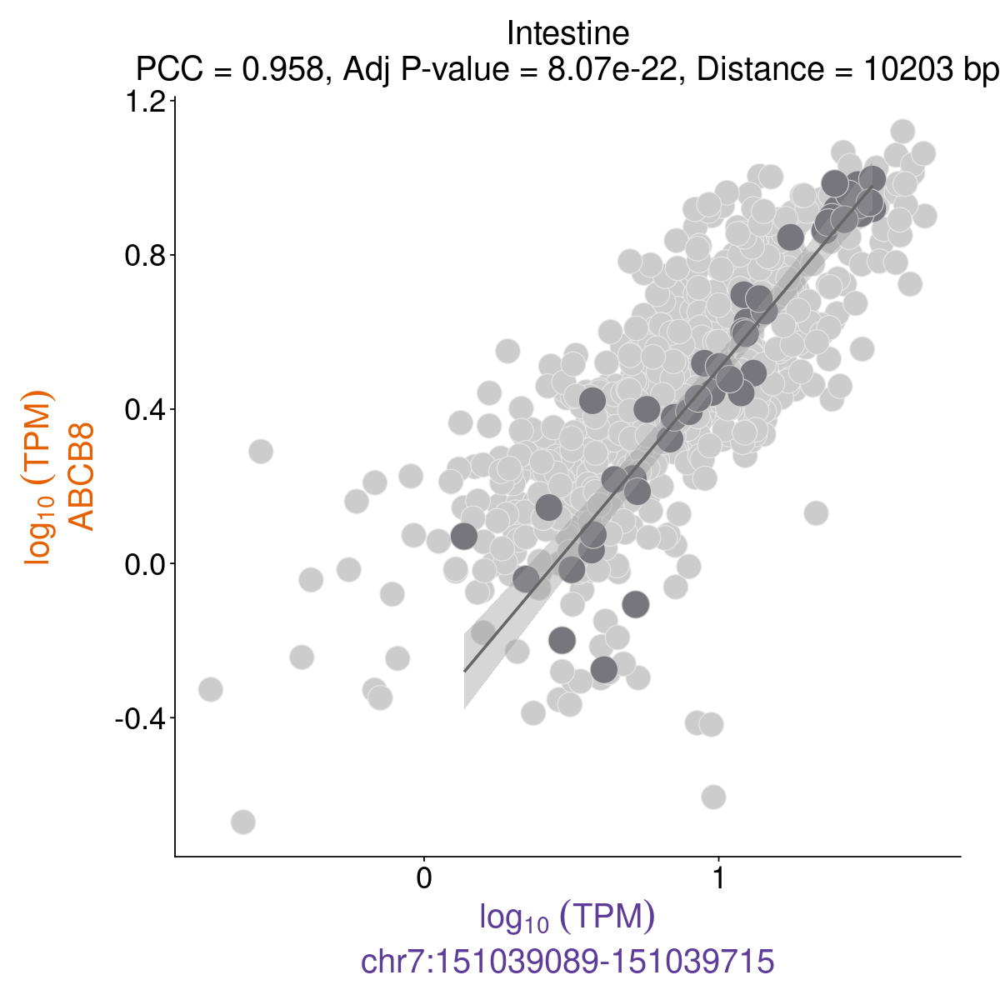

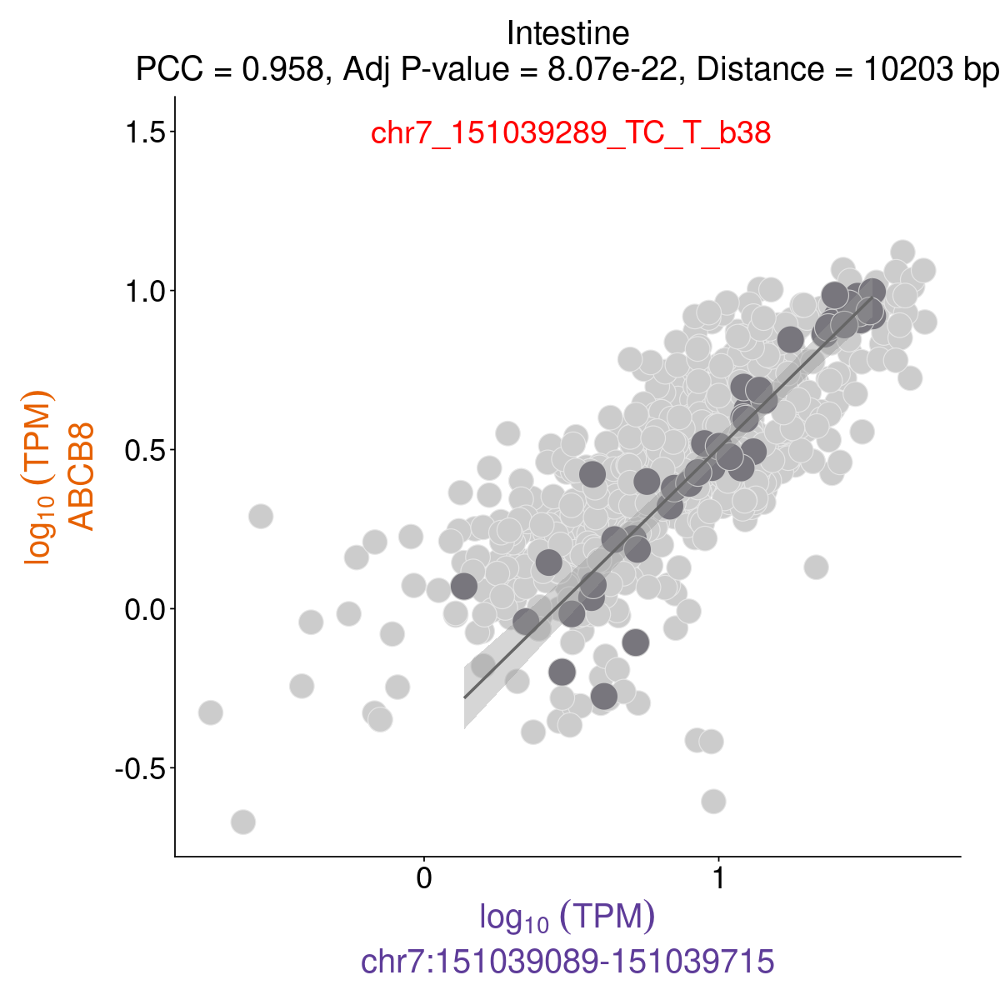

In [57]:
###########################################################
#Intronic bidirectional linked to overlapping gene
###########################################################
#ABCB8:NM_007188.5~chr7:151039089-151039715
#This nuclear gene encodes a multi-pass membrane protein that is targeted to the mitochondrial inner membrane. 
#The encoded protein is an ATP-dependent transporter that may mediate the passage 
#of organic and inorganic molecules out of the mitochondria. 

options(repr.plot.width=10, repr.plot.height=10) 

ABCB8_intestine <- plot_transcript_pairs_txptID_colB(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "ABCB8:NM_007188.5",
                                                 bidir_id = "chr7:151039089-151039715",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "intestine") +
annotate("text", x = 0.5, y = 1.5, size=8, label = "chr7_151039289_TC_T_b38", color='red')

ABCB8_intestine


[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  ABCB8:NM_007188.5"
[1] "Bidirectional ID                      :  chr7:151039089-151039715"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.879983080857572"
[1] "Adj p-val                            : 2.91358685643491e-16"
[1] "Distance between gene & bidirectional: 10203"
[1] "-------------------------------------------------------------"
[1] 751
           ABCB8:NM_007188.5 chr7:151039089-151039715
SRR7266931          2.959627                 9.412233
SRR7266932          2.446377                 7.661383
SRR7266933          3.068192                 9.493721
SRR7266934          2.632351                 8.951326
SRR7266935          2.978503                 8.419216
SRR7266936          2.817221                 6.412889
[1] "-------------------------------------------------------------"
            srz tra

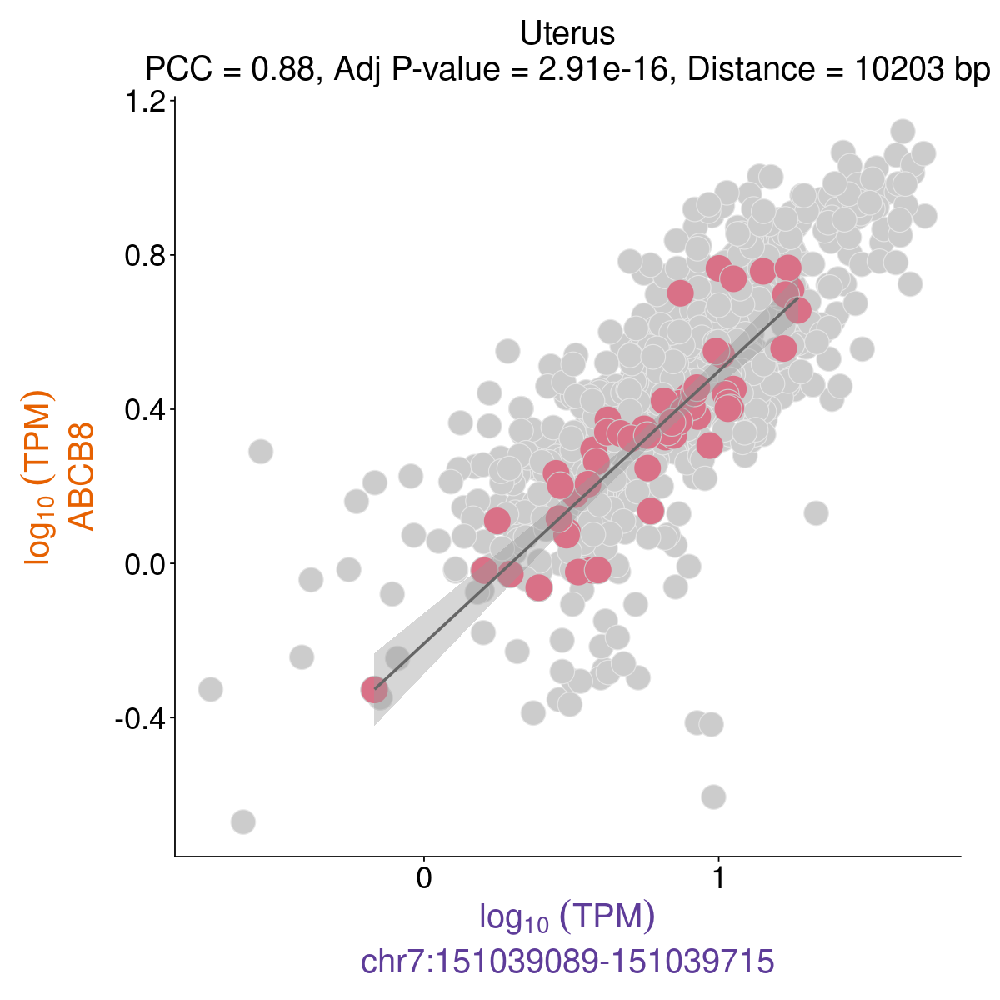

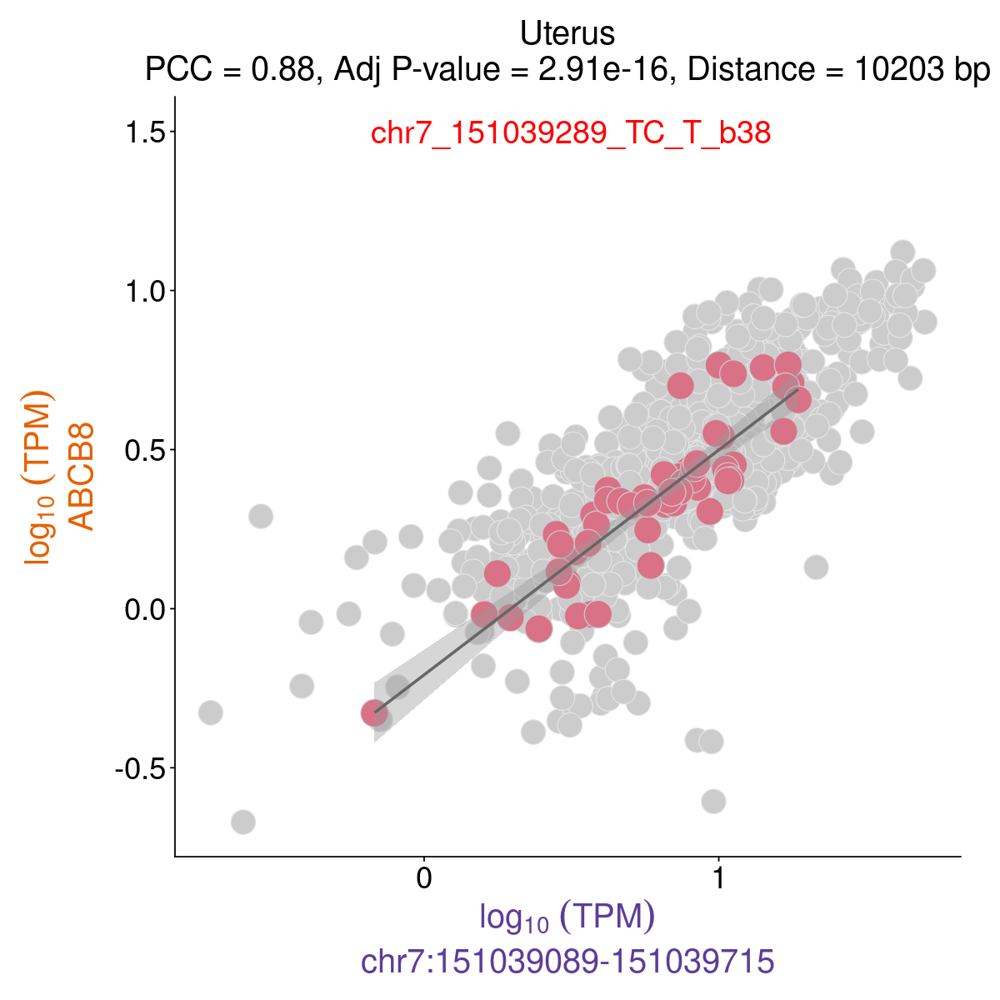

In [58]:
###########################################################
#Intronic bidirectional linked to overlapping gene
###########################################################
#ABCB8:NM_007188.5~chr7:151039089-151039715
#This nuclear gene encodes a multi-pass membrane protein that is targeted to the mitochondrial inner membrane. 
#The encoded protein is an ATP-dependent transporter that may mediate the passage 
#of organic and inorganic molecules out of the mitochondria. 

options(repr.plot.width=10, repr.plot.height=10) 

ABCB8_uterus <- plot_transcript_pairs_txptID_colB(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "ABCB8:NM_007188.5",
                                                 bidir_id = "chr7:151039089-151039715",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "uterus") +
annotate("text", x = 0.5, y = 1.5, size=8, label = "chr7_151039289_TC_T_b38", color='red')

ABCB8_uterus

In [59]:
ggsave(ABCB8_uterus, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/ABCB8_uterus_scatterplot_reviews.pdf',
      bg = "transparent")

ggsave(ABCB8_uterus, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/ABCB8_uterus_scatterplot_reviews.png',
      bg = "transparent")

ggsave(ABCB8_uterus, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/ABCB8_uterus_scatterplot_reviews.svg',
      bg = "transparent")

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  LINC00963:NR_038955.1"
[1] "Bidirectional ID                      :  chr9:129481777-129482317"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.915656896365793"
[1] "Adj p-val                            : 3.77277990775991e-09"
[1] "Distance between gene & bidirectional: 7362"
[1] "-------------------------------------------------------------"
[1] 751
           LINC00963:NR_038955.1 chr9:129481777-129482317
SRR7266931              4.881025                0.1454460
SRR7266932              4.473089                0.3171169
SRR7266933              4.926251                0.0000000
SRR7266934              5.079616                0.1401929
SRR7266935              5.348862                0.1393939
SRR7266936              5.130718                0.0000000
[1] "---------------------------------------------------

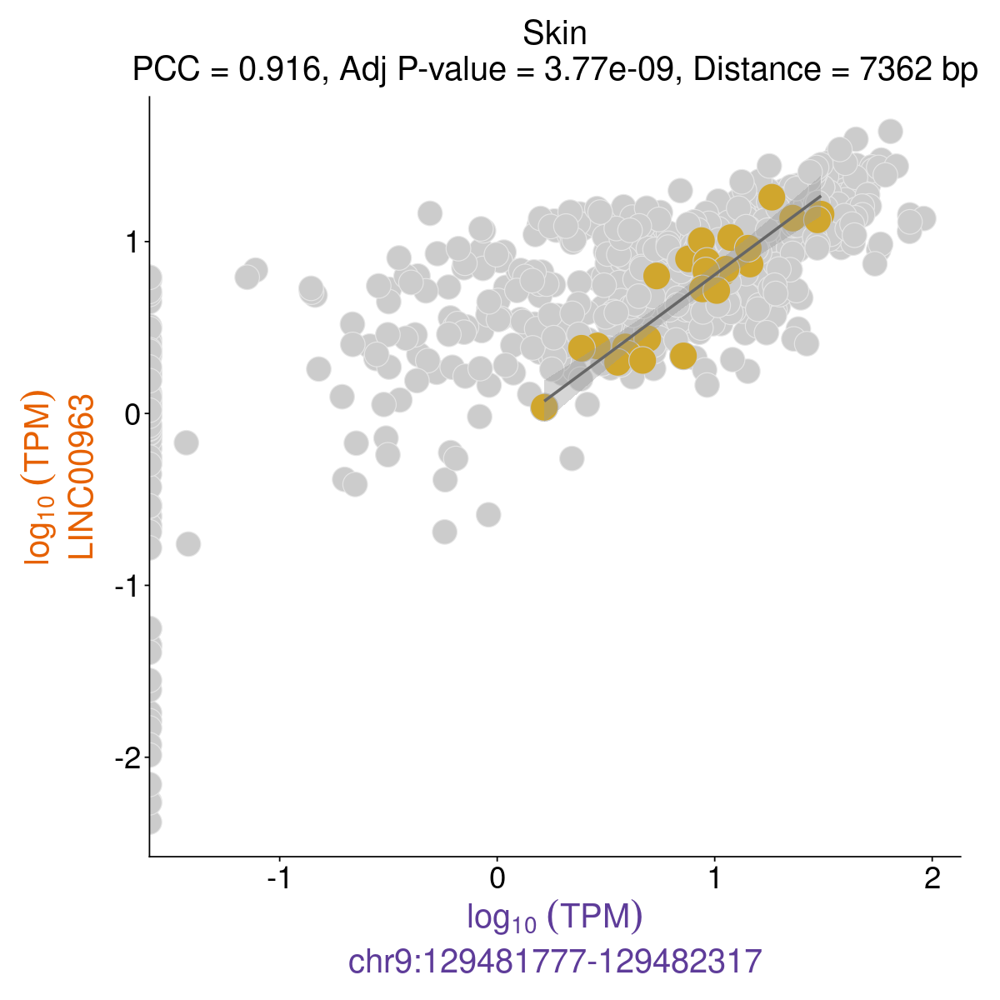

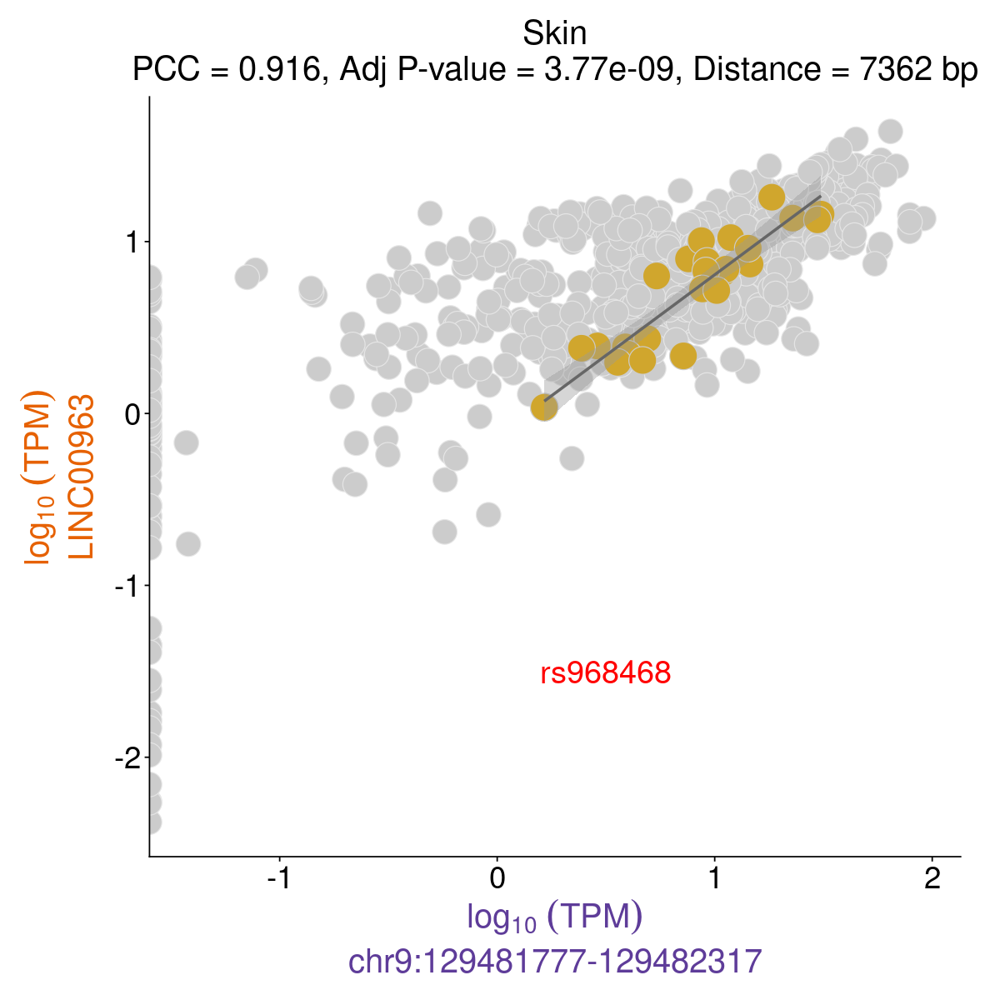

In [60]:
#LINC00963:NR_038955.1~chr9:129481777-129482317 
#Goes to supplement since we have few tissues for pair

options(repr.plot.width=10, repr.plot.height=10) 

LINC00963_skin <- plot_transcript_pairs_txptID_colB(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "LINC00963:NR_038955.1",
                                                 bidir_id = "chr9:129481777-129482317",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "skin") +
annotate("text", x = 0.5, y = -1.5, size=8, label = "rs968468", color='red')

LINC00963_skin

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  LINC00963:NR_038955.1"
[1] "Bidirectional ID                      :  chr9:129481777-129482317"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.555472685527067"
[1] "Adj p-val                            : 2.94324679424851e-12"
[1] "Distance between gene & bidirectional: 7362"
[1] "-------------------------------------------------------------"
[1] 751
           LINC00963:NR_038955.1 chr9:129481777-129482317
SRR7266931              4.881025                0.1454460
SRR7266932              4.473089                0.3171169
SRR7266933              4.926251                0.0000000
SRR7266934              5.079616                0.1401929
SRR7266935              5.348862                0.1393939
SRR7266936              5.130718                0.0000000
[1] "---------------------------------------------------

Warning message:
“Removed 67 rows containing non-finite outside the scale range
(`stat_smooth()`).”
Warning message:
“Removed 67 rows containing non-finite outside the scale range
(`stat_smooth()`).”


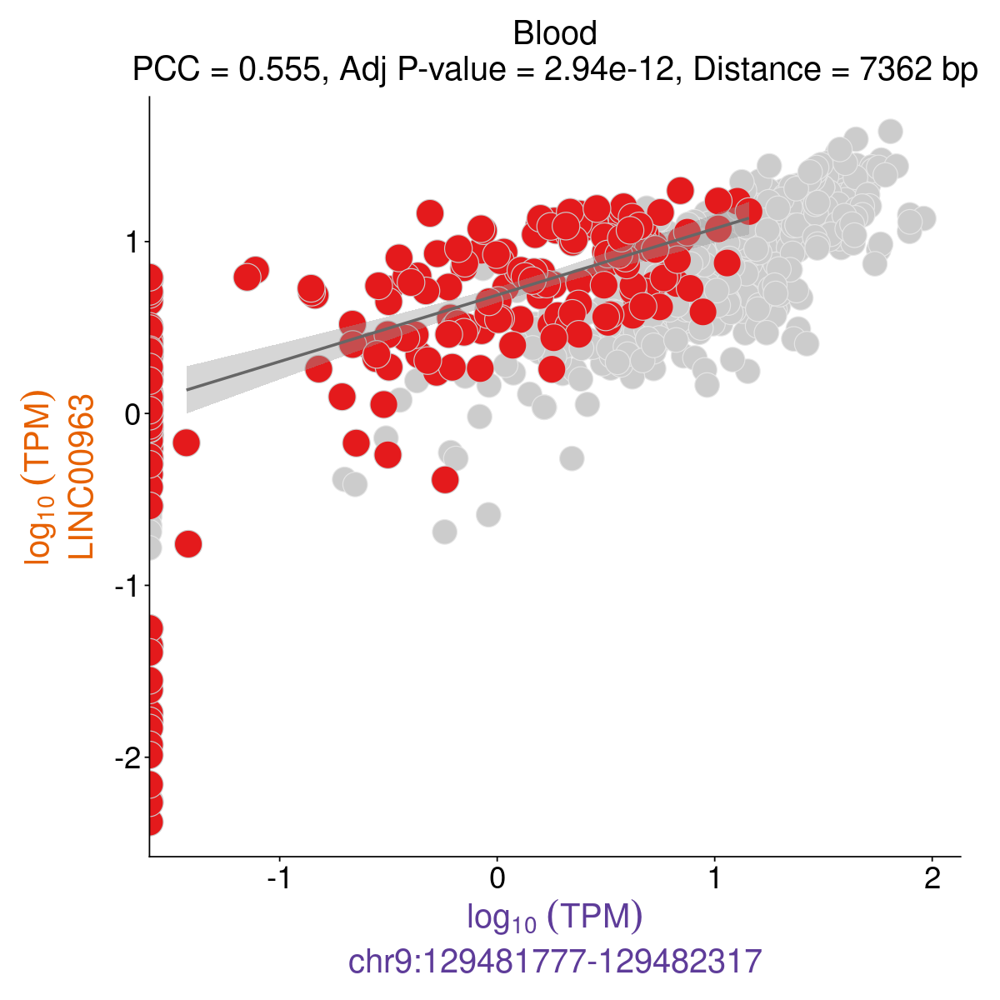

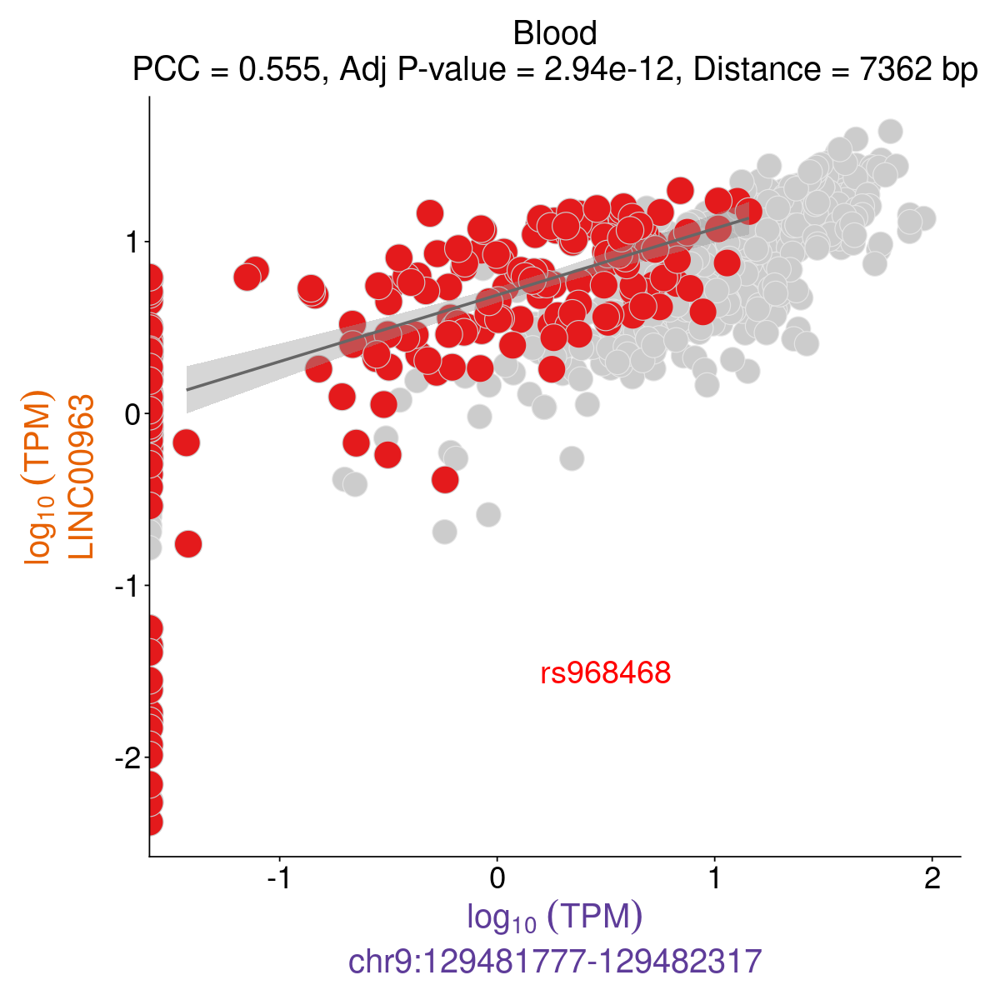

In [61]:
#LINC00963:NR_038955.1~chr9:129481777-129482317 
#Goes to main since we have rsID?

options(repr.plot.width=10, repr.plot.height=10) 

LINC00963_blood <- plot_transcript_pairs_txptID_colB(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "LINC00963:NR_038955.1",
                                                 bidir_id = "chr9:129481777-129482317",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "blood") +
annotate("text", x = 0.5, y = -1.5, size=8, label = "rs968468", color='red')

LINC00963_blood

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  LINC00963:NR_038955.1"
[1] "Bidirectional ID                      :  chr9:129481777-129482317"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.804562752195196"
[1] "Adj p-val                            : 4.2510449660755e-34"
[1] "Distance between gene & bidirectional: 7362"
[1] "-------------------------------------------------------------"
[1] 751
           LINC00963:NR_038955.1 chr9:129481777-129482317
SRR7266931              4.881025                0.1454460
SRR7266932              4.473089                0.3171169
SRR7266933              4.926251                0.0000000
SRR7266934              5.079616                0.1401929
SRR7266935              5.348862                0.1393939
SRR7266936              5.130718                0.0000000
[1] "----------------------------------------------------

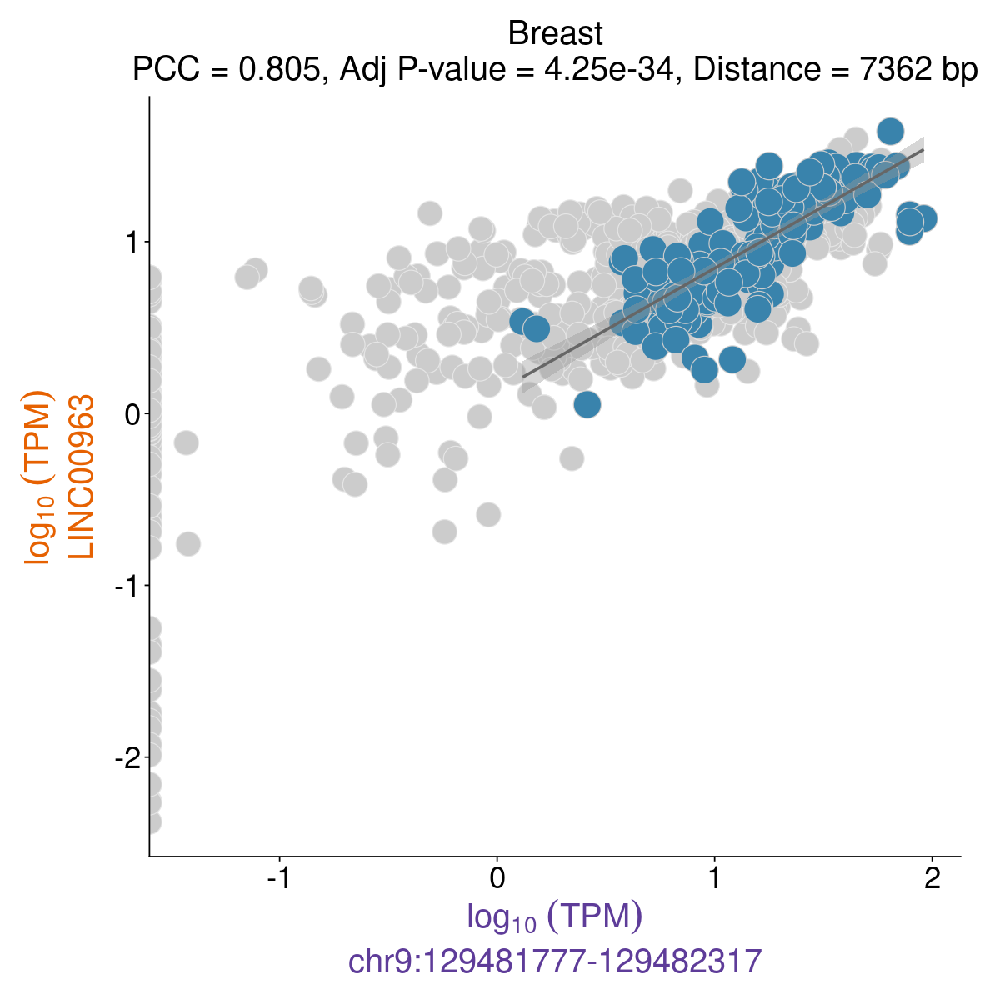

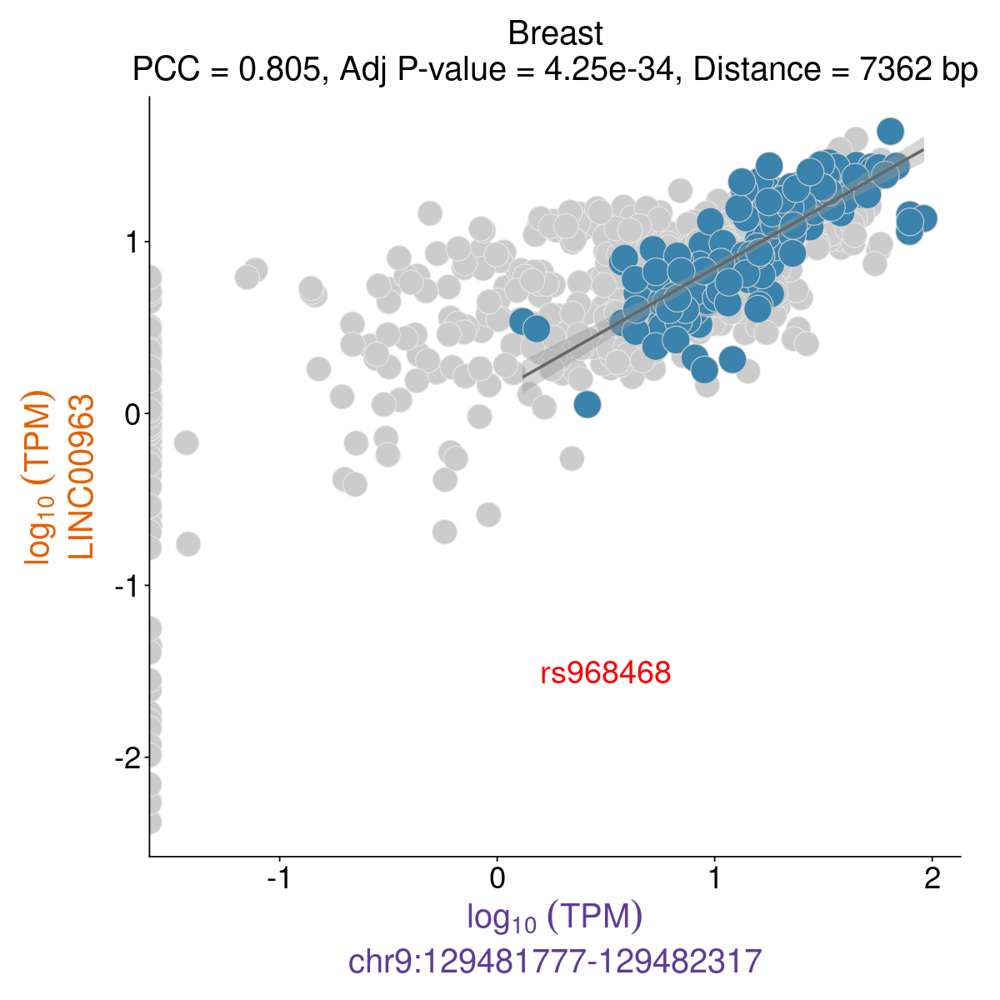

In [62]:
#LINC00963:NR_038955.1~chr9:129481777-129482317 
#Goes to main since we have rsID

options(repr.plot.width=10, repr.plot.height=10) 

LINC00963_breast <- plot_transcript_pairs_txptID_colB(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "LINC00963:NR_038955.1",
                                                 bidir_id = "chr9:129481777-129482317",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "breast") +
annotate("text", x = 0.5, y = -1.5, size=8, label = "rs968468", color='red')

LINC00963_breast

In [63]:
set.seed(42)

# Define the number of colors you want
nb.cols3 <- 70
mycolors3 <- sample(colorRampPalette(brewer.pal(8, "Set3"))(nb.cols3))
mycolors3

[1] "#ECB370" "#D6D5A6" "#D8A0AC" "#CFCCCF" "#FCCDE5" "#D3B387" "#D2A6B7"
 [8] "#D2EDBA" "#B79AA7" "#EDD0CB" "#AA9FB1" "#C6B293" "#C2BFD7" "#DE9AA2"
[15] "#F9B365" "#F4CED8" "#A4DBC2" "#87B1CC" "#B9DC73" "#E49597" "#C0DA80"
[22] "#B4DD68" "#F58276" "#B9B29E" "#BBE4BE" "#C3D467" "#D09193" "#EB8F8D"
[29] "#85AECE" "#E1C364" "#DC8C89" "#CFD799" "#F78378" "#E3E2C3" "#C5B2CC"
[36] "#DDF2B8" "#AFE0C0" "#D2CC66" "#E5D2BF" "#F0F0BB" "#A0B1B5" "#BBD968"
[43] "#ADB2AA" "#98D7C4" "#91A9C4" "#E98780" "#E8BF63" "#CCACC1" "#D6D3CB"
[50] "#BFB8D6" "#F0BB63" "#C6E9BC" "#C9C5D3" "#F7B762" "#9EA4BB" "#CAD066"
[57] "#D9C865" "#F18982" "#93B1C0" "#C8D98C" "#EAE9BF" "#C3969D" "#E0B37C"
[64] "#8DD3C7" "#FEFEB3" "#DDDBC7" "#F5FBB4" "#F7F7B7" "#E9F6B6" "#DED3B2"

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  LINC00963:NR_038955.1"
[1] "Bidirectional ID                      :  chr9:129481777-129482317"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.555472685527067"
[1] "Adj p-val                            : 2.94324679424851e-12"
[1] "Distance between gene & bidirectional: 7362"
[1] "-------------------------------------------------------------"
[1] 751
           LINC00963:NR_038955.1 chr9:129481777-129482317
SRR7266931              4.881025                0.1454460
SRR7266932              4.473089                0.3171169
SRR7266933              4.926251                0.0000000
[1] "-------------------------------------------------------------"
           srz transcript_1 transcript_2   organism tissue tissue_description
17 SRR10063544     17.16807     12.73165 H. sapiens  blood      blood; marrow
18 SRR

Warning message:
“Removed 67 rows containing non-finite outside the scale range
(`stat_smooth()`).”


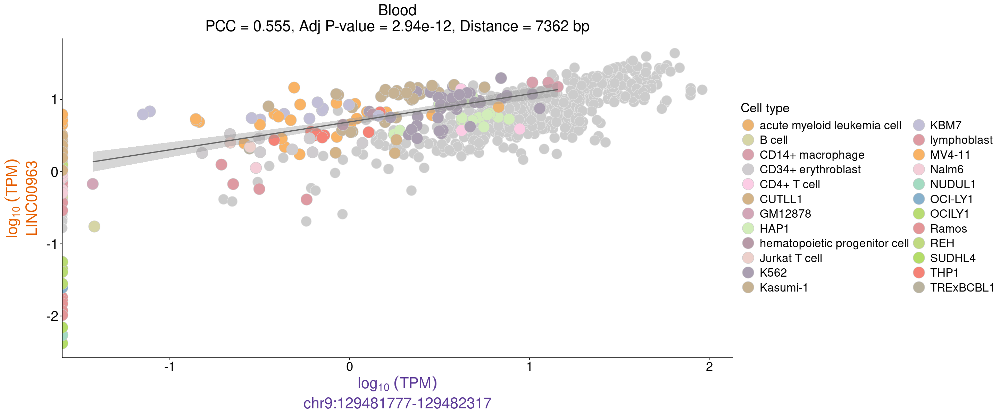

In [64]:
#LINC00963:NR_038955.1~chr9:129481777-129482317 
#Goes to main since we have rsID?

options(repr.plot.width=24, repr.plot.height=10) 

LINC00963_blood_cells <- plot_transcript_pairs_txptID_col_cell(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "LINC00963:NR_038955.1",
                                                 bidir_id = "chr9:129481777-129482317",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors3,
                                                 tissue_id = "blood") +
annotate("text", x = 0.5, y = -1.5, size=8, label = "rs968468", color='red')


### Tissue specific

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  ZSCAN31:NM_030899.5"
[1] "Bidirectional ID                      :  chr6:28411040-28413404"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.905172405700399"
[1] "Adj p-val                            : 3.65656371657499e-13"
[1] "Distance between gene & bidirectional: 76824"
[1] "-------------------------------------------------------------"
[1] 751
           ZSCAN31:NM_030899.5 chr6:28411040-28413404
SRR7266931           0.9666980              0.3992538
SRR7266932           1.2549658              0.5077893
SRR7266933           0.9181656              0.6623526
SRR7266934           0.8322037              0.4169034
SRR7266935           0.8416057              0.5101877
SRR7266936           0.9662861              0.5313004
[1] "-------------------------------------------------------------"
           srz tran

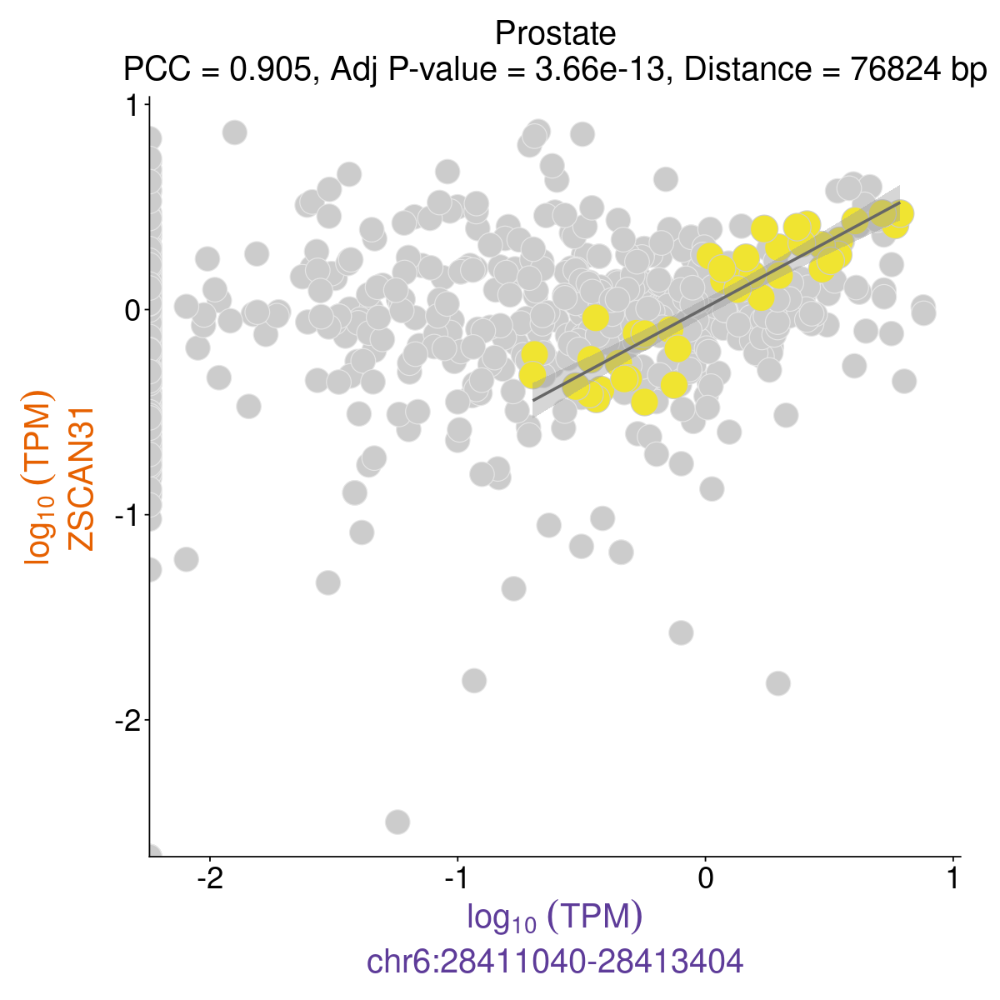

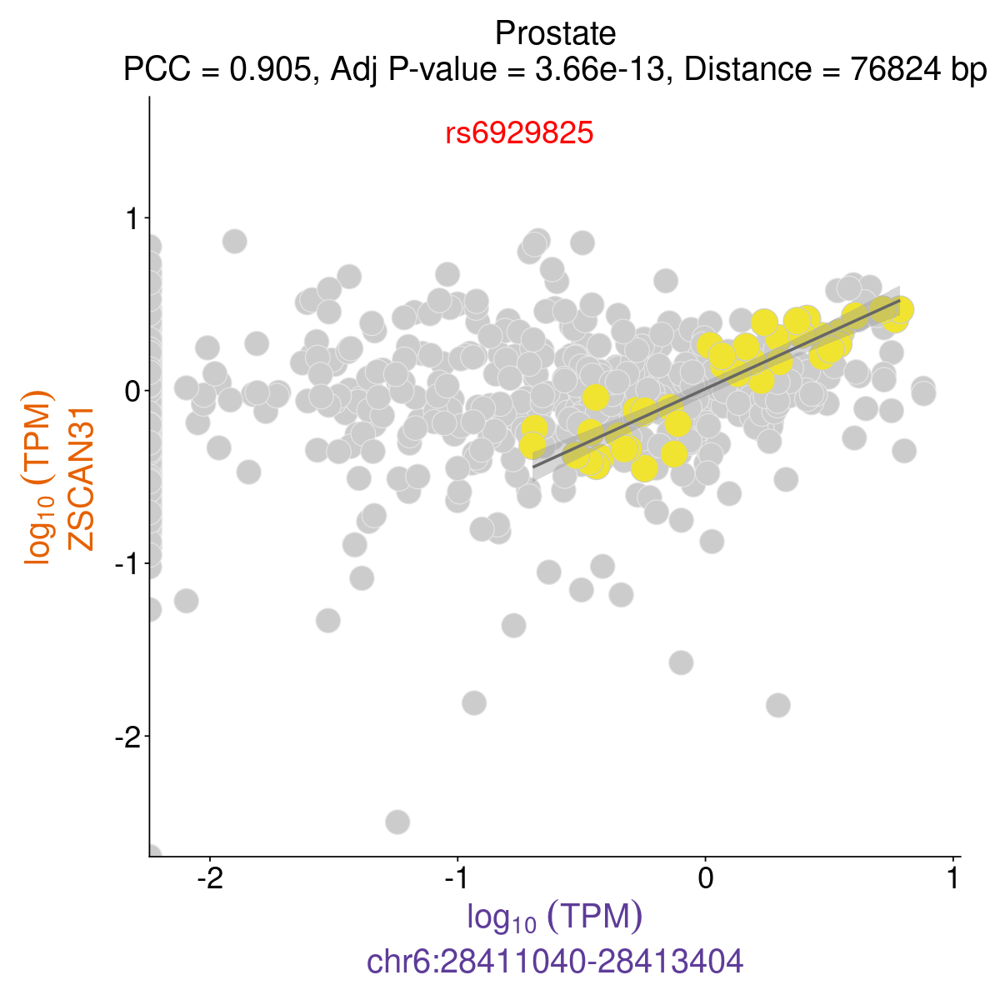

In [65]:
#ZSCAN31:NM_030899.5~chr6:28411040-28413404
#UniProtKB/Swiss-Prot Summary for ZSCAN31 Gene: May function as a transcription factor.
#May be involved in the development of multiple embryonic organs.

#The bidirectional transcript has a p53 motif

options(repr.plot.width=10, repr.plot.height=10) 

ZSCAN31_prostate <- plot_transcript_pairs_txptID_colB(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "ZSCAN31:NM_030899.5",
                                                 bidir_id = "chr6:28411040-28413404",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "prostate") +
annotate("text", x = -0.75, y = 1.5, size=8, label = "rs6929825", color='red')

ZSCAN31_prostate

In [66]:
ggsave(ZSCAN31_prostate, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/ZSCAN31_prostate_scatterplot_reviews.pdf',
      bg = "transparent")

ggsave(ZSCAN31_prostate, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/ZSCAN31_prostate_scatterplot_reviews.png',
      bg = "transparent")

ggsave(ZSCAN31_prostate, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/ZSCAN31_prostate_scatterplot_reviews.svg',
      bg = "transparent")

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  HCG18:NR_024052.2"
[1] "Bidirectional ID                      :  chr6:29647641-29648589"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.622172958910978"
[1] "Adj p-val                            : 2.68336120610498e-16"
[1] "Distance between gene & bidirectional: 678291"
[1] "-------------------------------------------------------------"
[1] 751
           HCG18:NR_024052.2 chr6:29647641-29648589
SRR7266931          3.463236             0.08291493
SRR7266932          4.397741             0.18078004
SRR7266933          3.736368             0.08253235
SRR7266934          3.734767             0.07992028
SRR7266935          3.837201             0.15892965
SRR7266936          3.768514             0.08827014
[1] "-------------------------------------------------------------"
           srz transcript_1 transc

Warning message:
“Removed 65 rows containing non-finite outside the scale range
(`stat_smooth()`).”
Warning message:
“Removed 65 rows containing non-finite outside the scale range
(`stat_smooth()`).”


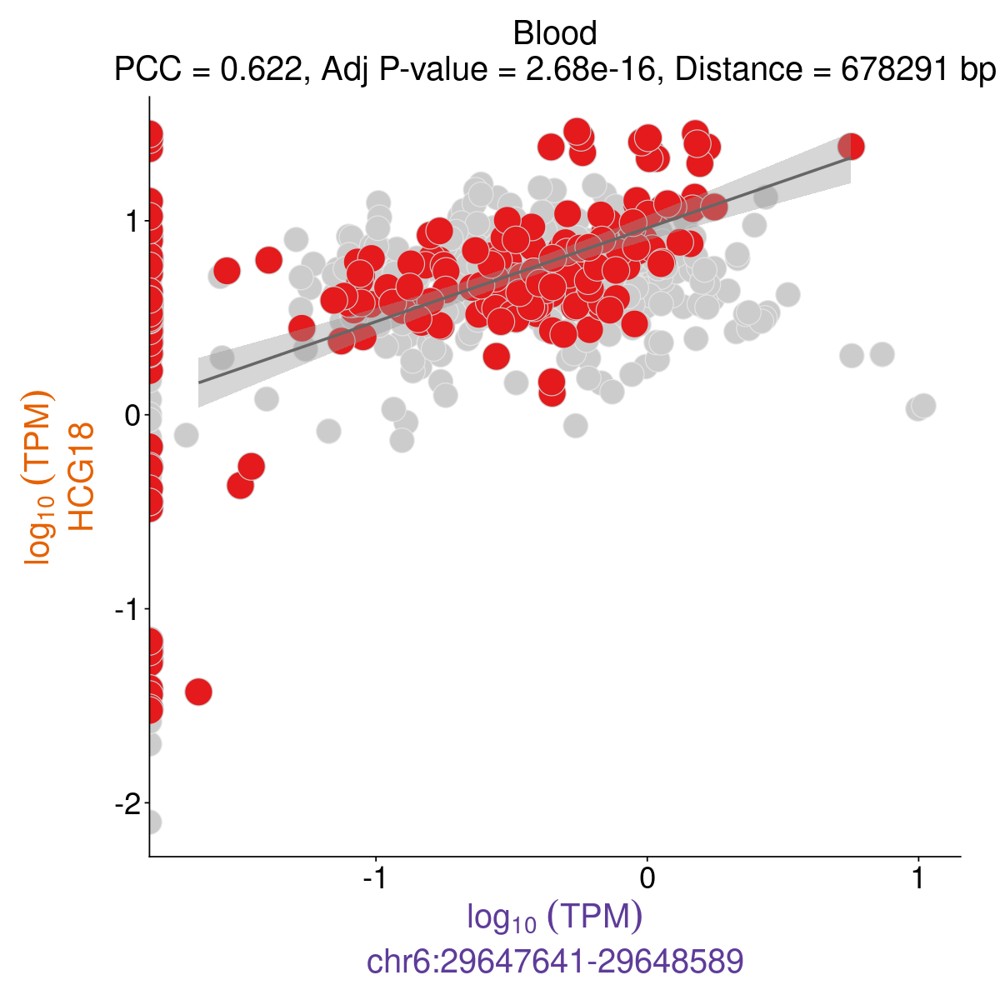

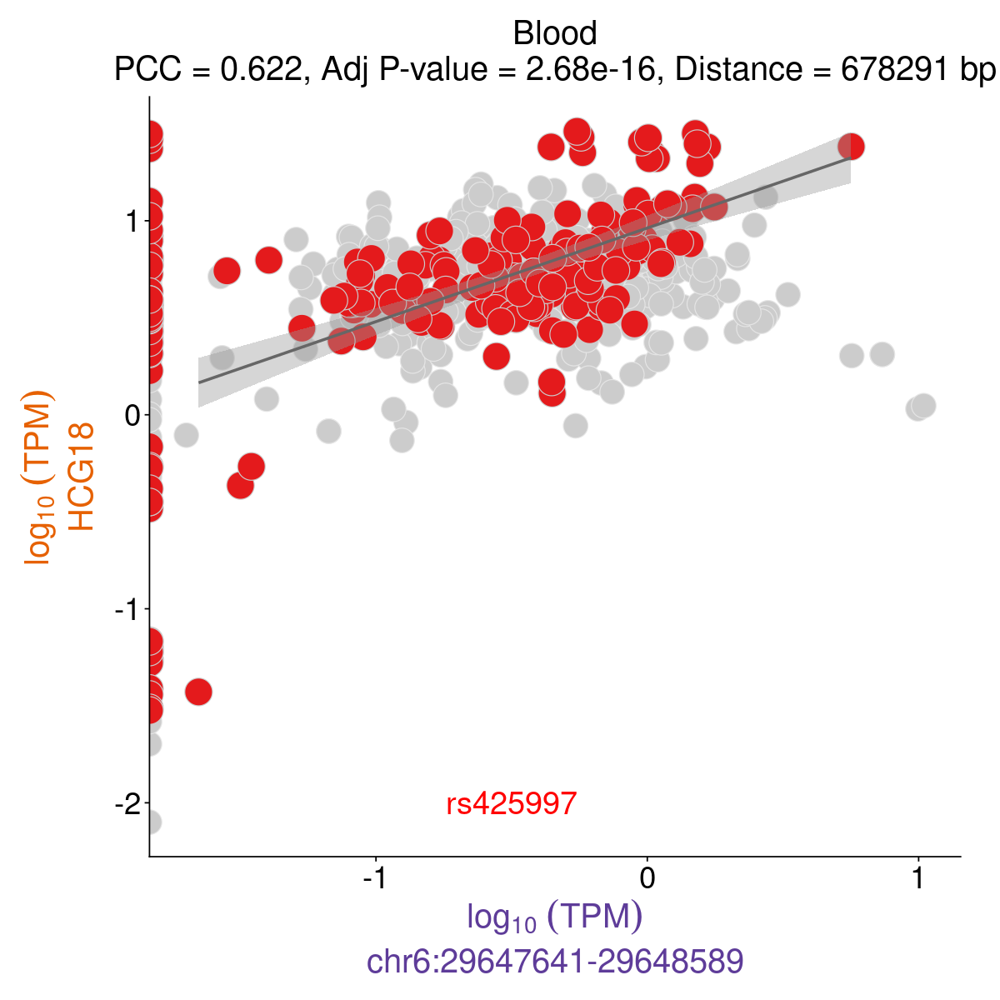

In [67]:
options(repr.plot.width=10, repr.plot.height=10) #HCG18:NR_024052.2~chr6:29647641-29648589

HCG18_blood <- plot_transcript_pairs_txptID_colB(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "HCG18:NR_024052.2",
                                                 bidir_id = "chr6:29647641-29648589",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "blood") +
annotate("text", x = -0.5, y = -2, size=8, label = "rs425997", color='red')
HCG18_blood

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  HCG18:NR_024052.2"
[1] "Bidirectional ID                      :  chr6:29647641-29648589"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : -0.704546228449174"
[1] "Adj p-val                            : 9.68671418519887e-07"
[1] "Distance between gene & bidirectional: 678291"
[1] "-------------------------------------------------------------"
[1] 751
           HCG18:NR_024052.2 chr6:29647641-29648589
SRR7266931          3.463236             0.08291493
SRR7266932          4.397741             0.18078004
SRR7266933          3.736368             0.08253235
SRR7266934          3.734767             0.07992028
SRR7266935          3.837201             0.15892965
SRR7266936          3.768514             0.08827014
[1] "-------------------------------------------------------------"
            srz transcript_1 tran

Warning message:
“Removed 7 rows containing non-finite outside the scale range (`stat_smooth()`).”


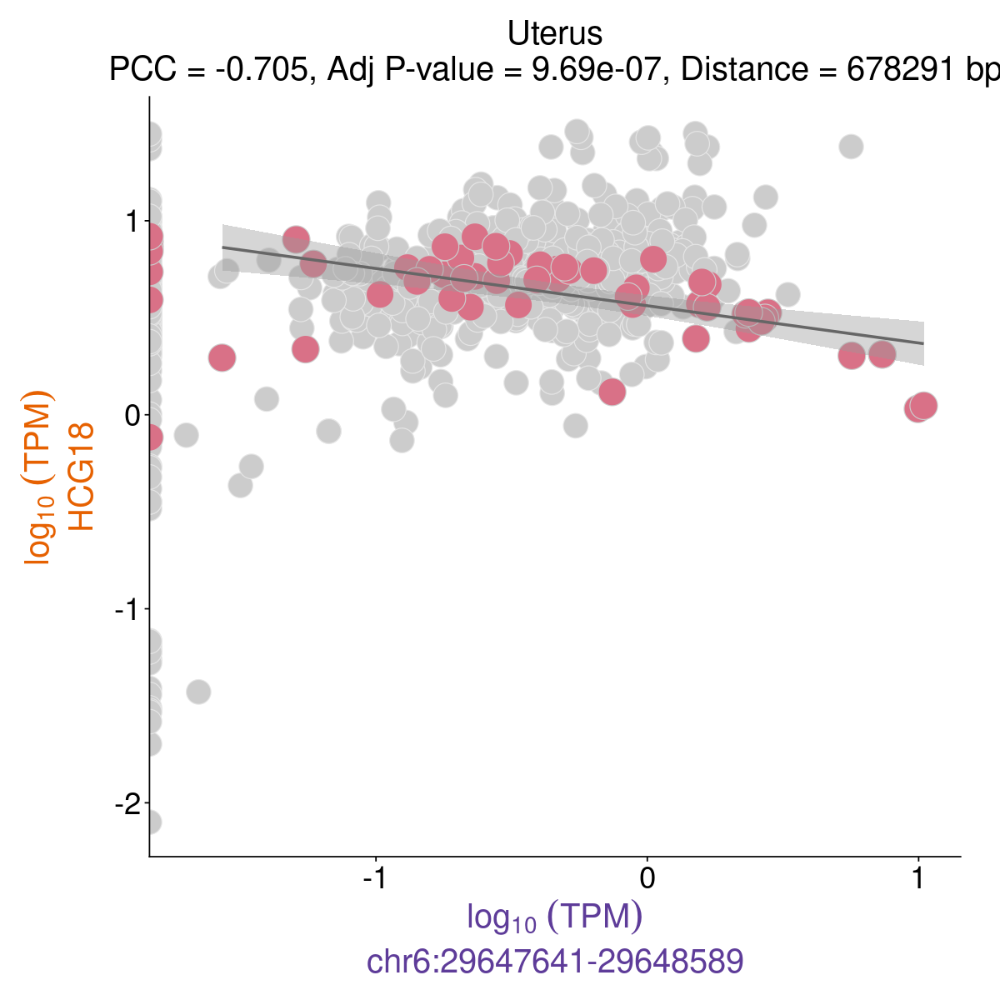

In [68]:
options(repr.plot.width=10, repr.plot.height=10) #HCG18:NR_024052.2~chr6:29647641-29648589

HCG18_uterus <- plot_transcript_pairs_txptID_colB(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "HCG18:NR_024052.2",
                                                 bidir_id = "chr6:29647641-29648589",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "uterus")

In [69]:
subset(corr_sig_strict_DT,pair_id== "HCG18:NR_024052.2~chr6:29647641-29648589")

transcript1_chrom,transcript1_start,transcript1_stop,transcript_1,transcript1_score,transcript1_strand,transcript2_chrom,transcript2_start,transcript2_stop,transcript_2,⋯,t,distance_tss,distance_tes,position,tissue,percent_transcribed_both,bidirectional_location,pair_id,gene_id,bidir_type
<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>
chr6,30287396,30326406,HCG18:NR_024052.2,.,-,chr6,29647641,29648589,chr6:29647641-29648589,⋯,9.894227,678291,639281,downstream,blood,70.72072,intergenic,HCG18:NR_024052.2~chr6:29647641-29648589,HCG18,intergenic
chr6,30287396,30326406,HCG18:NR_024052.2,.,-,chr6,29647641,29648589,chr6:29647641-29648589,⋯,6.949577,678291,639281,downstream,uterus,87.93103,intergenic,HCG18:NR_024052.2~chr6:29647641-29648589,HCG18,intergenic


[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  HCG18:NR_024052.2"
[1] "Bidirectional ID                      :  chr6:29647641-29648589"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.622172958910978"
[1] "Adj p-val                            : 2.68336120610498e-16"
[1] "Distance between gene & bidirectional: 678291"
[1] "-------------------------------------------------------------"
[1] 751
           HCG18:NR_024052.2 chr6:29647641-29648589
SRR7266931          3.463236             0.08291493
SRR7266932          4.397741             0.18078004
SRR7266933          3.736368             0.08253235
[1] "-------------------------------------------------------------"
           srz transcript_1 transcript_2   organism tissue tissue_description
17 SRR10063544     3.316484    0.3923232 H. sapiens  blood      blood; marrow
18 SRR10063545     2.715335    0.4

Warning message:
“Removed 65 rows containing non-finite outside the scale range
(`stat_smooth()`).”


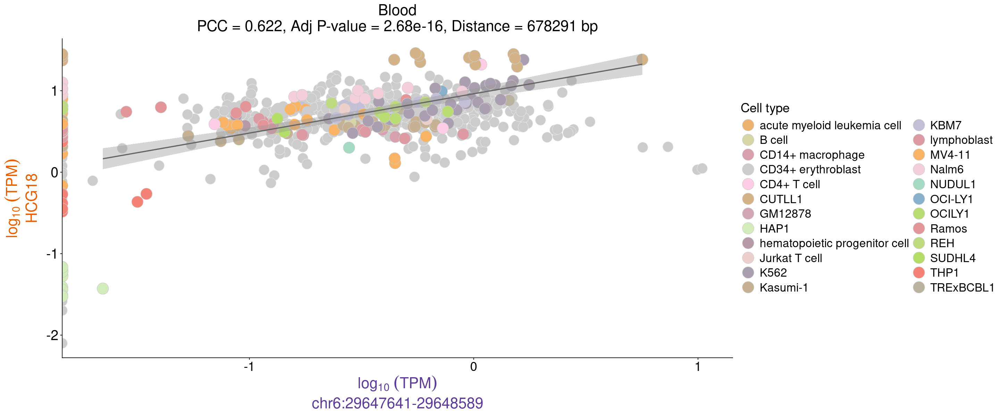

In [70]:
options(repr.plot.width=24, repr.plot.height=10) 

HCG18_blood_cells <- plot_transcript_pairs_txptID_col_cell(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "HCG18:NR_024052.2",
                                                 bidir_id = "chr6:29647641-29648589",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors3,
                                                 tissue_id = "blood") +
annotate("text", x = -0.5, y = -2, size=8, label = "rs425997", color='red')

## Supplement

### CAT:NM_001752.4~chr11:34427288-34427664	

In [71]:
# Define the cell type colors
nb.cols2 <- 100
mycolors2 <- colorRampPalette(brewer.pal(8, "Dark2"))(nb.cols2)
mycolors2

[1] "#1B9E77" "#28996E" "#359566" "#43905E" "#508C55" "#5E874D" "#6B8345"
  [8] "#797E3D" "#867A34" "#93752C" "#A17124" "#AE6D1B" "#BC6813" "#C9640B"
 [15] "#D75F03" "#D2600C" "#CB6119" "#C46225" "#BD6332" "#B6643E" "#AF664B"
 [22] "#A86757" "#A16864" "#9A6970" "#936A7D" "#8C6C89" "#856D96" "#7E6EA2"
 [29] "#776FAF" "#7A6CB0" "#8267AE" "#8A62AB" "#925DA8" "#9B58A5" "#A353A2"
 [36] "#AB4E9F" "#B3499C" "#BB4499" "#C33F96" "#CB3A93" "#D33591" "#DB308E"
 [43] "#E32B8B" "#E12E85" "#D8367D" "#CF3F76" "#C6486E" "#BD5167" "#B45A5F"
 [50] "#AB6357" "#A16B50" "#987448" "#8F7D40" "#868639" "#7D8F31" "#749829"
 [57] "#6BA022" "#69A61D" "#72A61B" "#7BA619" "#85A717" "#8EA715" "#97A713"
 [64] "#A0A811" "#A9A80F" "#B2A80D" "#BBA90B" "#C4A909" "#CDAA07" "#D6AA05"
 [71] "#DFAA03" "#E4A902" "#E0A604" "#DBA206" "#D79E08" "#D29A0A" "#CE970C"
 [78] "#C9930E" "#C58F0F" "#C08B11" "#BB8813" "#B78415" "#B28017" "#AE7C19"
 [85] "#A9791B" "#A5751D" "#A07422" "#9C7328" "#97722D" "#937132" "#8E7037"
 [92] "#8A6F3C" "#856D41" "#816C47" "#7C6B4C" "#786A51" "#736956" "#6F685B"
 [99] "#6A6760" "#666666"

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  CAT:NM_001752.4"
[1] "Bidirectional ID                      :  chr11:34427288-34427664"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.880450642427118"
[1] "Adj p-val                            : 8.48239330625292e-05"
[1] "Distance between gene & bidirectional: 12207"
[1] "-------------------------------------------------------------"
[1] 751
           CAT:NM_001752.4 chr11:34427288-34427664
SRR7266931        3.847068                4.383055
SRR7266932        4.556854                2.730402
SRR7266933        4.257484                1.662031
[1] "-------------------------------------------------------------"
            srz transcript_1 transcript_2   organism    tissue
104 SRR11024606    0.6287206   0.00000000 H. sapiens intestine
105 SRR11024607    0.3430537   0.05964085 H. sapiens intestine
106 SRR

Warning message:
“Removed 30 rows containing non-finite outside the scale range
(`stat_smooth()`).”


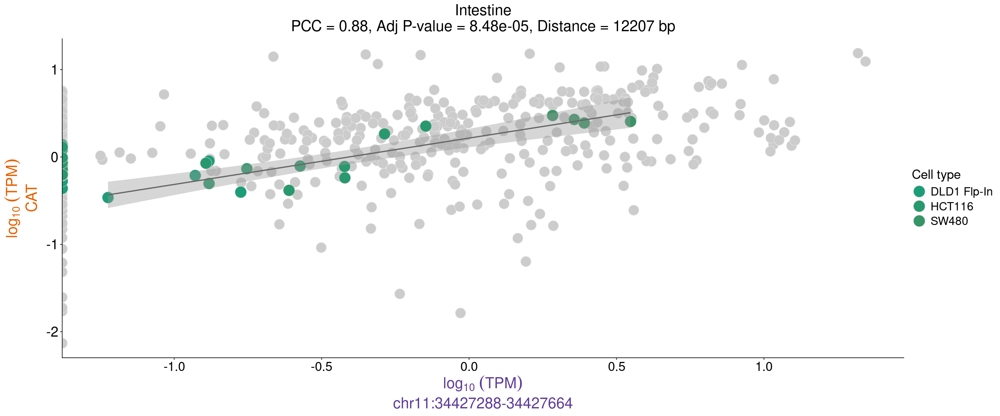

In [72]:
options(repr.plot.width=24, repr.plot.height=10) 

CAT_intestine_cells <- plot_transcript_pairs_txptID_col_cell(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "CAT:NM_001752.4",
                                                 bidir_id = "chr11:34427288-34427664",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors2,
                                                 tissue_id = "intestine") #+
#annotate("text", x = -0.5, y = -2, size=8, label = "rs425997", color='red')

### ACTN3:NM_001104.4~chr11:66415968-66416988

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  ACTN3:NM_001104.4"
[1] "Bidirectional ID                      :  chr11:66415968-66416988"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.823187799761006"
[1] "Adj p-val                            : 0.000551059821717796"
[1] "Distance between gene & bidirectional: 131174"
[1] "-------------------------------------------------------------"
[1] 751
           ACTN3:NM_001104.4 chr11:66415968-66416988
SRR7266931        0.09532864              0.00000000
SRR7266932        0.08751400              0.00000000
SRR7266933        0.09488878              0.07671224
[1] "-------------------------------------------------------------"
            srz transcript_1 transcript_2   organism    tissue
104 SRR11024606   0.03093707     0.000000 H. sapiens intestine
105 SRR11024607   0.02580647     0.000000 H. sapiens intest

Warning message:
“Removed 29 rows containing non-finite outside the scale range
(`stat_smooth()`).”


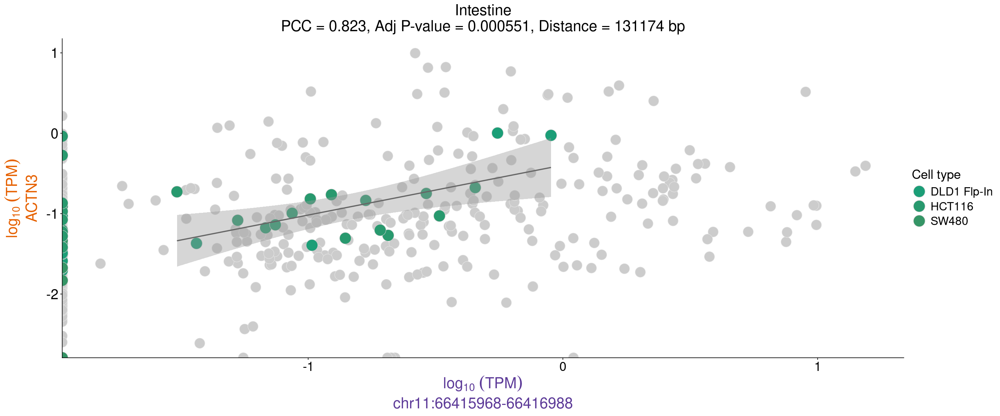

In [73]:
options(repr.plot.width=24, repr.plot.height=10) 

ACTN3_intestine_cells <- plot_transcript_pairs_txptID_col_cell(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "ACTN3:NM_001104.4",
                                                 bidir_id = "chr11:66415968-66416988",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors2,
                                                 tissue_id = "intestine")

### TMEM254-AS1:NR_027428.1~chr10:80110954-80111264

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  TMEM254-AS1:NR_027428.1"
[1] "Bidirectional ID                      :  chr10:80110954-80111264"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.531178614589242"
[1] "Adj p-val                            : 8.5809908864072e-06"
[1] "Distance between gene & bidirectional: 32666"
[1] "-------------------------------------------------------------"
[1] 751
           TMEM254-AS1:NR_027428.1 chr10:80110954-80111264
SRR7266931               0.1221381                       0
SRR7266932               0.1011935                       0
SRR7266933               0.1142801                       0
[1] "-------------------------------------------------------------"
        srz transcript_1 transcript_2   organism tissue
3 SRM497907    0.8796158    2.7776433 H. sapiens breast
4 SRM497911    0.4596974    0.0000000 H. sapi

Warning message:
“Removed 80 rows containing non-finite outside the scale range
(`stat_smooth()`).”


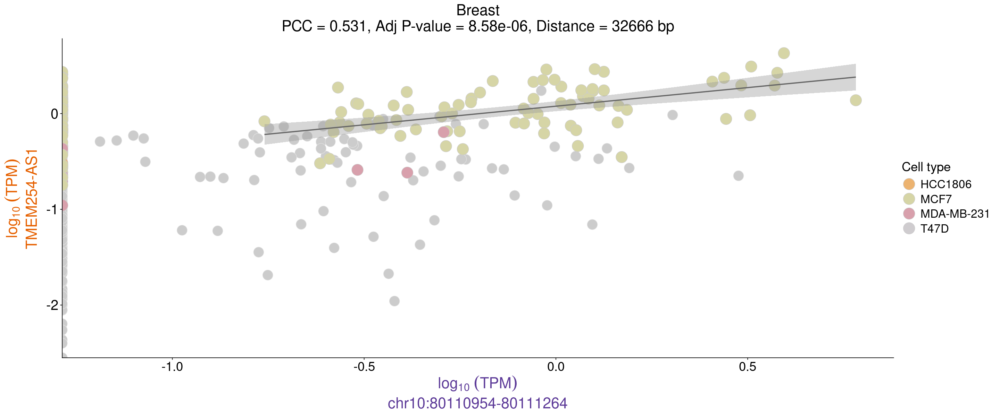

In [74]:
options(repr.plot.width=24, repr.plot.height=10) 

TMEM254_AS1_breast_cells <- plot_transcript_pairs_txptID_col_cell(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "TMEM254-AS1:NR_027428.1",
                                                 bidir_id = "chr10:80110954-80111264",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors3,
                                                 tissue_id = "breast")

### BTBD10:NM_001297742.2~chr11:13474750-13475932

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  BTBD10:NM_001297742.2"
[1] "Bidirectional ID                      :  chr11:13474750-13475932"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.678668748929581"
[1] "Adj p-val                            : 0.000598077786863774"
[1] "Distance between gene & bidirectional: 35836"
[1] "-------------------------------------------------------------"
[1] 751
           BTBD10:NM_001297742.2 chr11:13474750-13475932
SRR7266931              1.223863               0.0000000
SRR7266932              1.672329               0.0000000
SRR7266933              1.490451               0.1324145
[1] "-------------------------------------------------------------"
        srz transcript_1 transcript_2   organism tissue
3 SRM497907     1.789792            0 H. sapiens breast
4 SRM497911     1.399338            0 H. sapiens breas

Warning message:
“Removed 130 rows containing non-finite outside the scale range
(`stat_smooth()`).”


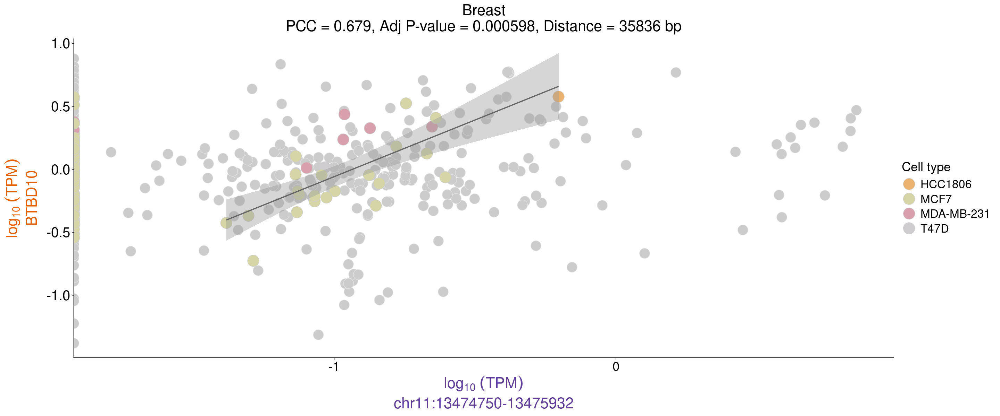

In [75]:
options(repr.plot.width=24, repr.plot.height=10) 

BTBD10_breast_cells <- plot_transcript_pairs_txptID_col_cell(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "BTBD10:NM_001297742.2",
                                                 bidir_id = "chr11:13474750-13475932",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors3,
                                                 tissue_id = "breast")

### MAPK8:NM_139046.4~chr10:48297929-48299833

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  MAPK8:NM_139046.4"
[1] "Bidirectional ID                      :  chr10:48297929-48299833"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.4979804027436"
[1] "Adj p-val                            : 2.07247598471557e-06"
[1] "Distance between gene & bidirectional: 8545"
[1] "-------------------------------------------------------------"
[1] 751
           MAPK8:NM_139046.4 chr10:48297929-48299833
SRR7266931         0.7043505              0.08261025
SRR7266932         0.9817561              0.00000000
SRR7266933         0.8429828              0.00000000
[1] "-------------------------------------------------------------"
        srz transcript_1 transcript_2   organism tissue
3 SRM497907     2.250383    0.2267315 H. sapiens breast
4 SRM497911     2.282867    1.0882352 H. sapiens breast
5 SRM497914     3.731

Warning message:
“Removed 57 rows containing non-finite outside the scale range
(`stat_smooth()`).”


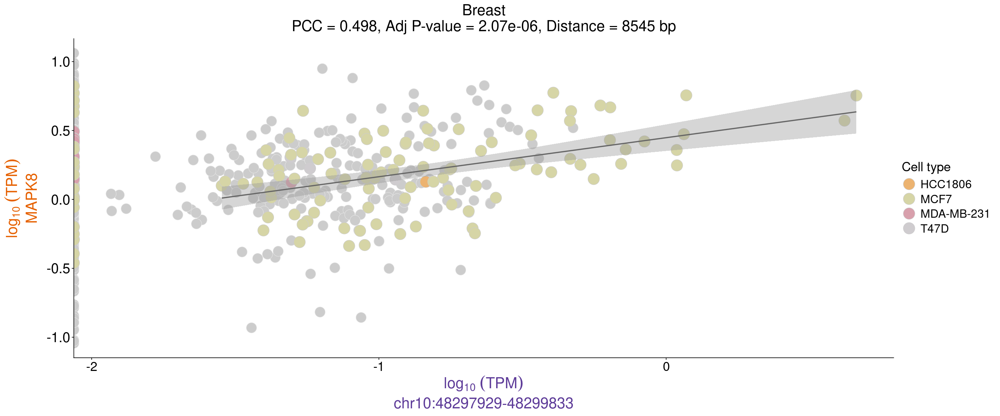

In [76]:
options(repr.plot.width=24, repr.plot.height=10) 

MAPK8_breast_cells <- plot_transcript_pairs_txptID_col_cell(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "MAPK8:NM_139046.4",
                                                 bidir_id = "chr10:48297929-48299833",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors3,
                                                 tissue_id = "breast")

### XKR9:NM_001011720.2~chr8:71031234-71032520

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  XKR9:NM_001011720.2"
[1] "Bidirectional ID                      :  chr8:71031234-71032520"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.809574766076968"
[1] "Adj p-val                            : 5.94125232487659e-22"
[1] "Distance between gene & bidirectional: 361789"
[1] "-------------------------------------------------------------"
[1] 751
           XKR9:NM_001011720.2 chr8:71031234-71032520
SRR7266931          0.02509166                      0
SRR7266932          0.01563073                      0
SRR7266933          0.02259723                      0
[1] "-------------------------------------------------------------"
        srz transcript_1 transcript_2   organism tissue
3 SRM497907   0.23086642     0.134242 H. sapiens breast
4 SRM497911   0.13191445     0.000000 H. sapiens breast
5 SRM497914 

Warning message:
“Removed 59 rows containing non-finite outside the scale range
(`stat_smooth()`).”


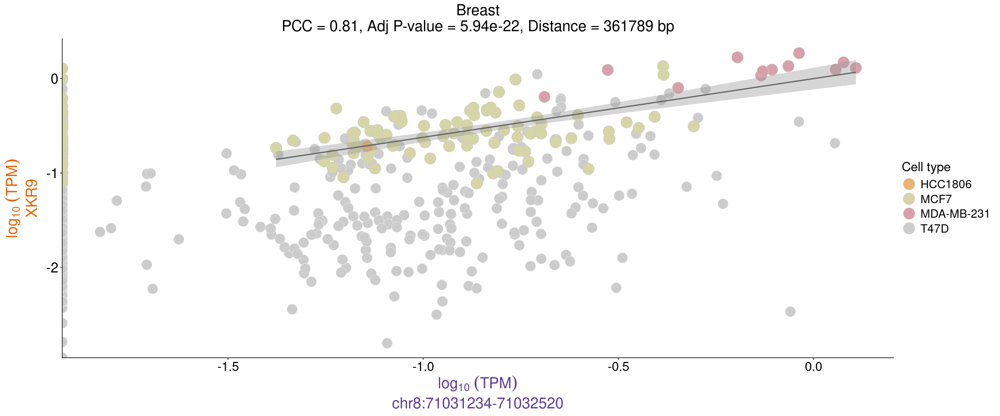

In [77]:
options(repr.plot.width=24, repr.plot.height=10) 

XKR9_breast_cells <- plot_transcript_pairs_txptID_col_cell(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "XKR9:NM_001011720.2",
                                                 bidir_id = "chr8:71031234-71032520",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors3,
                                                 tissue_id = "breast")

### MGMT:NM_002412.5~chr10:129465084-129465490

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  MGMT:NM_002412.5"
[1] "Bidirectional ID                      :  chr10:129465084-129465490"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.88436677777401"
[1] "Adj p-val                            : 5.40145241816647e-07"
[1] "Distance between gene & bidirectional: 2703"
[1] "-------------------------------------------------------------"
[1] 751
           MGMT:NM_002412.5 chr10:129465084-129465490
SRR7266931        0.3565623                         0
SRR7266932        0.3629449                         0
SRR7266933        0.3722364                         0
[1] "-------------------------------------------------------------"
            srz transcript_1 transcript_2   organism    tissue
104 SRR11024606    0.8633126    15.238188 H. sapiens intestine
105 SRR11024607    0.5542601     6.795101 H. sapiens inte

Warning message:
“Removed 23 rows containing non-finite outside the scale range
(`stat_smooth()`).”
Warning message:
“A numeric `legend.position` argument in `theme()` was deprecated in ggplot2
3.5.0.
ℹ Please use the `legend.position.inside` argument of `theme()` instead.”
Warning message:
“Removed 23 rows containing non-finite outside the scale range
(`stat_smooth()`).”


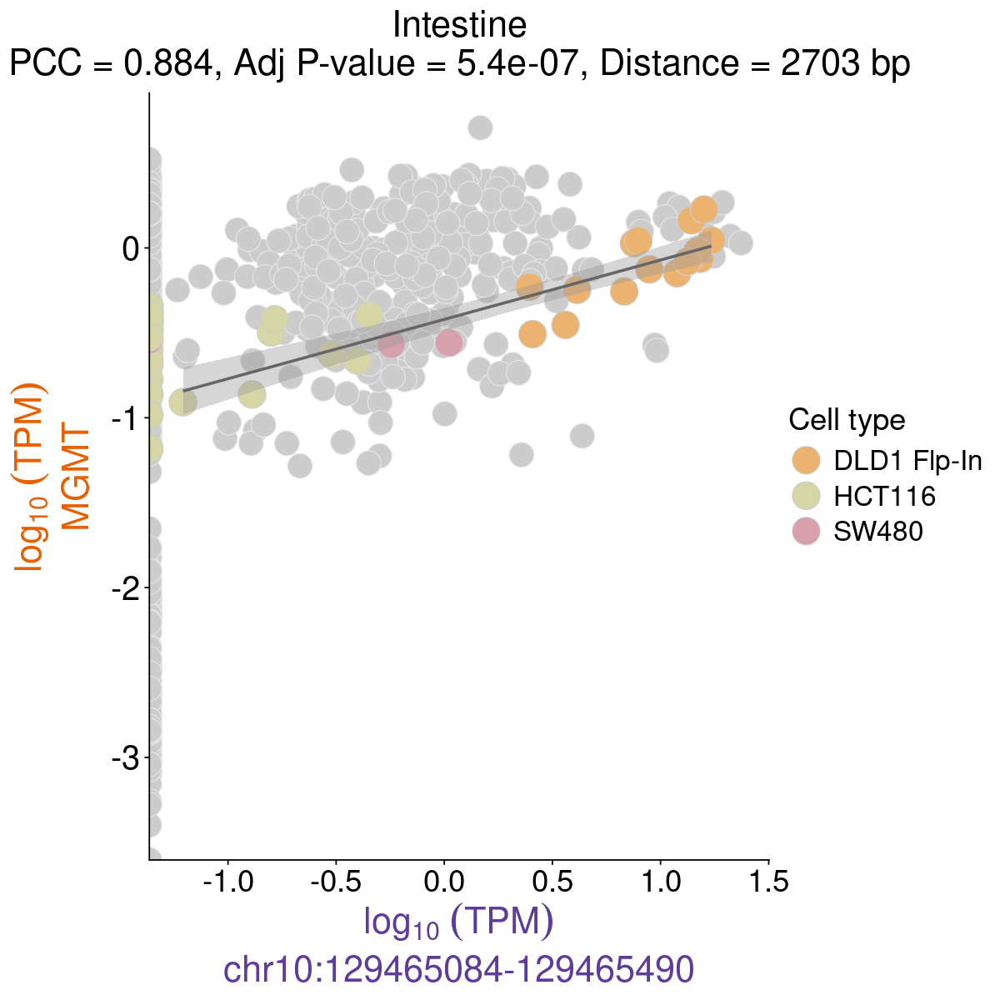

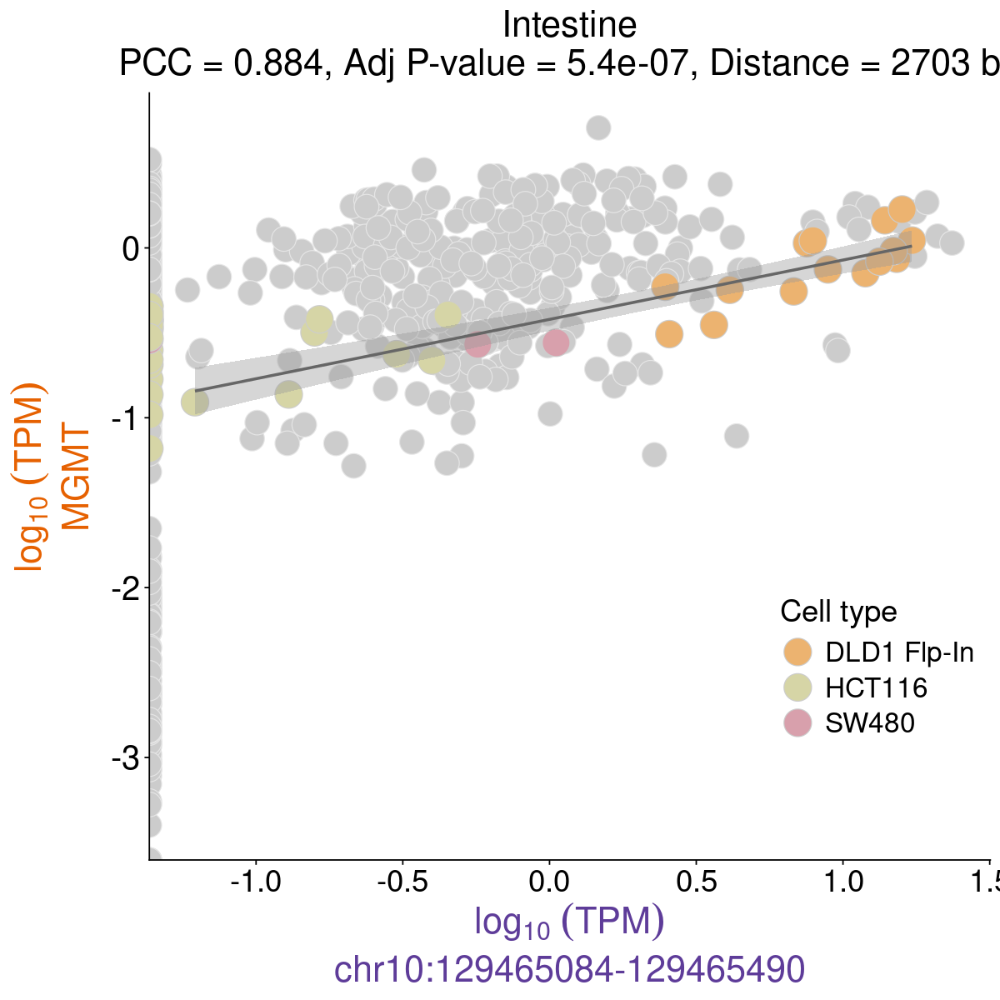

In [78]:
options(repr.plot.width=10, repr.plot.height=10) 

MGMT_intestine_cells <- plot_transcript_pairs_txptID_col_cell(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "MGMT:NM_002412.5",
                                                 bidir_id = "chr10:129465084-129465490",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors3,
                                                 tissue_id = "intestine") +
guides(color = guide_legend(position = "inside")) +
theme(legend.position=c(0.75,0.25))

MGMT_intestine_cells

In [79]:
ggsave(MGMT_intestine_cells, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/MGMT_intestine_cells_scatterplot_reviews.pdf',
      bg = "transparent")

ggsave(MGMT_intestine_cells, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/MGMT_intestine_cells_scatterplot_reviews.png',
      bg = "transparent")

ggsave(MGMT_intestine_cells, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/MGMT_intestine_cells_scatterplot_reviews.svg',
      bg = "transparent")


Warning message:
“Removed 23 rows containing non-finite outside the scale range
(`stat_smooth()`).”
Warning message:
“Removed 23 rows containing non-finite outside the scale range
(`stat_smooth()`).”
Warning message:
“Removed 23 rows containing non-finite outside the scale range
(`stat_smooth()`).”


[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  MGMT:NM_002412.5"
[1] "Bidirectional ID                      :  chr10:129465084-129465490"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.88436677777401"
[1] "Adj p-val                            : 5.40145241816647e-07"
[1] "Distance between gene & bidirectional: 2703"
[1] "-------------------------------------------------------------"
[1] 751
           MGMT:NM_002412.5 chr10:129465084-129465490
SRR7266931        0.3565623                 0.0000000
SRR7266932        0.3629449                 0.0000000
SRR7266933        0.3722364                 0.0000000
SRR7266934        0.3684656                 0.0000000
SRR7266935        0.3651213                 0.0000000
SRR7266936        0.3624505                 0.2058191
[1] "-------------------------------------------------------------"
            srz trans

Warning message:
“Removed 23 rows containing non-finite outside the scale range
(`stat_smooth()`).”


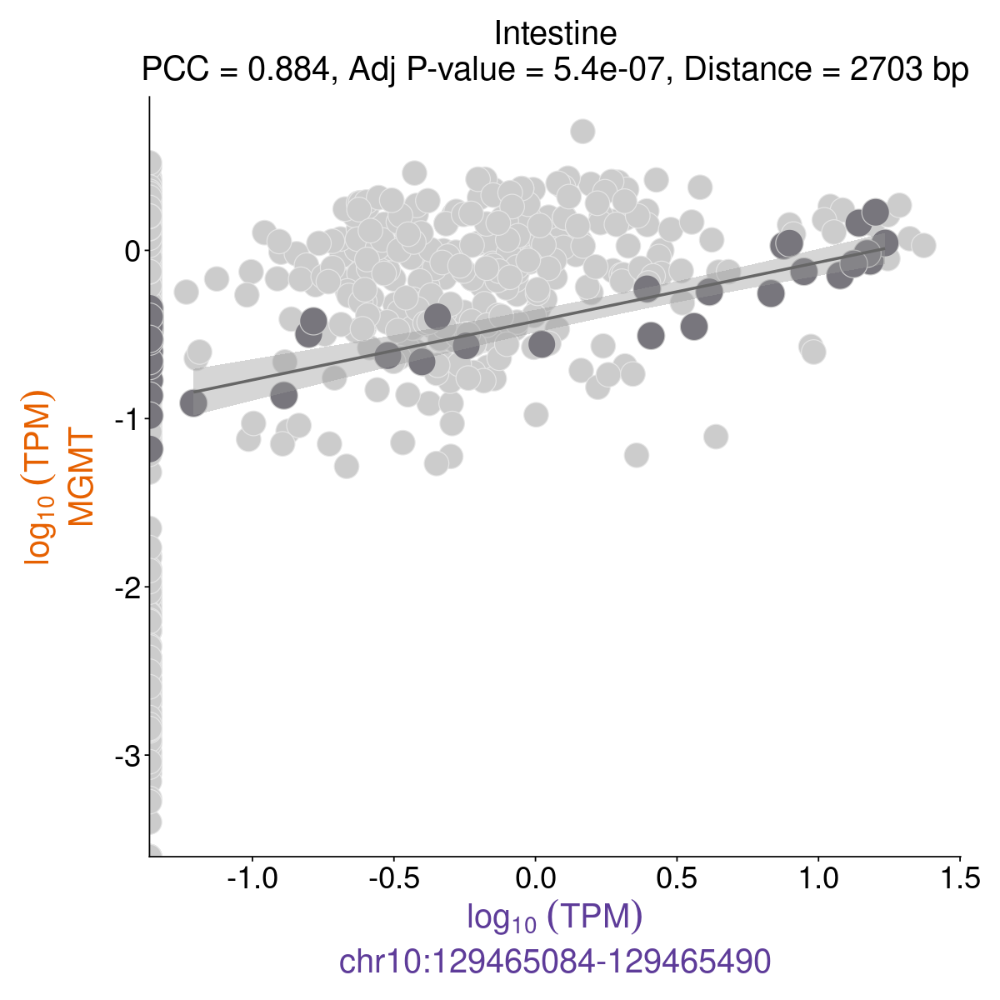

In [80]:
options(repr.plot.width=10, repr.plot.height=10) 

MGMT_intestine <- plot_transcript_pairs_txptID_colB(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "MGMT:NM_002412.5",
                                                 bidir_id = "chr10:129465084-129465490",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "intestine")

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  MGMT:NM_002412.5"
[1] "Bidirectional ID                      :  chr10:129465084-129465490"
[1] "-------------------------------------------------------------"
[1] "Calculate distance"
[1] "Distance = -2703 bp"
[1] "-------------------------------------------------------------"
[1] "-------------------------------------------------------------"
[1] "Calculating correlations"
[1] "-------------------------------------------------------------"


Warning message:
“Removed 149 rows containing non-finite outside the scale range
(`stat_smooth()`).”


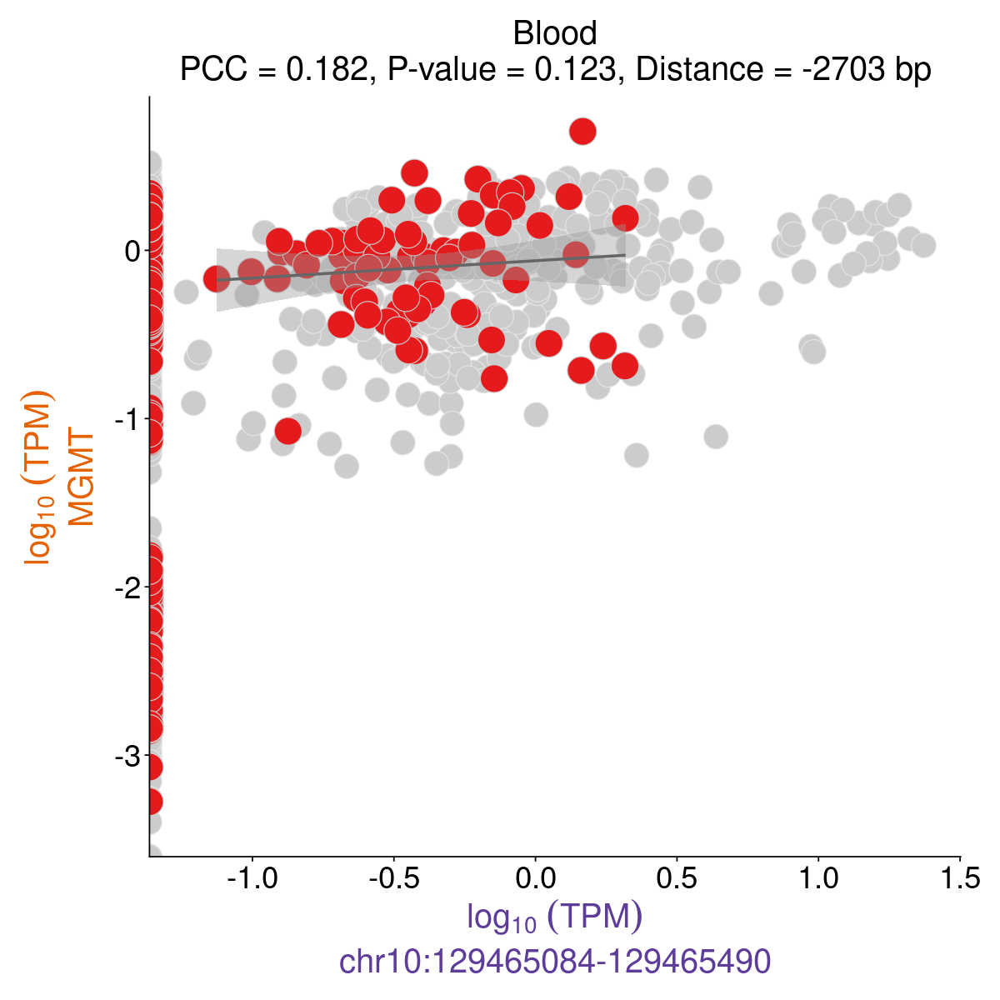

In [81]:
options(repr.plot.width=10, repr.plot.height=10) 

MGMT_blood <- plot_transcript_pairs_txptID_colB_non(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "MGMT:NM_002412.5",
                                                 bidir_id = "chr10:129465084-129465490",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "blood")

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  MGMT:NM_002412.5"
[1] "Bidirectional ID                      :  chr10:129465084-129465490"
[1] "-------------------------------------------------------------"
[1] "Calculate distance"
[1] "Distance = -2703 bp"
[1] "-------------------------------------------------------------"
[1] "-------------------------------------------------------------"
[1] "Calculating correlations"
[1] "-------------------------------------------------------------"


Warning message:
“Removed 32 rows containing non-finite outside the scale range
(`stat_smooth()`).”


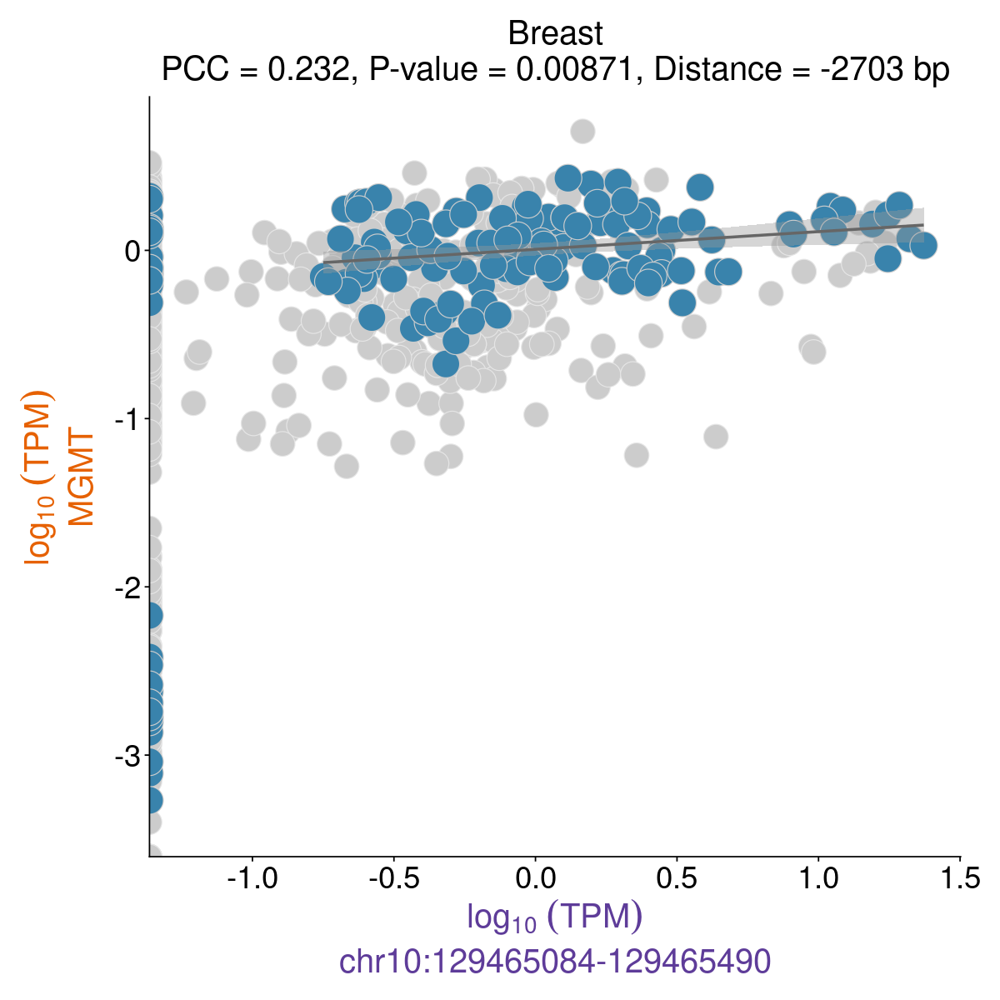

In [82]:
options(repr.plot.width=10, repr.plot.height=10) 

MGMT_breast <- plot_transcript_pairs_txptID_colB_non(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "MGMT:NM_002412.5",
                                                 bidir_id = "chr10:129465084-129465490",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "breast")

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  MGMT:NM_002412.5"
[1] "Bidirectional ID                      :  chr10:129465084-129465490"
[1] "-------------------------------------------------------------"
[1] "Calculate distance"
[1] "Distance = -2703 bp"
[1] "-------------------------------------------------------------"
[1] "-------------------------------------------------------------"
[1] "Calculating correlations"
[1] "-------------------------------------------------------------"


Warning message:
“Removed 28 rows containing non-finite outside the scale range
(`stat_smooth()`).”


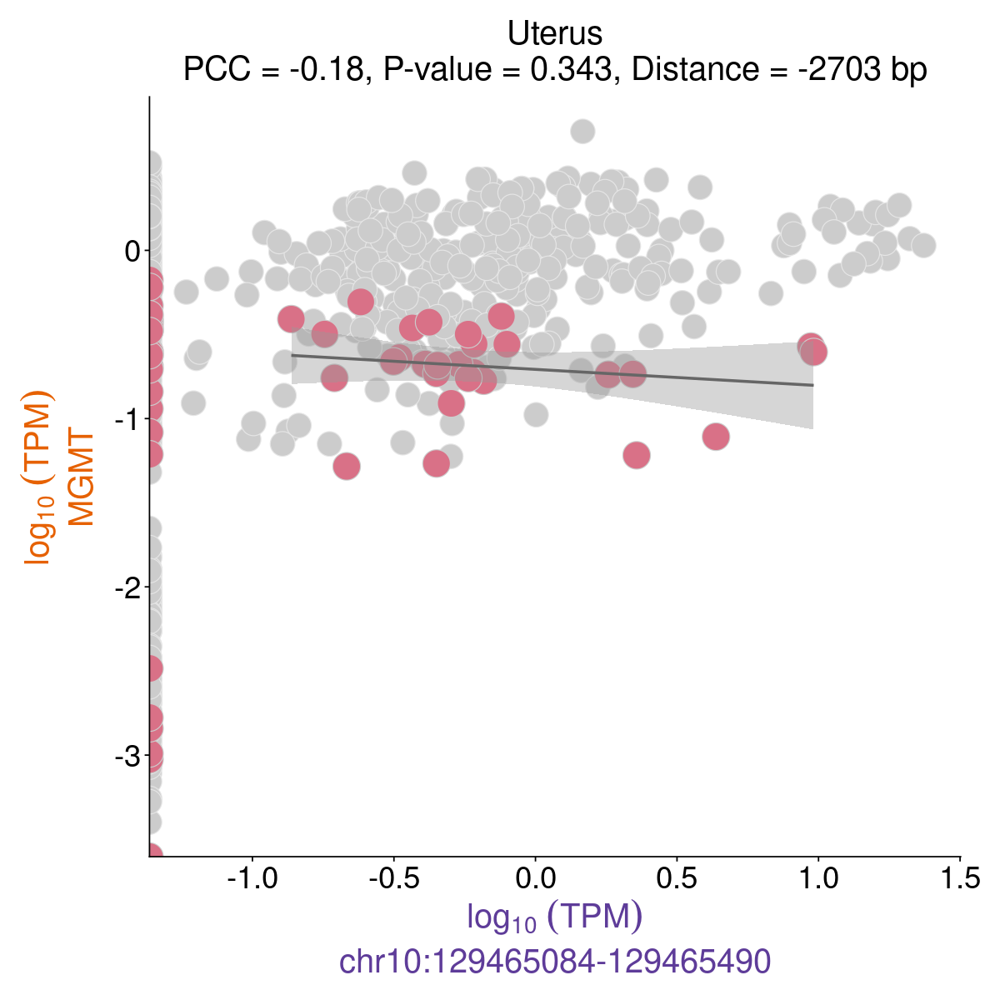

In [83]:
options(repr.plot.width=10, repr.plot.height=10) 

MGMT_uterus <- plot_transcript_pairs_txptID_colB_non(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "MGMT:NM_002412.5",
                                                 bidir_id = "chr10:129465084-129465490",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "uterus")

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  MGMT:NM_002412.5"
[1] "Bidirectional ID                      :  chr10:129465084-129465490"
[1] "-------------------------------------------------------------"
[1] "Calculate distance"
[1] "Distance = -2703 bp"
[1] "-------------------------------------------------------------"
[1] "-------------------------------------------------------------"
[1] "Calculating correlations"
[1] "-------------------------------------------------------------"


Warning message:
“Removed 28 rows containing non-finite outside the scale range
(`stat_smooth()`).”


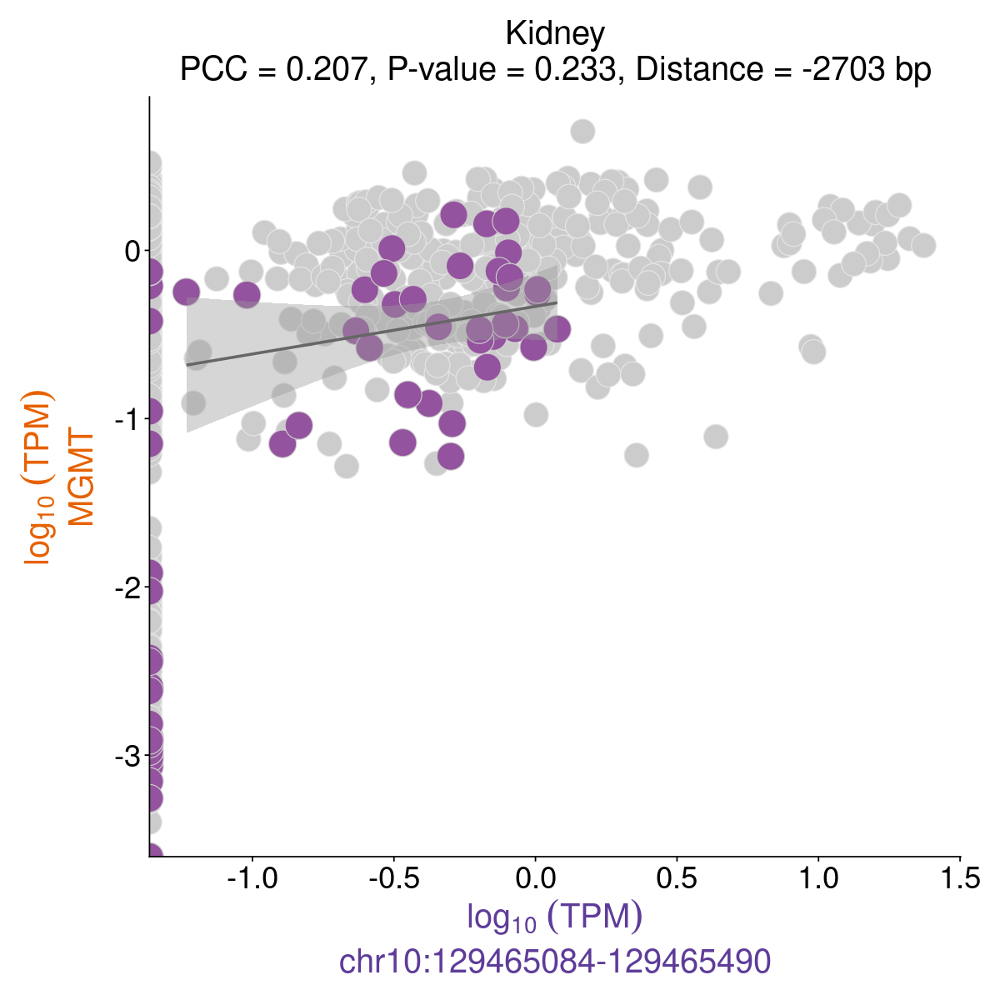

In [84]:
options(repr.plot.width=10, repr.plot.height=10) 

MGMT_kidney <- plot_transcript_pairs_txptID_colB_non(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "MGMT:NM_002412.5",
                                                 bidir_id = "chr10:129465084-129465490",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "kidney")

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  MGMT:NM_002412.5"
[1] "Bidirectional ID                      :  chr10:129465084-129465490"
[1] "-------------------------------------------------------------"
[1] "Calculate distance"
[1] "Distance = -2703 bp"
[1] "-------------------------------------------------------------"
[1] "-------------------------------------------------------------"
[1] "Calculating correlations"
[1] "-------------------------------------------------------------"


Warning message:
“Removed 14 rows containing non-finite outside the scale range
(`stat_smooth()`).”


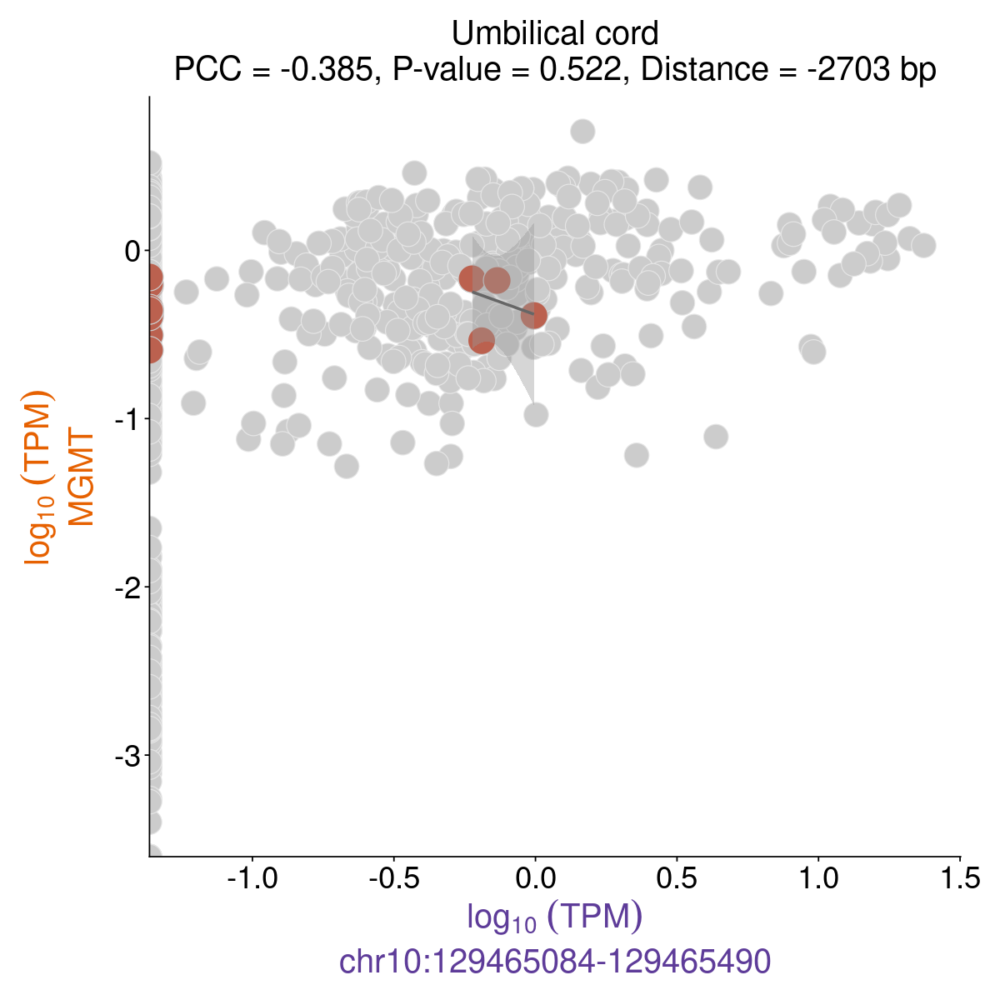

In [85]:
options(repr.plot.width=10, repr.plot.height=10) 

MGMT_umbilical_cord <- plot_transcript_pairs_txptID_colB_non(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "MGMT:NM_002412.5",
                                                 bidir_id = "chr10:129465084-129465490",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "umbilical cord")

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  MGMT:NM_002412.5"
[1] "Bidirectional ID                      :  chr10:129465084-129465490"
[1] "-------------------------------------------------------------"
[1] "Calculate distance"
[1] "Distance = -2703 bp"
[1] "-------------------------------------------------------------"
[1] "-------------------------------------------------------------"
[1] "Calculating correlations"
[1] "-------------------------------------------------------------"


Warning message:
“Removed 18 rows containing non-finite outside the scale range
(`stat_smooth()`).”


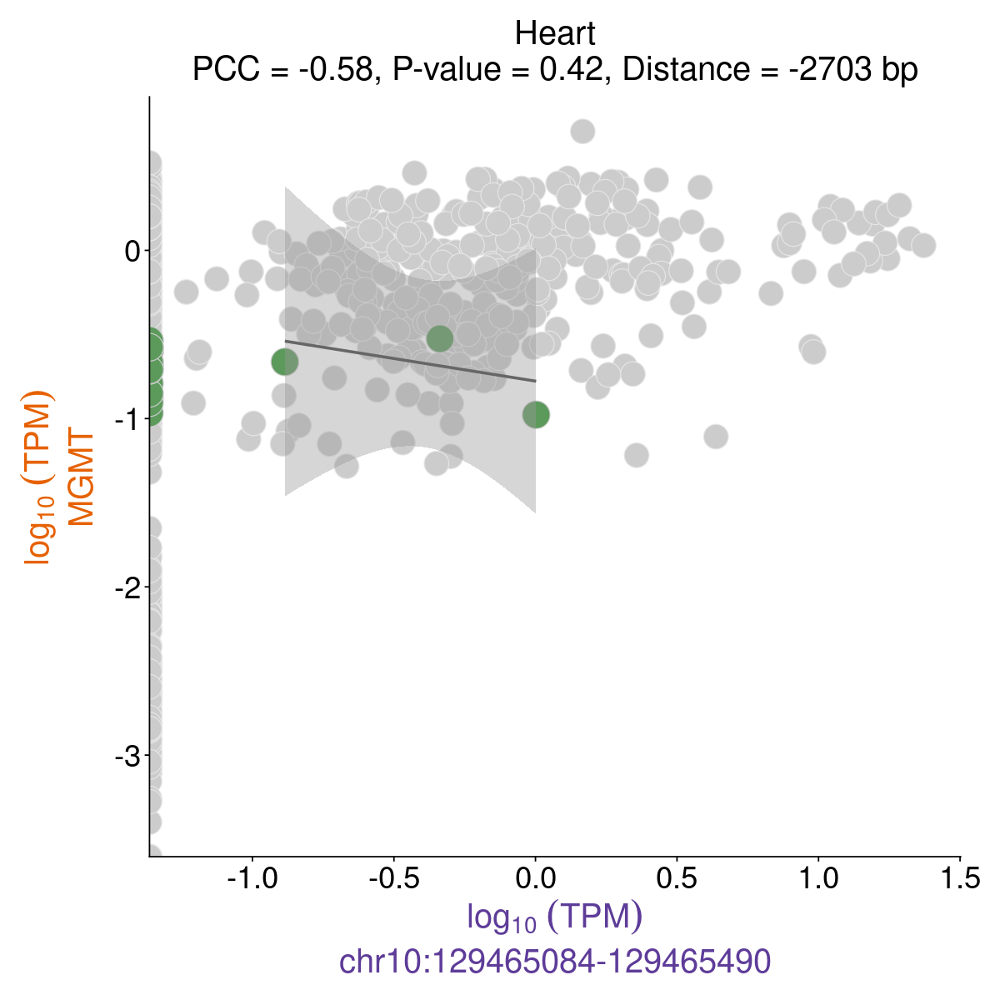

In [86]:
options(repr.plot.width=10, repr.plot.height=10) 

MGMT_heart <- plot_transcript_pairs_txptID_colB_non(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "MGMT:NM_002412.5",
                                                 bidir_id = "chr10:129465084-129465490",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "heart")

###  UGCG:NM_003358.3~chr9:111895244-111896198

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  UGCG:NM_003358.3"
[1] "Bidirectional ID                      :  chr9:111895244-111896198"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.847518046230975"
[1] "Adj p-val                            : 2.71162444141144e-55"
[1] "Distance between gene & bidirectional: 1842"
[1] "-------------------------------------------------------------"
[1] 751
           UGCG:NM_003358.3 chr9:111895244-111896198
SRR7266931         33.45004                 29.41466
SRR7266932         46.42160                 36.28814
SRR7266933         36.95839                 29.77102
SRR7266934         35.77064                 30.89367
SRR7266935         32.91987                 33.00761
SRR7266936         33.97308                 32.45476
[1] "-------------------------------------------------------------"
           srz transcript_1 

Warning message:
“Removed 13 rows containing non-finite outside the scale range
(`stat_smooth()`).”
Warning message:
“Removed 13 rows containing non-finite outside the scale range
(`stat_smooth()`).”


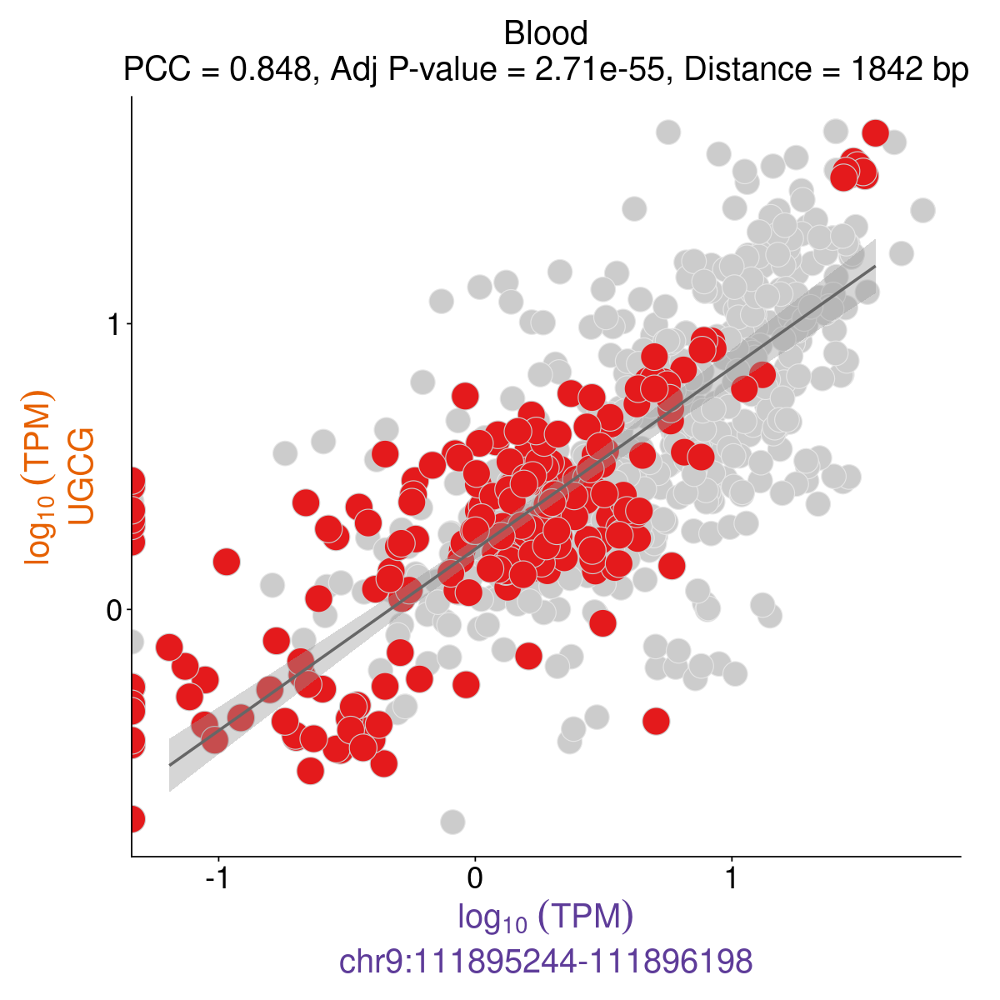

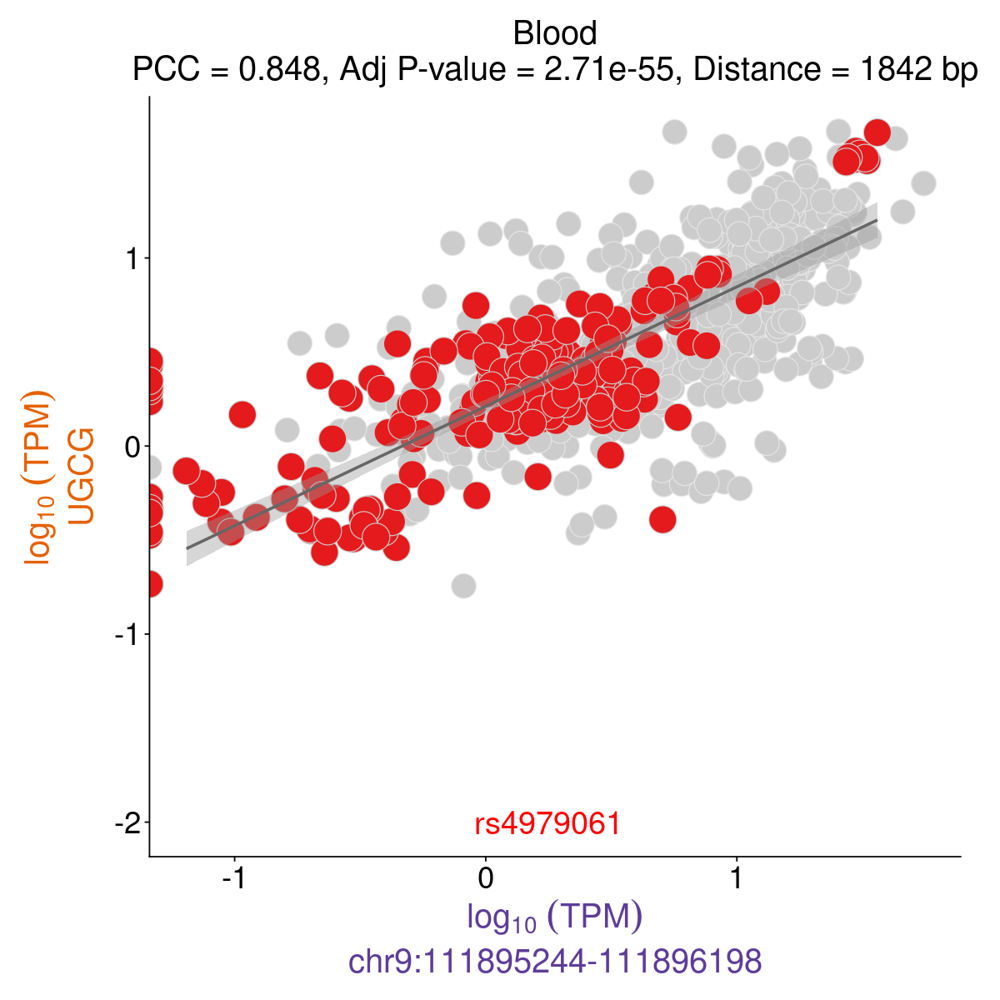

In [107]:
options(repr.plot.width=10, repr.plot.height=10) 

#rs4979061 (chr9_111895439_C_T_b38)

UGCG_blood <- plot_transcript_pairs_txptID_colB(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_DT,
                                                 nsample = 751,
                                                 gene_id = "UGCG:NM_003358.3",
                                                 bidir_id = "chr9:111895244-111896198",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "blood")+
annotate("text", x = 0.25, y = -2, size=8, label = "rs4979061", color='red')
UGCG_blood

In [111]:
ggsave(UGCG_blood, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/UGCG_blood_scatterplot_reviews.pdf',
      bg = "transparent")

ggsave(UGCG_blood, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/UGCG_blood_scatterplot_reviews.png',
      bg = "transparent")

ggsave(UGCG_blood, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/UGCG_blood_scatterplot_reviews.svg',
      bg = "transparent")

Warning message:
“Removed 13 rows containing non-finite outside the scale range
(`stat_smooth()`).”
Warning message:
“Removed 13 rows containing non-finite outside the scale range
(`stat_smooth()`).”
Warning message:
“Removed 13 rows containing non-finite outside the scale range
(`stat_smooth()`).”


### DRAM1:NM_018370.3~chr12:101877045-101877339

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  DRAM1:NM_018370.3"
[1] "Bidirectional ID                      :  chr12:101877045-101877339"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.667467256079389"
[1] "Adj p-val                            : 1.4146072844223e-25"
[1] "Distance between gene & bidirectional: 1137"
[1] "-------------------------------------------------------------"
[1] 751
           DRAM1:NM_018370.3 chr12:101877045-101877339
SRR7266931         0.2276279                  22.40558
SRR7266932         0.2727749                  17.44681
SRR7266933         0.2611696                  27.61225
SRR7266934         0.2529038                  21.33926
SRR7266935         0.2481319                  27.60850
SRR7266936         0.2349303                  26.40833
[1] "-------------------------------------------------------------"
           sr

Warning message:
“Removed 16 rows containing non-finite outside the scale range
(`stat_smooth()`).”
Warning message:
“Removed 16 rows containing non-finite outside the scale range
(`stat_smooth()`).”


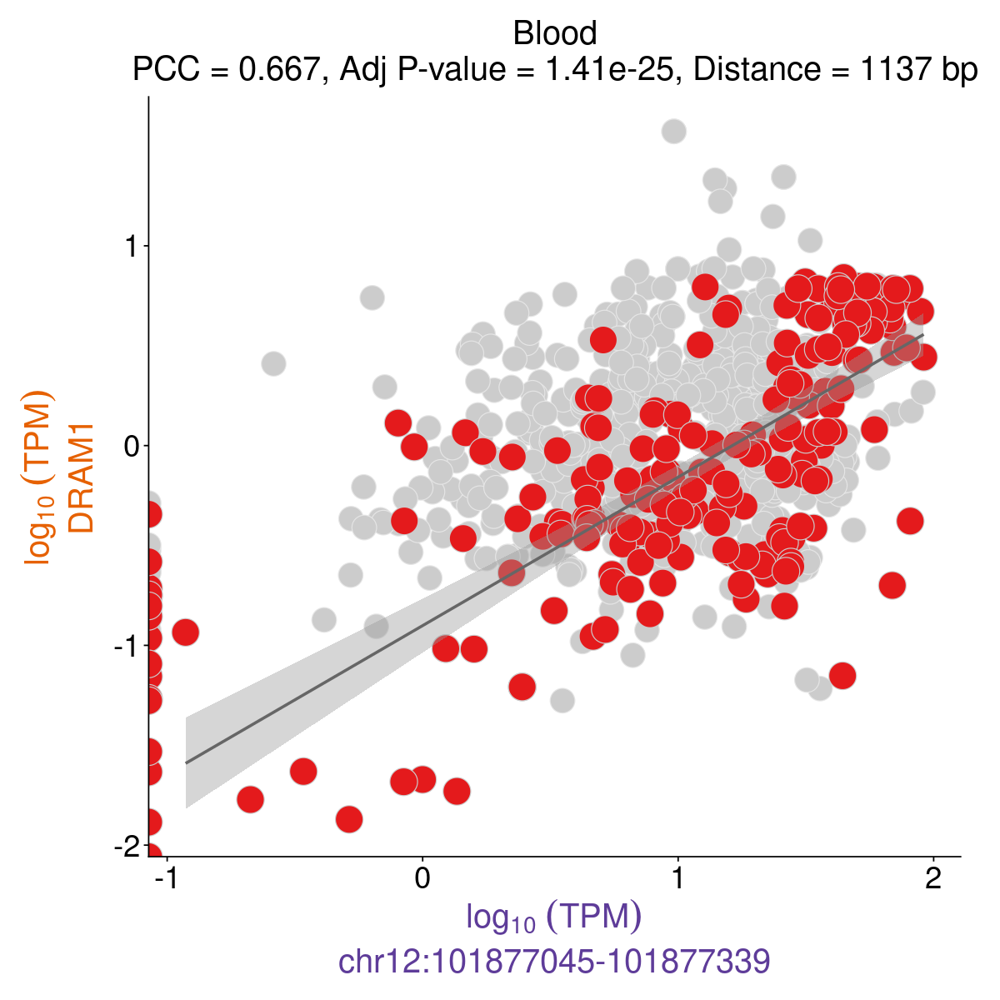

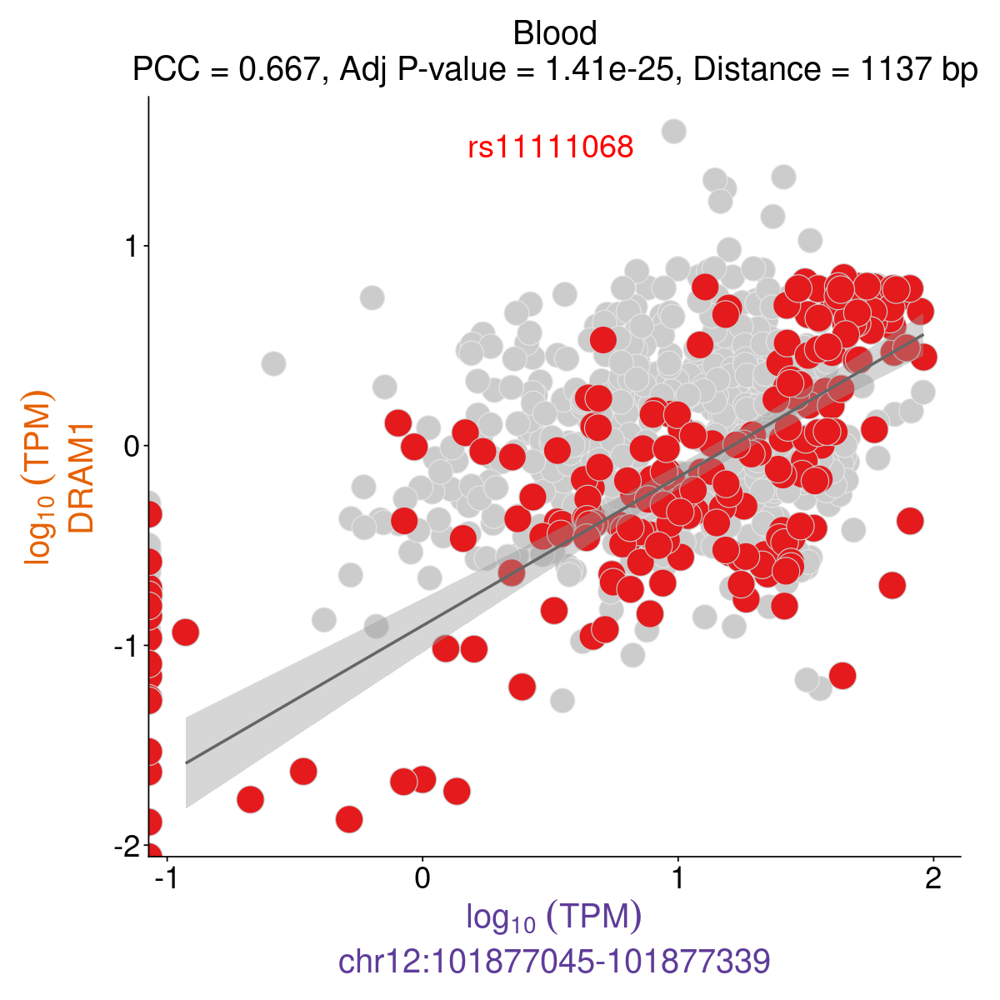

In [106]:
options(repr.plot.width=10, repr.plot.height=10) 

#rs11111068 (chr12_101877055_G_A_b38)

DRAM1_blood <- plot_transcript_pairs_txptID_colB(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_DT,
                                                 nsample = 751,
                                                 gene_id = "DRAM1:NM_018370.3",
                                                 bidir_id = "chr12:101877045-101877339",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "blood")+
annotate("text", x = 0.5, y = 1.5, size=8, label = "rs11111068", color='red')
DRAM1_blood

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  DRAM1:NM_018370.3"
[1] "Bidirectional ID                      :  chr12:101877045-101877339"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.740525794080823"
[1] "Adj p-val                            : 8.60371380597486e-09"
[1] "Distance between gene & bidirectional: 1137"
[1] "-------------------------------------------------------------"
[1] 751
           DRAM1:NM_018370.3 chr12:101877045-101877339
SRR7266931         0.2276279                  22.40558
SRR7266932         0.2727749                  17.44681
SRR7266933         0.2611696                  27.61225
SRR7266934         0.2529038                  21.33926
SRR7266935         0.2481319                  27.60850
SRR7266936         0.2349303                  26.40833
[1] "-------------------------------------------------------------"
            

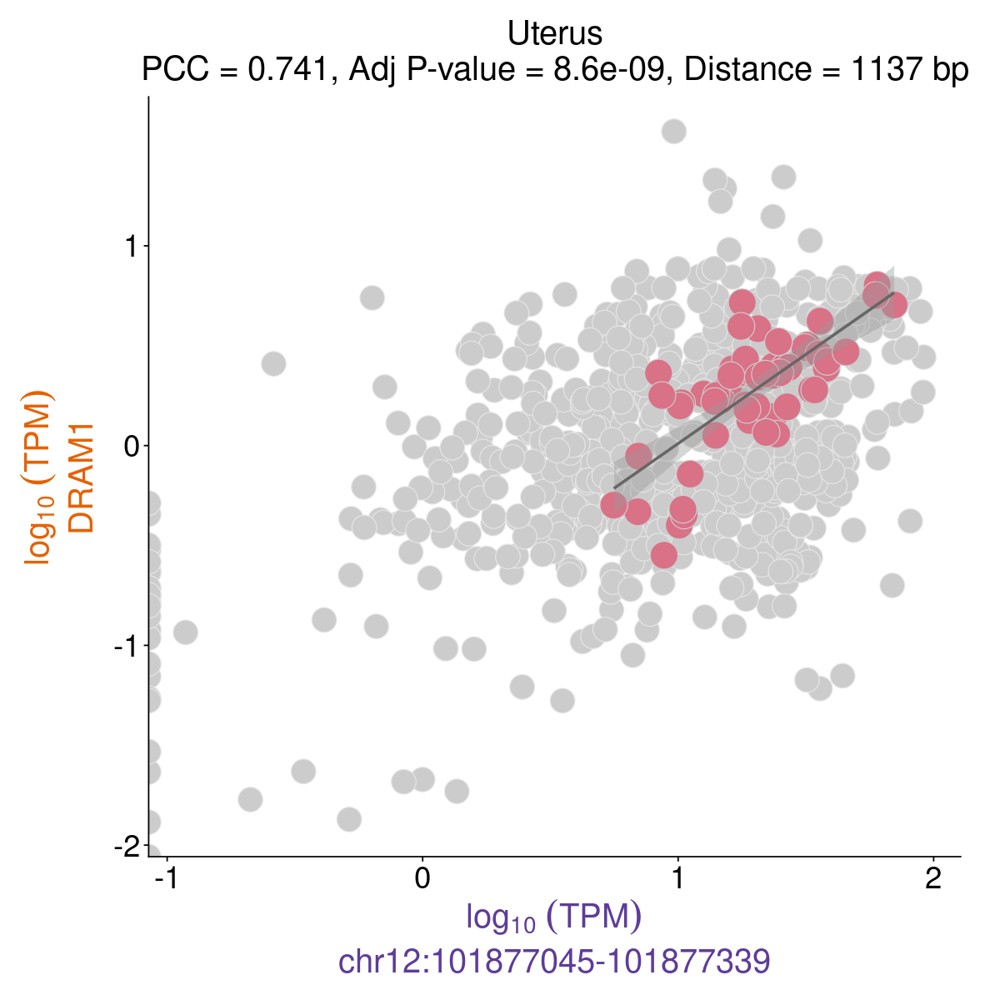

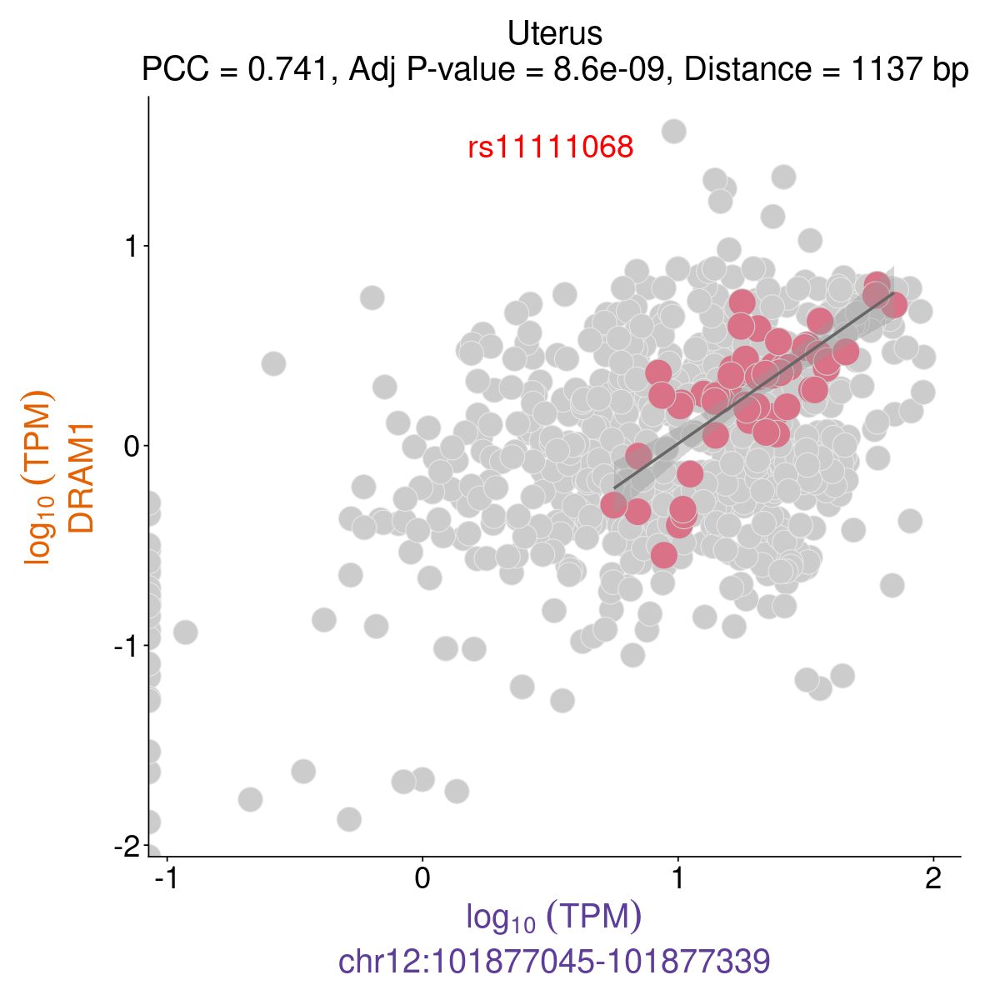

In [110]:
options(repr.plot.width=10, repr.plot.height=10) 

#rs11111068 (chr12_101877055_G_A_b38)

DRAM1_uterus <- plot_transcript_pairs_txptID_colB(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_DT,
                                                 nsample = 751,
                                                 gene_id = "DRAM1:NM_018370.3",
                                                 bidir_id = "chr12:101877045-101877339",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "uterus")+
annotate("text", x = 0.5, y = 1.5, size=8, label = "rs11111068", color='red')
DRAM1_uterus

In [112]:
ggsave(DRAM1_uterus, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/DRAM1_uterus_scatterplot_reviews.pdf',
      bg = "transparent")

ggsave(DRAM1_uterus, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/DRAM1_uterus_scatterplot_reviews.png',
      bg = "transparent")

ggsave(DRAM1_uterus, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/DRAM1_uterus_scatterplot_reviews.svg',
      bg = "transparent")

### TGFB1I1:NM_015927.5~chr16:31449677-31450571

rs75516957 (chr16_31450499_T_C_b38)

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  TGFB1I1:NM_015927.5"
[1] "Bidirectional ID                      :  chr16:31449677-31450571"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.647800528067374"
[1] "Adj p-val                            : 0.00856303727622756"
[1] "Distance between gene & bidirectional: 23830"
[1] "-------------------------------------------------------------"
[1] 751
           TGFB1I1:NM_015927.5 chr16:31449677-31450571
SRR7266931           0.7269393                9.495102
SRR7266932           0.7282208               11.117871
SRR7266933           0.9387050                9.101243
SRR7266934           0.7196218                9.067425
SRR7266935           0.9603041                9.437047
SRR7266936           0.8993857               11.699493
[1] "-------------------------------------------------------------"
           s

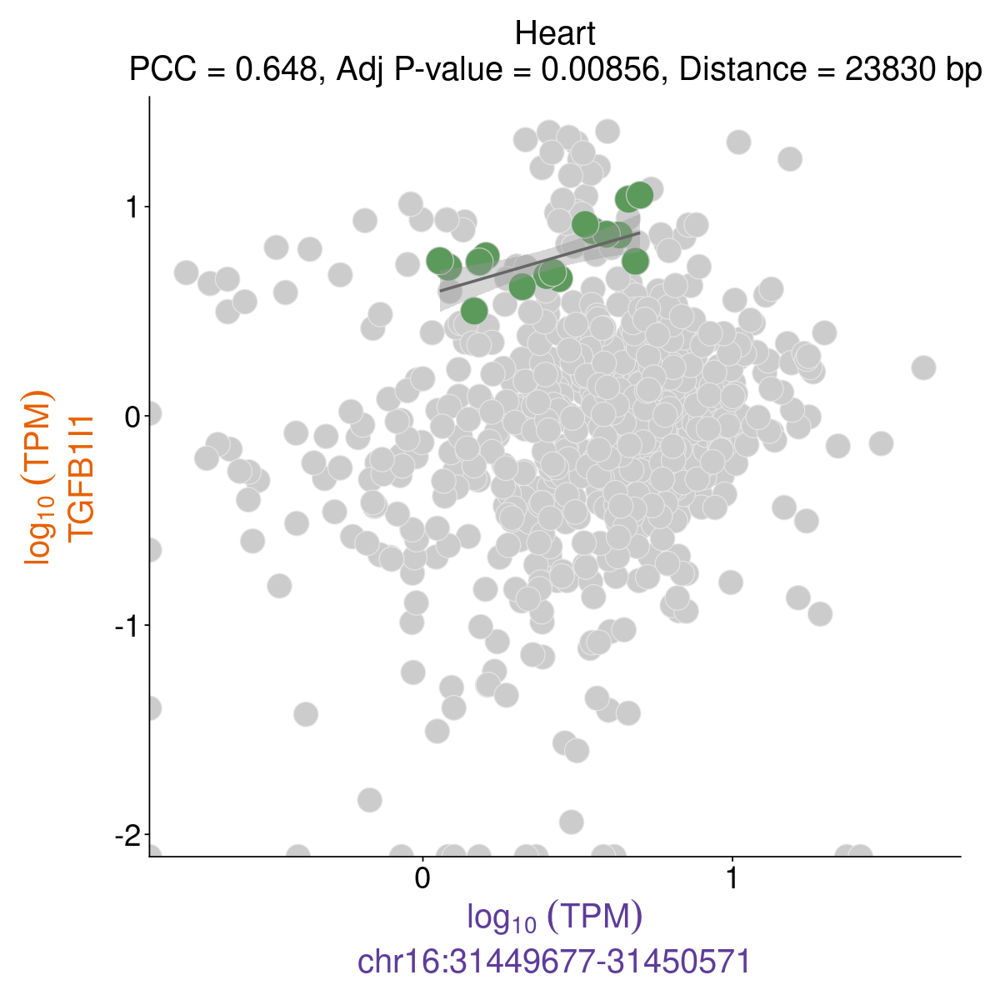

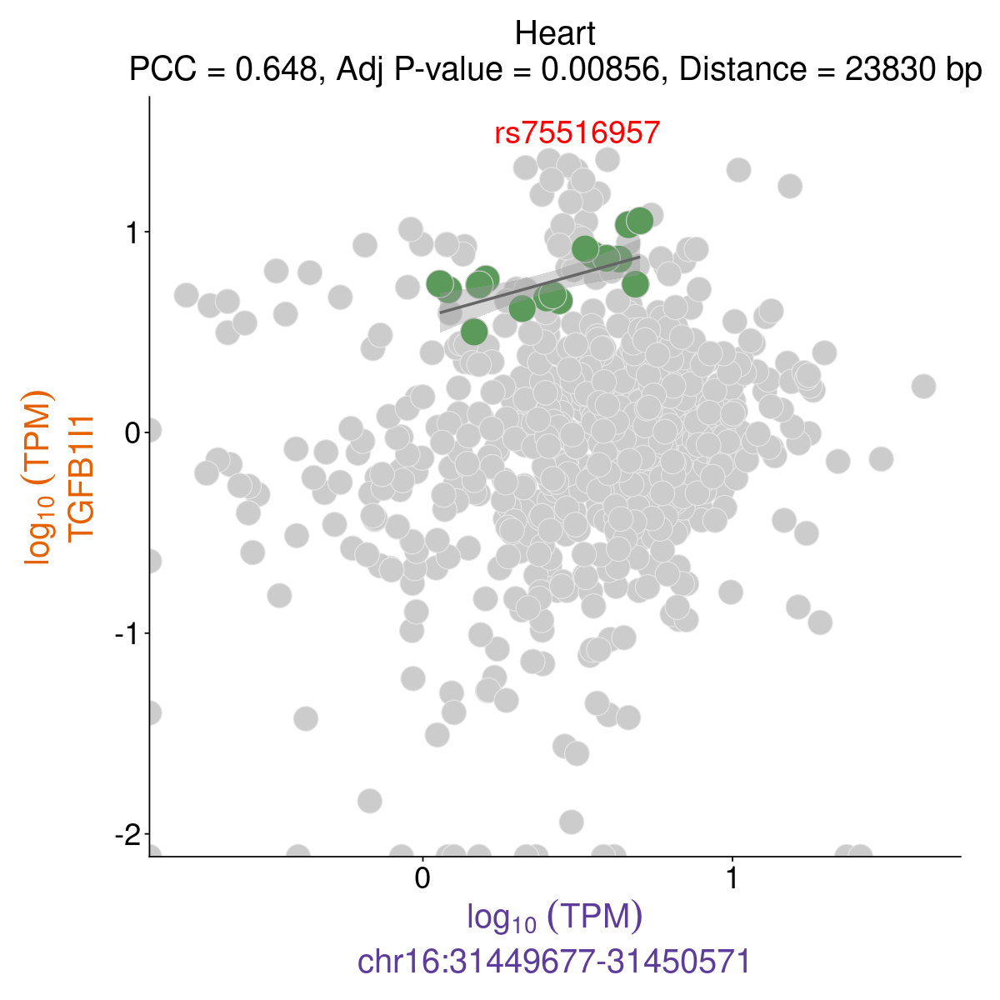

In [105]:
options(repr.plot.width=10, repr.plot.height=10) 

#rs75516957 (chr16_31450499_T_C_b38)

TGFB1I1_heart <- plot_transcript_pairs_txptID_colB(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_DT,
                                                 nsample = 751,
                                                 gene_id = "TGFB1I1:NM_015927.5",
                                                 bidir_id = "chr16:31449677-31450571",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "heart")+
annotate("text", x = 0.5, y = 1.5, size=8, label = "rs75516957", color='red')
TGFB1I1_heart

In [113]:
ggsave(TGFB1I1_heart, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/TGFB1I1_heart_scatterplot_reviews.pdf',
      bg = "transparent")

ggsave(TGFB1I1_heart, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/TGFB1I1_heart_scatterplot_reviews.png',
      bg = "transparent")

ggsave(TGFB1I1_heart, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/TGFB1I1_heart_scatterplot_reviews.svg',
      bg = "transparent")

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  TGFB1I1:NM_015927.5"
[1] "Bidirectional ID                      :  chr16:31449677-31450571"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.817950662839891"
[1] "Adj p-val                            : 1.39657503990221e-13"
[1] "Distance between gene & bidirectional: 23830"
[1] "-------------------------------------------------------------"
[1] 751
           TGFB1I1:NM_015927.5 chr16:31449677-31450571
SRR7266931           0.7269393                9.495102
SRR7266932           0.7282208               11.117871
SRR7266933           0.9387050                9.101243
SRR7266934           0.7196218                9.067425
SRR7266935           0.9603041                9.437047
SRR7266936           0.8993857               11.699493
[1] "-------------------------------------------------------------"
           

Warning message:
“Removed 1 row containing non-finite outside the scale range (`stat_smooth()`).”
Warning message:
“Removed 1 row containing non-finite outside the scale range (`stat_smooth()`).”


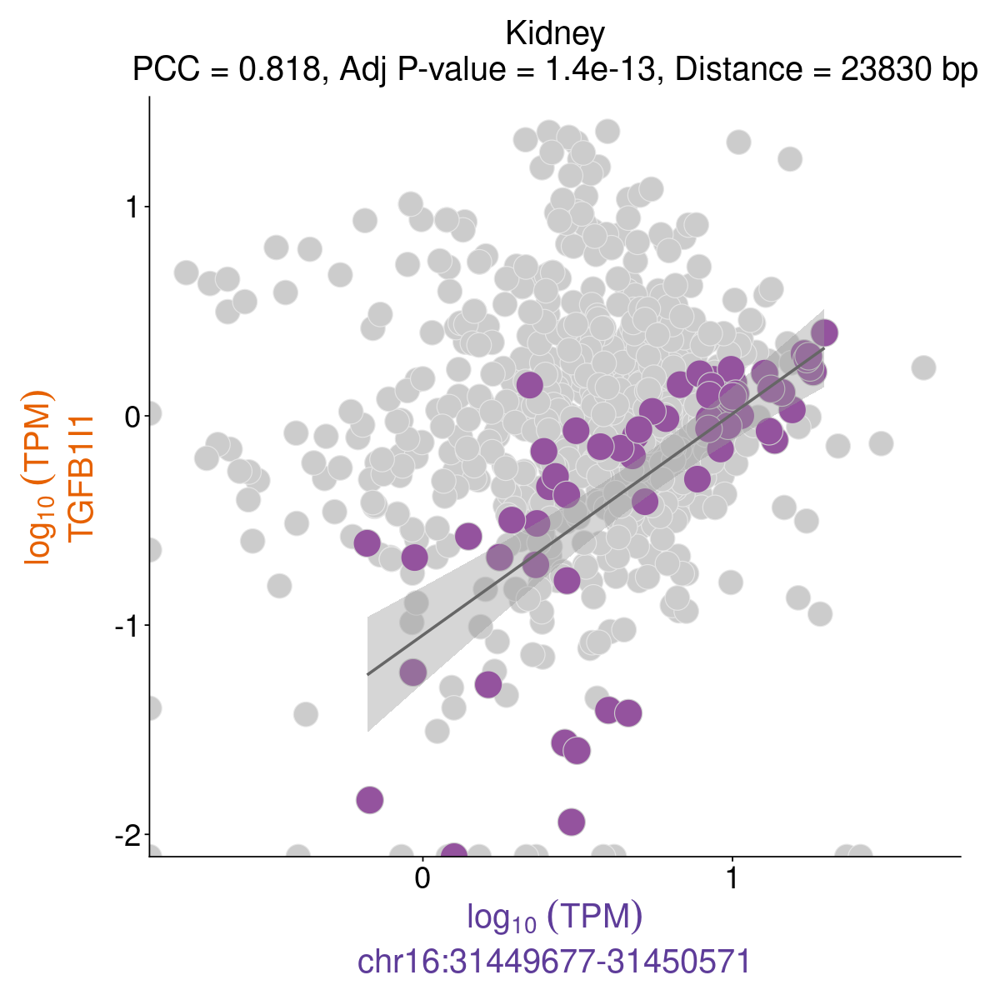

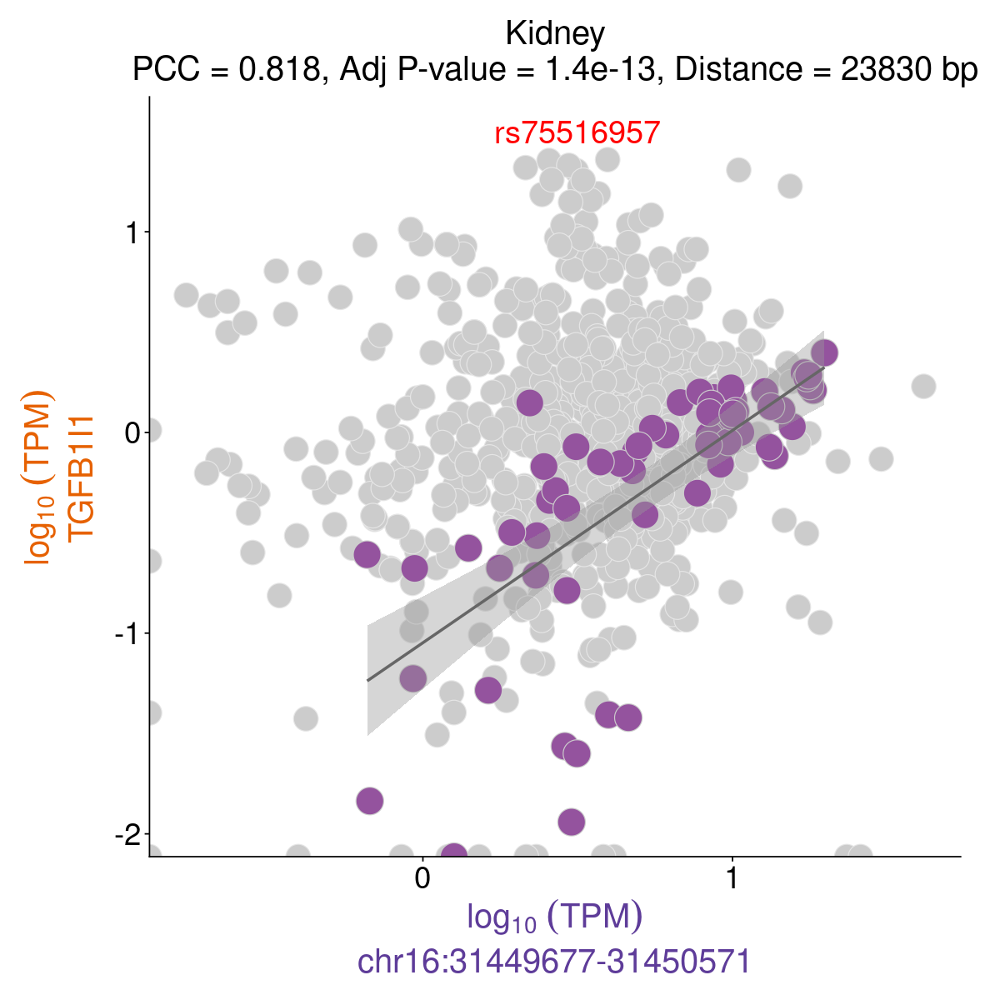

In [104]:
options(repr.plot.width=10, repr.plot.height=10) 

#rs75516957 (chr16_31450499_T_C_b38)

TGFB1I1_kidney <- plot_transcript_pairs_txptID_colB(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_DT,
                                                 nsample = 751,
                                                 gene_id = "TGFB1I1:NM_015927.5",
                                                 bidir_id = "chr16:31449677-31450571",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "kidney")+
annotate("text", x = 0.5, y = 1.5, size=8, label = "rs75516957", color='red')
TGFB1I1_kidney

### AGMAT:NM_024758.5~chr1:15603448-15603876


ENSG00000116771.5,chr1_15603594_G_GT_b38

rs200263397 (chr1_15603594_G_GT_b38)

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  AGMAT:NM_024758.5"
[1] "Bidirectional ID                      :  chr1:15603448-15603876"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : -0.711321289183927"
[1] "Adj p-val                            : 0.00215687475452924"
[1] "Distance between gene & bidirectional: 19361"
[1] "-------------------------------------------------------------"
[1] 751
           AGMAT:NM_024758.5 chr1:15603448-15603876
SRR7266931         0.1623170               31.36446
SRR7266932         0.1905620               27.99352
SRR7266933         0.1491397               32.49774
SRR7266934         0.1865420               28.11014
SRR7266935         0.2034284               44.82538
SRR7266936         0.1728005               35.92862
[1] "-------------------------------------------------------------"
            srz transcript_1 transc

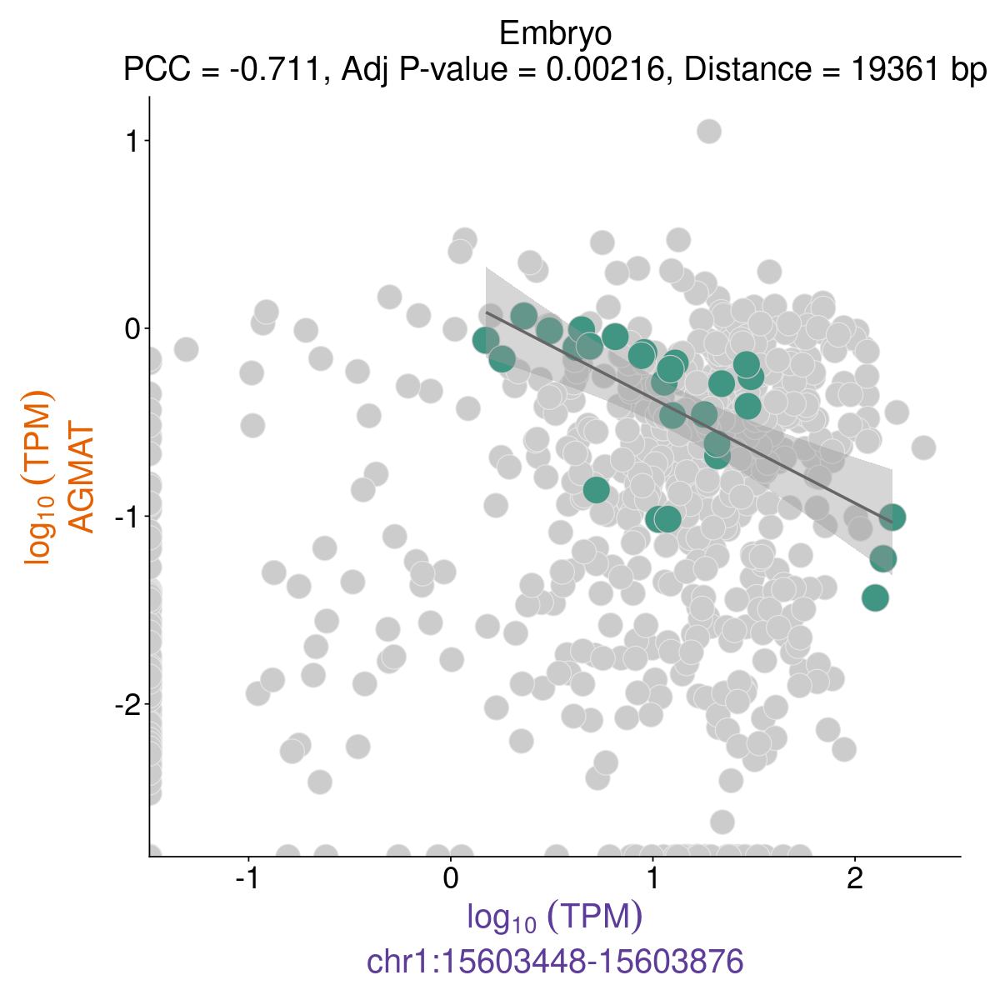

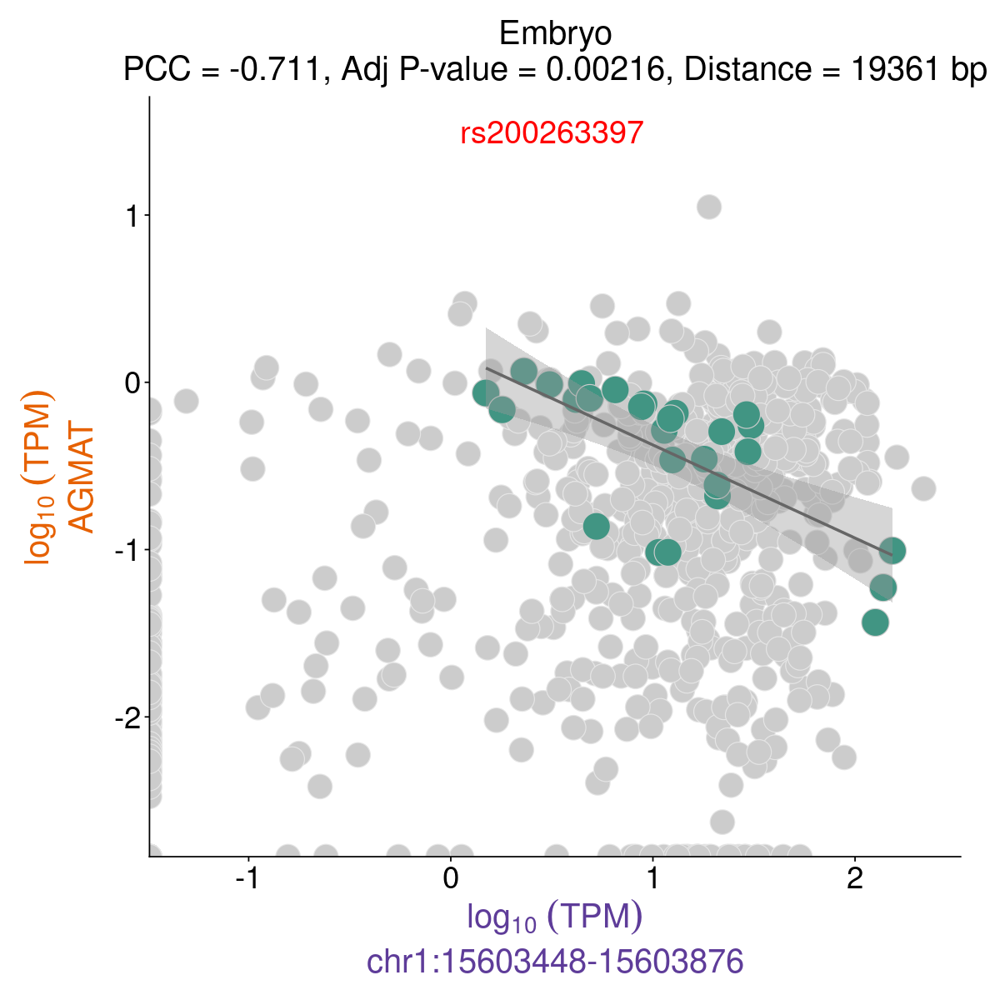

In [103]:
options(repr.plot.width=10, repr.plot.height=10) 

#rs200263397 (chr1_15603594_G_GT_b38)

AGMAT_embryo <- plot_transcript_pairs_txptID_colB(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_DT,
                                                 nsample = 751,
                                                 gene_id = "AGMAT:NM_024758.5",
                                                 bidir_id = "chr1:15603448-15603876",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "embryo") +
annotate("text", x = 0.5, y = 1.5, size=8, label = "rs200263397", color='red')
AGMAT_embryo

In [114]:
ggsave(AGMAT_embryo, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/AGMAT_embryo_scatterplot_reviews.pdf',
      bg = "transparent")

ggsave(AGMAT_embryo, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/AGMAT_embryo_scatterplot_reviews.png',
      bg = "transparent")

ggsave(AGMAT_embryo, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/AGMAT_embryo_scatterplot_reviews.svg',
      bg = "transparent")

### RFC2:NM_002914.5~chr7:74279531-74279963

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  RFC2:NM_002914.5"
[1] "Bidirectional ID                      :  chr7:74279531-74279963"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : -0.827124329882991"
[1] "Adj p-val                            : 3.04048555933298e-05"
[1] "Distance between gene & bidirectional: 26098"
[1] "-------------------------------------------------------------"
[1] 751
           RFC2:NM_002914.5 chr7:74279531-74279963
SRR7266931         3.740875              0.7268939
SRR7266932         3.594020              1.1886392
SRR7266933         4.112596              1.0853099
SRR7266934         3.814646              0.3503203
SRR7266935         3.796312              0.1741619
SRR7266936         3.952230              0.9673022
[1] "-------------------------------------------------------------"
            srz transcript_1 transcript_2 

Warning message:
“Removed 1 row containing non-finite outside the scale range (`stat_smooth()`).”


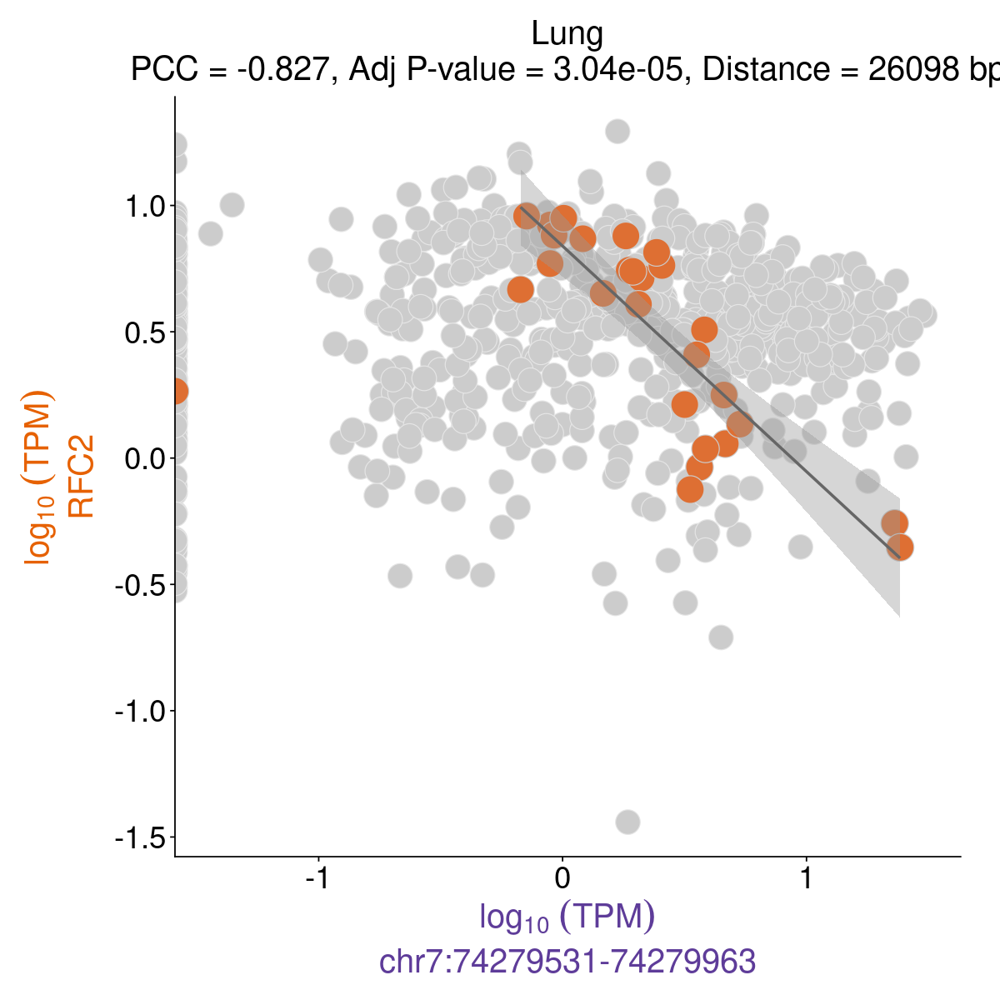

In [108]:
RFC2_lung <- plot_transcript_pairs_txptID_colB(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_DT,
                                                 nsample = 751,
                                                 gene_id = "RFC2:NM_002914.5",
                                                 bidir_id = "chr7:74279531-74279963",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "lung")

In [115]:
ggsave(RFC2_lung, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/RFC2_lung_scatterplot_reviews.pdf',
      bg = "transparent")

ggsave(RFC2_lung, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/RFC2_lung_scatterplot_reviews.png',
      bg = "transparent")

ggsave(RFC2_lung, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/RFC2_lung_scatterplot_reviews.svg',
      bg = "transparent")

Warning message:
“Removed 1 row containing non-finite outside the scale range (`stat_smooth()`).”
Warning message:
“Removed 1 row containing non-finite outside the scale range (`stat_smooth()`).”
Warning message:
“Removed 1 row containing non-finite outside the scale range (`stat_smooth()`).”


### SUMO2:NM_006937.4~chr17:75199605-75200257

rs190824641 (chr17_75200186_A_G_b38)

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  SUMO2:NM_006937.4"
[1] "Bidirectional ID                      :  chr17:75199605-75200257"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.704490962208874"
[1] "Adj p-val                            : 7.04097179314941e-08"
[1] "Distance between gene & bidirectional: 17722"
[1] "-------------------------------------------------------------"
[1] 751
           SUMO2:NM_006937.4 chr17:75199605-75200257
SRR7266931          4.411164               0.0000000
SRR7266932          5.417692               0.0000000
SRR7266933          4.555701               0.2398873
SRR7266934          4.603125               0.3484426
SRR7266935          5.071323               0.1154856
SRR7266936          4.968157               0.3848470
[1] "-------------------------------------------------------------"
           srz transcript_1

Warning message:
“Removed 7 rows containing non-finite outside the scale range (`stat_smooth()`).”
Warning message:
“Removed 7 rows containing non-finite outside the scale range (`stat_smooth()`).”


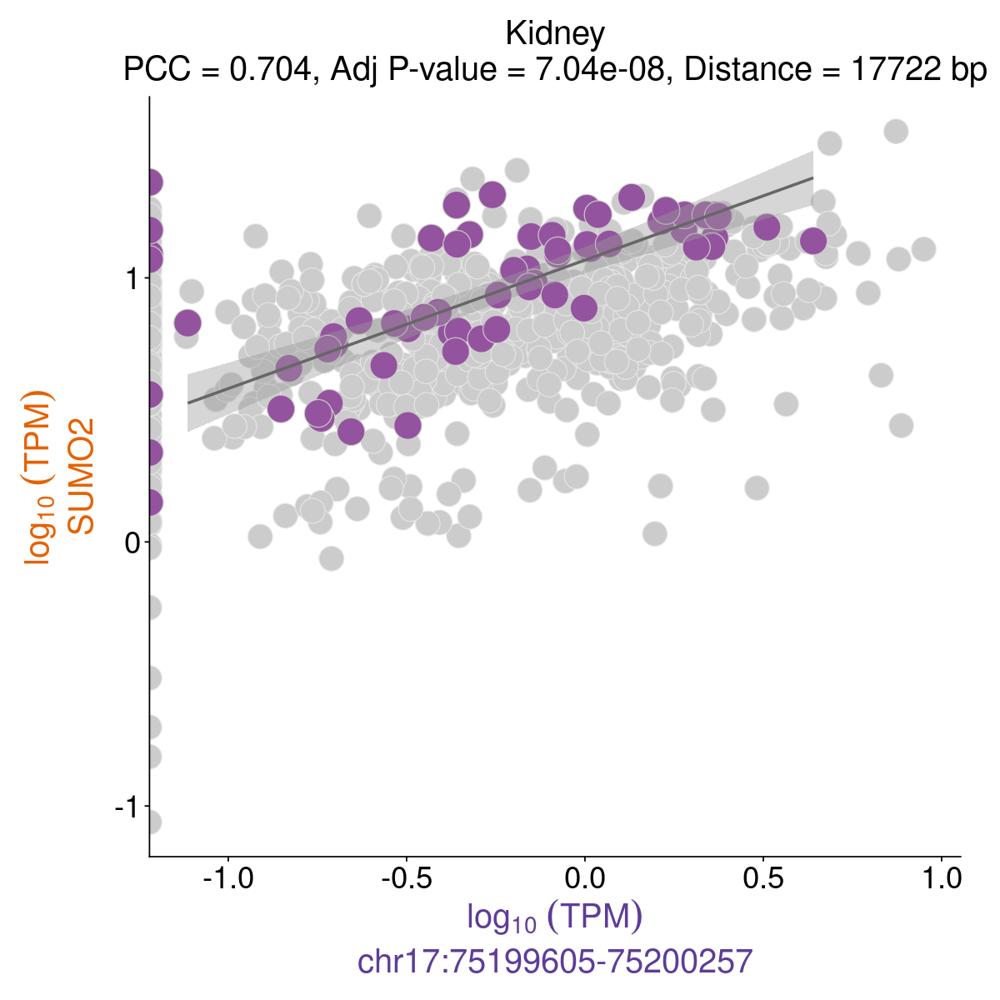

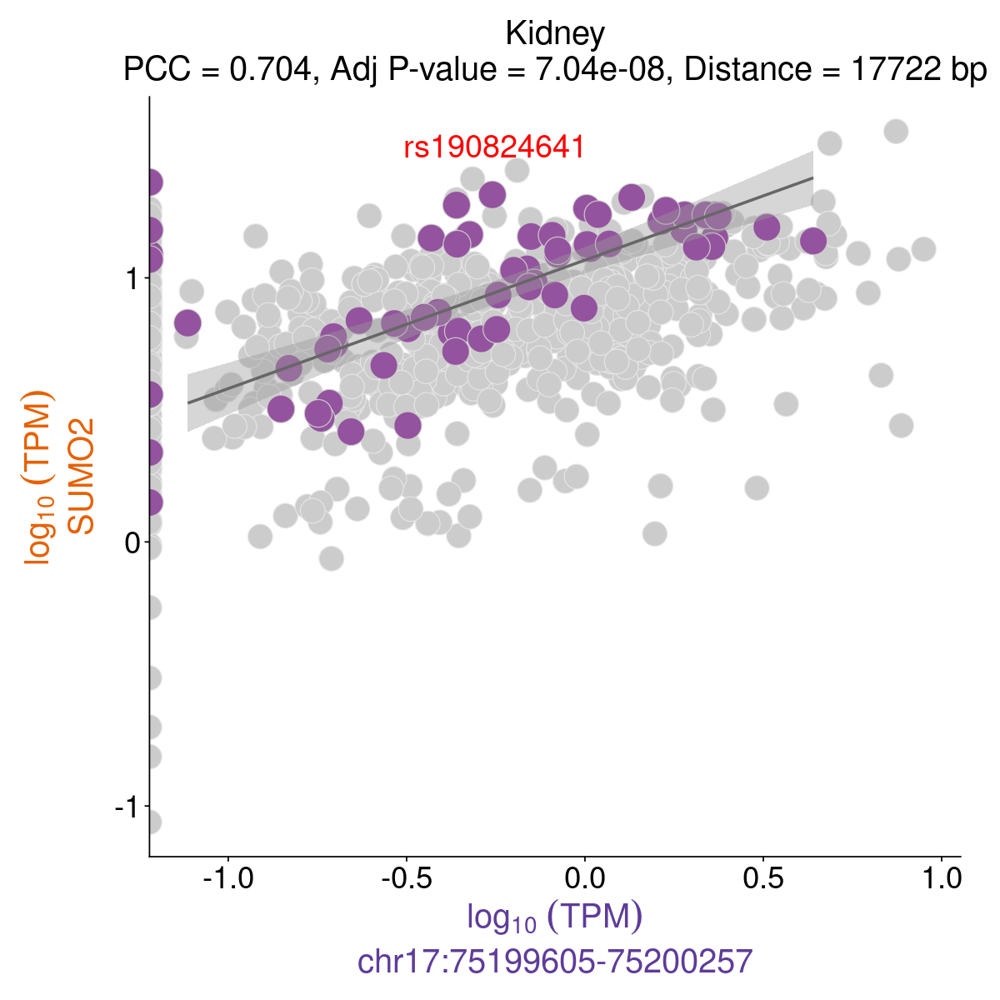

In [109]:
SUMO2_kidney <- plot_transcript_pairs_txptID_colB(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_DT,
                                                 nsample = 751,
                                                 gene_id = "SUMO2:NM_006937.4",
                                                 bidir_id = "chr17:75199605-75200257",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "kidney") +
annotate("text", x = -0.25, y = 1.5, size=8, label = "rs190824641", color='red')

SUMO2_kidney

In [116]:
ggsave(SUMO2_kidney, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/SUMO2_kidney_scatterplot_reviews.pdf',
      bg = "transparent")

ggsave(SUMO2_kidney, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/SUMO2_kidney_scatterplot_reviews.png',
      bg = "transparent")

ggsave(SUMO2_kidney, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/meta_analysis_qc_reviews/paper_figures/SUMO2_kidney_scatterplot_reviews.svg',
      bg = "transparent")

Warning message:
“Removed 7 rows containing non-finite outside the scale range (`stat_smooth()`).”
Warning message:
“Removed 7 rows containing non-finite outside the scale range (`stat_smooth()`).”
Warning message:
“Removed 7 rows containing non-finite outside the scale range (`stat_smooth()`).”


## p53 responsive genes

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  ANXA4:NM_001153.5"
[1] "Bidirectional ID                      :  chr2:70570005-70570387"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.708523355820461"
[1] "Adj p-val                            : 1.69536691196076e-06"
[1] "Distance between gene & bidirectional: 827313"
[1] "-------------------------------------------------------------"
[1] 751
           ANXA4:NM_001153.5 chr2:70570005-70570387
SRR7266931         0.9435252                      0
SRR7266932         1.1202439                      0
SRR7266933         1.0656344                      0
SRR7266934         1.0310077                      0
SRR7266935         0.9749946                      0
SRR7266936         1.0333056                      0
[1] "-------------------------------------------------------------"
            srz transcript_1 trans

Warning message:
“Removed 1 row containing non-finite outside the scale range (`stat_smooth()`).”


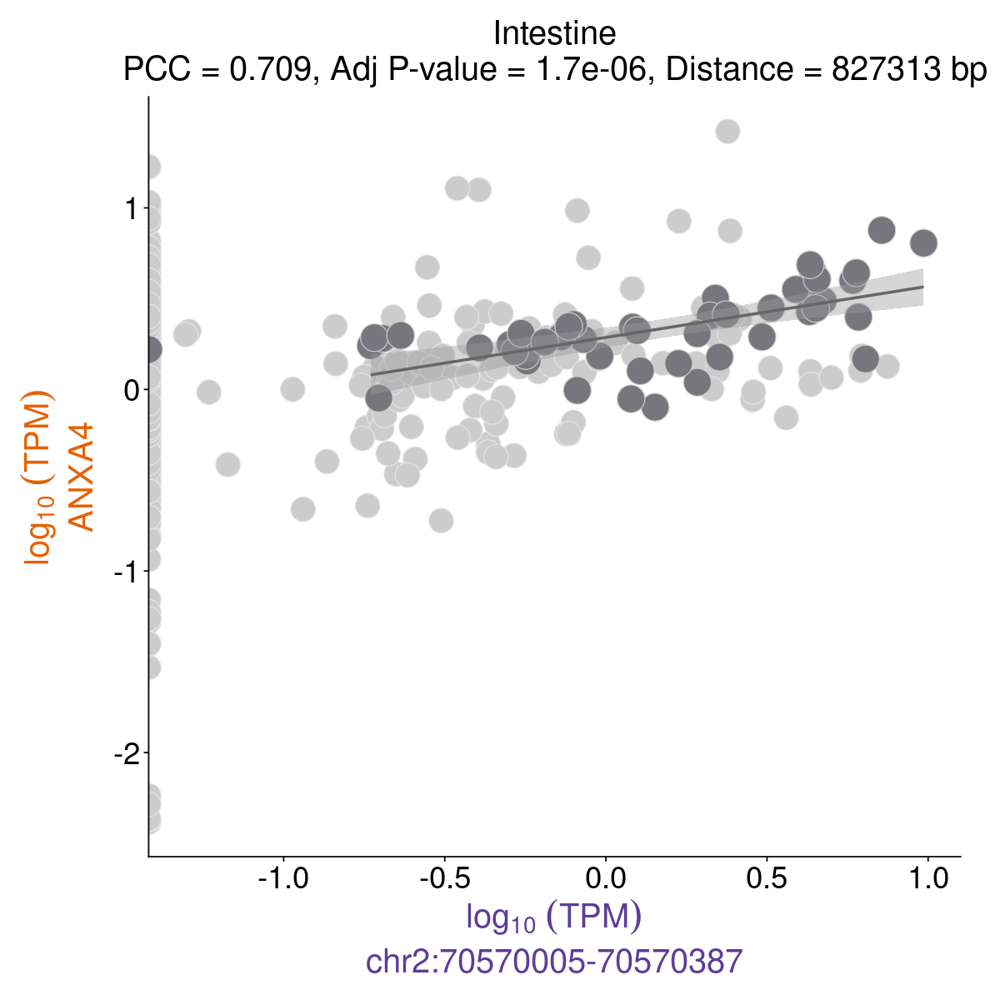

In [81]:
options(repr.plot.width=10, repr.plot.height=10) 

ANXA4_intestine <- plot_transcript_pairs_txptID_colB(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "ANXA4:NM_001153.5",
                                                 bidir_id = "chr2:70570005-70570387",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "intestine") 

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  ANXA4:NM_001153.5"
[1] "Bidirectional ID                      :  chr2:70570005-70570387"
[1] "-------------------------------------------------------------"
[1] 1
[1] "PCC                                  : 0.708523355820461"
[1] "Adj p-val                            : 1.69536691196076e-06"
[1] "Distance between gene & bidirectional: 827313"
[1] "-------------------------------------------------------------"
[1] 751
           ANXA4:NM_001153.5 chr2:70570005-70570387
SRR7266931         0.9435252                      0
SRR7266932         1.1202439                      0
SRR7266933         1.0656344                      0
[1] "-------------------------------------------------------------"
            srz transcript_1 transcript_2   organism    tissue
104 SRR11024606     3.989099     5.838315 H. sapiens intestine
105 SRR11024607     2.683310     4.285577 H. sapiens intestine
1

Warning message:
“Removed 1 row containing non-finite outside the scale range (`stat_smooth()`).”


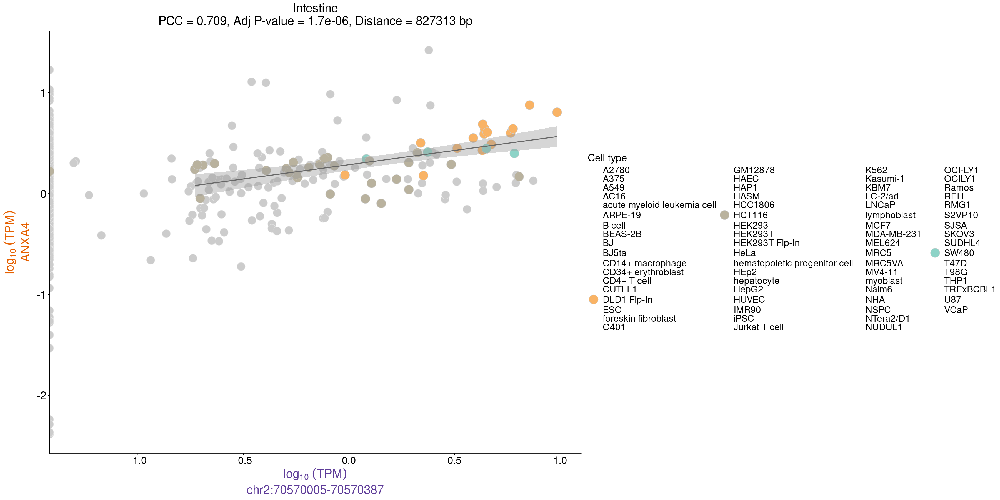

In [83]:
options(repr.plot.width=30, repr.plot.height=15) 

ANXA4_intestine_cell <- plot_transcript_pairs_txptID_col_cell(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "ANXA4:NM_001153.5",
                                                 bidir_id = "chr2:70570005-70570387",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors3,
                                                 tissue_id = "intestine") 

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  ANXA4:NM_001153.5"
[1] "Bidirectional ID                      :  chr2:70570005-70570387"
[1] "-------------------------------------------------------------"
[1] "Calculate distance"
[1] "Distance = 827313 bp"
[1] "-------------------------------------------------------------"
[1] "-------------------------------------------------------------"
[1] "Calculating correlations"
[1] "-------------------------------------------------------------"


Warning message:
“Removed 120 rows containing non-finite outside the scale range
(`stat_smooth()`).”


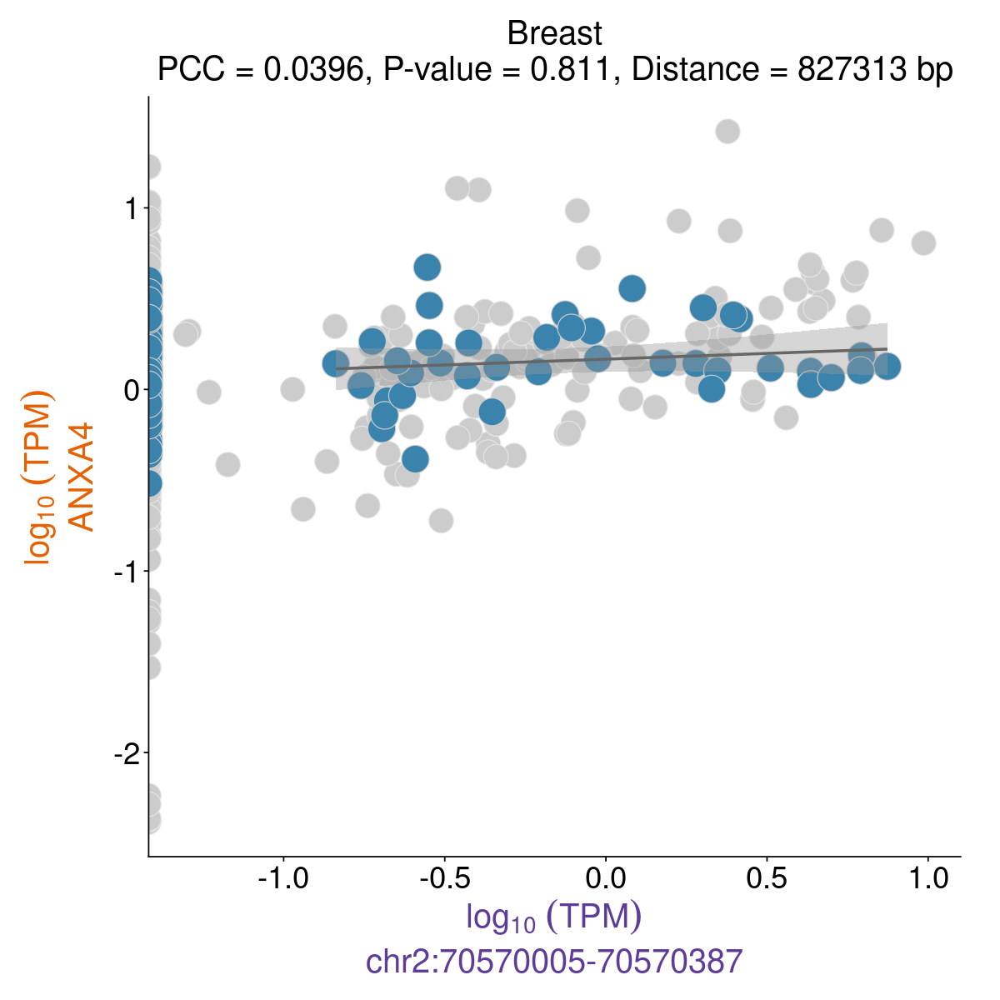

In [84]:
options(repr.plot.width=10, repr.plot.height=10) 

ANXA4_breast <- plot_transcript_pairs_txptID_colB_non(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "ANXA4:NM_001153.5",
                                                 bidir_id = "chr2:70570005-70570387",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors,
                                                 tissue_id = "breast") 

[1] "-------------------------------------------------------------"
[1] "Gene ID                               :  ANXA4:NM_001153.5"
[1] "Bidirectional ID                      :  chr2:70570005-70570387"
[1] "-------------------------------------------------------------"
[1] 0
[1] "PCC                                  : "
[1] "Adj p-val                            : "
[1] "Distance between gene & bidirectional: "
[1] "-------------------------------------------------------------"
[1] 751
           ANXA4:NM_001153.5 chr2:70570005-70570387
SRR7266931         0.9435252                      0
SRR7266932         1.1202439                      0
SRR7266933         1.0656344                      0
[1] "-------------------------------------------------------------"
        srz transcript_1 transcript_2   organism tissue
3 SRM497907    2.0932112    0.9021901 H. sapiens breast
4 SRM497911    2.1307159    0.0000000 H. sapiens breast
5 SRM497914    0.8655663    0.2098752 H. sapiens breast
         

Warning message:
“Removed 120 rows containing non-finite outside the scale range
(`stat_smooth()`).”


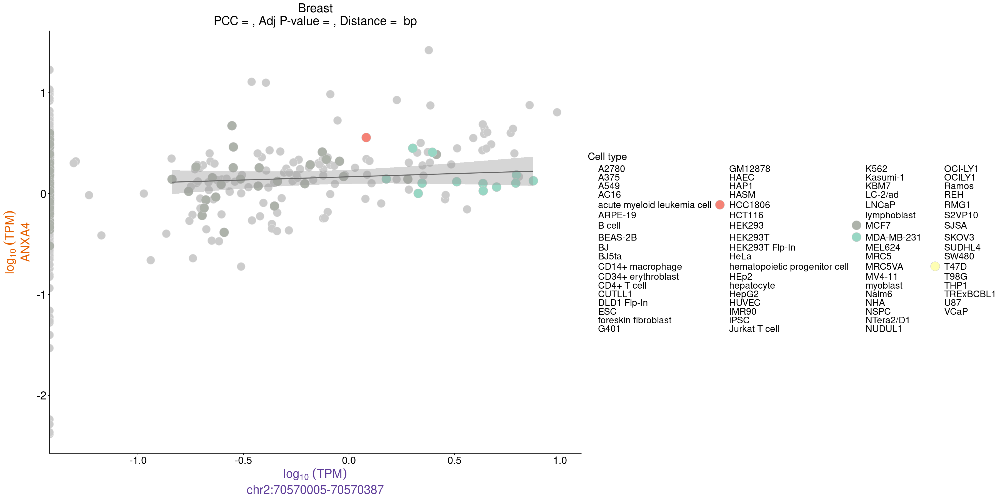

In [90]:
options(repr.plot.width=30, repr.plot.height=15) 

ANXA4_breast_cell <- plot_transcript_pairs_txptID_col_cell(normalized_counts = genes_bidir_counts_filtered,
                                                 datatable_pairs = corr_sig_strict_DT,
                                                 nsample = 751,
                                                 gene_id = "ANXA4:NM_001153.5",
                                                 bidir_id = "chr2:70570005-70570387",
                                                 metadata_df = metadata_celltype,
                                                 cols = mycolors3,
                                                 tissue_id = "breast") 

# Session information

In [117]:
sessionInfo()

R version 4.4.0 (2024-04-24)
Platform: x86_64-pc-linux-gnu
Running under: CentOS Linux 7 (Core)

Matrix products: default
BLAS/LAPACK: /usr/lib64/libopenblasp-r0.3.3.so;  LAPACK version 3.8.0

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

time zone: America/Denver
tzcode source: system (glibc)

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] dplyr_1.1.4           WGCNA_1.73            fastcluster_1.2.6    
[4] dynamicTreeCut_1.63-1 RColorBrewer_1.1-3    cowplot_1.1.3        
[7] ggplot2_3.5.1         data.table_1.16.2    

loaded via a namespace (and not attached):
 [1] DBI_1.2.3               gr